# Notebook Purpose

This notebook will analyse the bank rate changes over time and the sentiment expressed across the same time. 

The goal is to locate examples of 'soft influence' being performed by BOE.

# Importing relevant libraries.

In [1]:
# Import relevant libraries.
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from datetime import datetime
import seaborn as sns
import warnings

# Suppress FutureWarnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Reading in the data sets.

In [2]:
# Reading in the data.
speeches = pd.read_csv('uk_speeches_new_NLP.csv')
bank_rates = pd.read_csv('Bank_Rates.csv')
rate_votes = pd.read_csv('rate_votes.csv')

# Viewing the DataFrames.
print('UK Speeches:\n--------------------\n')
print(speeches.head())
print('\n--------------------\n')
print('Bank Rates:\n--------------------\n')
print(bank_rates.head())
print('\n--------------------\n')
print('Rate Votes:\n--------------------\n')
print(rate_votes.head())

UK Speeches:
--------------------

    reference        date                                         title  \
0  boe_s14528  1997-02-25                                        Speech   
1  boe_s14529  1997-06-12                          Lord Mayor's Banquet   
2  boe_s14530  1997-06-24                    The Sixteenth Mais Lecture   
3  boe_s14531  1997-10-29  The Inflation Target five years on - lecture   
4  boe_s14532  1997-11-18          Developments in UK financial markets   

             author  is_gov  \
0     Edward George    True   
1     Edward George    True   
2     Edward George    True   
3       Mervyn King   False   
4  Ian Plenderleith   False   

                                                text  length  word_count  \
0  speech by the governor at the queen elizabeth ...   12526        2050   
1  lord mayors banquet speech given by edward geo...   11447        1878   
2  the sixteenth mais lecture speech given by edw...   22869        3720   
3  the inflation target

## Formatting the data types where appropriate. (This can be removed when the code is centralised).

<b> Speeches:

In [3]:
# Checking the 'is_gov' column has the correct values.
speeches['is_gov'].value_counts()

is_gov
False    1099
True      234
Name: count, dtype: int64

In [4]:
# Setting date to datetime.
speeches['date'] = pd.to_datetime(speeches['date'])

In [5]:
# Rename the columns to remove the word 'length' from column names.
speeches.rename(columns={'negative_normalised_length': 'negative_normalised', 
                         'positive_normalised_length': 'positive_normalised',
                         'uncertainty_normalised_length': 'uncertainty_normalised', 
                         'litigious_normalised_length': 'litigious_normalised',
                         'strong_normalised_length': 'strong_normalised', 
                         'weak_normalised_length': 'weak_normalised',
                         'constraining_normalised_length': 'constraining_normalised'}, inplace=True)

# Check the column names after renaming
print(speeches.columns)


Index(['reference', 'date', 'title', 'author', 'is_gov', 'text', 'length',
       'word_count', 'title_nlp', 'negative', 'positive', 'uncertainty',
       'litigious', 'strong', 'weak', 'constraining', 'negative_normalised',
       'positive_normalised', 'uncertainty_normalised', 'litigious_normalised',
       'strong_normalised', 'weak_normalised', 'constraining_normalised'],
      dtype='object')


<b> Bank Rates:

In [6]:
# Setting date to datetime.
bank_rates['date'] = pd.to_datetime(bank_rates['date'], format = '%d/%m/%Y')

# Verifying the data types of the other columns.
print('Bank Rates Data Types:\n--------------------\n')
print(bank_rates.dtypes)

Bank Rates Data Types:
--------------------

date         datetime64[ns]
bank_rate           float64
change              float64
dtype: object


<b> Rate Votes:

# Plotting Rate Decisions

<Figure size 1500x800 with 0 Axes>

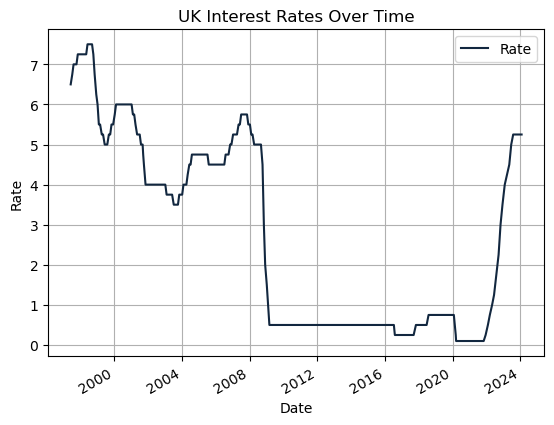

In [8]:
# Define the custom colors.        - Remove this when adding back into final code stack - 
BoE_blue = '#12273f'
light_blue = '#34BCC1'

# Plotting rates over time.
plt.figure(figsize=(15, 8))

bank_rates.plot(x='date', y='bank_rate', label='Rate', 
               color = BoE_blue)

plt.title('UK Interest Rates Over Time')
plt.xlabel('Date')
plt.ylabel('Rate')
plt.legend()
plt.grid(True)
plt.show()

<Figure size 1500x800 with 0 Axes>

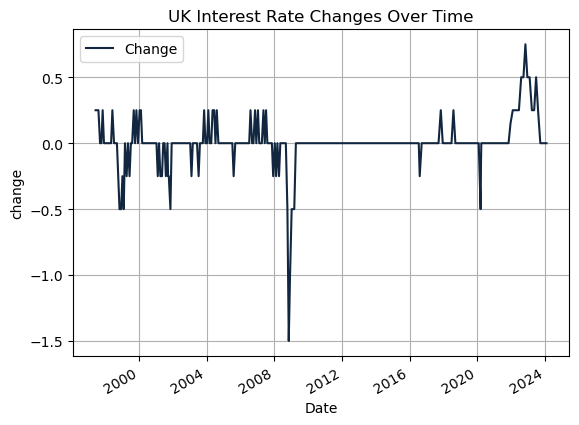

In [9]:
# Define the custom colors.        - Remove this wehn adding back into final code stack - 
BoE_blue = '#12273f'
light_blue = '#3CD7D9'

# Plotting rates over time.
plt.figure(figsize=(15, 8))

bank_rates.plot(x='date', y='change', label='Change', 
               color = BoE_blue)

plt.title('UK Interest Rate Changes Over Time')
plt.xlabel('Date')
plt.ylabel('change')
plt.legend()
plt.grid(True)
plt.show()

<b> Thoughts:

Both graphs show us that 2008-2009 and 2020-2022 would be the most likely occasions in which forward guidance would have been deployed. These periods saw both the largest overall changes in interest rates, but also the most significant changes seen in individual committee votes.

We will use this to guide our analysis, focussing on these areas specifically.

First, we will plot the speeches data....

# Mentions of interest rate.

For the sake of due dilligence, I will also look for evidence of the interest rates leaking into the speeches, and cross check this with certain sentiment.

<b> Calculating mentions of 'interest', 'interest rate' etc:

In [10]:
%%time
# In order to preform this process we will need to import re.
import re

# We will add three new columns, one counting instances of, and two others instances where it might be suggested they are to be increased/decreased.
# The text is already lower case, so we can set to IGNORECASE.

# Mention of interest rates: 'interest rate', 'interest_rates', 'bank rate', 'bank rates'.
rates_mentioned = (speeches['text']
    .str.count(r'\binterest rate\b', flags=re.IGNORECASE) +
    speeches['text']
    .str.count(r'\binterest rates\b', flags=re.IGNORECASE) + 
    speeches['text']
    .str.count(r'\bbank rate\b', flags=re.IGNORECASE) + 
    speeches['text']
    .str.count(r'\bbank rates\b', flags=re.IGNORECASE)
                   
)

# Hint of interest rates rising: 
# 'increase the interest rate', 'increase interest_rates', ' increase the bank rate', 'increase bank rates',
# 'raise the interest rate', 'raise interest_rates', ' raise the bank rate', 'raise bank rates'.
# 'raising the interest rate', 'raising interest_rates', ' raising the bank rate', 'raising bank rates'.
rates_up_mentioned = (
    speeches['text']
    .str.count(r'\bincrease the interest rate\b', flags=re.IGNORECASE) +
    speeches['text']
    .str.count(r'\bincrease interest_rates\b', flags=re.IGNORECASE) + 
    speeches['text']
    .str.count(r'\bincrease the bank rate\b', flags=re.IGNORECASE) + 
    speeches['text']
    .str.count(r'\bincrease bank rates\b', flags=re.IGNORECASE) +
    speeches['text']
    .str.count(r'\braise the interest rate\b', flags=re.IGNORECASE) +
    speeches['text']
    .str.count(r'\braise interest_rates\b', flags=re.IGNORECASE) + 
    speeches['text']
    .str.count(r'\braise the bank rate\b', flags=re.IGNORECASE) + 
    speeches['text']
    .str.count(r'\braise bank rates\b', flags=re.IGNORECASE) +
    speeches['text']
    .str.count(r'\braising the interest rate\b', flags=re.IGNORECASE) +
    speeches['text']
    .str.count(r'\braising interest_rates\b', flags=re.IGNORECASE) + 
    speeches['text']
    .str.count(r'\braising the bank rate\b', flags=re.IGNORECASE) + 
    speeches['text']
    .str.count(r'\braising bank rates\b', flags=re.IGNORECASE)
)

# Hint of interest rates falling: 
# 'decrease the interest rate', 'decrease interest_rates', ' decrease the bank rate', 'decrease bank rates',
# 'lower the interest rate', 'lower interest_rates', ' lower the bank rate', 'lower bank rates'.
# 'lowering the interest rate', 'lowering interest_rates', ' lowering the bank rate', 'lowering bank rates'.
# 'relax the interest rate', 'relax interest_rates', ' relax the bank rate', 'relax bank rates'.
# 'relaxing the interest rate', 'relaxing interest_rates', ' relaxing the bank rate', 'relaxing bank rates'.
rates_down_mentioned = (
    speeches['text']
    .str.count(r'\bdecrease the interest rate\b', flags=re.IGNORECASE) +
    speeches['text']
    .str.count(r'\bdecrease interest_rates\b', flags=re.IGNORECASE) + 
    speeches['text']
    .str.count(r'\bdecrease the bank rate\b', flags=re.IGNORECASE) + 
    speeches['text']
    .str.count(r'\bdecrease bank rates\b', flags=re.IGNORECASE) +
    speeches['text']
    .str.count(r'\blower the interest rate\b', flags=re.IGNORECASE) +
    speeches['text']
    .str.count(r'\blower interest_rates\b', flags=re.IGNORECASE) + 
    speeches['text']
    .str.count(r'\blower the bank rate\b', flags=re.IGNORECASE) + 
    speeches['text']
    .str.count(r'\blower bank rates\b', flags=re.IGNORECASE) +
    speeches['text']
    .str.count(r'\blowering the interest rate\b', flags=re.IGNORECASE) +
    speeches['text']
    .str.count(r'\blowering interest_rates\b', flags=re.IGNORECASE) + 
    speeches['text']
    .str.count(r'\blowering the bank rate\b', flags=re.IGNORECASE) + 
    speeches['text']
    .str.count(r'\blowering bank rates\b', flags=re.IGNORECASE) +
    speeches['text']
    .str.count(r'\brelax the interest rate\b', flags=re.IGNORECASE) +
    speeches['text']
    .str.count(r'\brelax interest_rates\b', flags=re.IGNORECASE) + 
    speeches['text']
    .str.count(r'\brelax the bank rate\b', flags=re.IGNORECASE) + 
    speeches['text']
    .str.count(r'\brelax bank rates\b', flags=re.IGNORECASE) +
    speeches['text']
    .str.count(r'\brelaxing the interest rate\b', flags=re.IGNORECASE) +
    speeches['text']
    .str.count(r'\brelaxing interest_rates\b', flags=re.IGNORECASE) + 
    speeches['text']
    .str.count(r'\brelaxing the bank rate\b', flags=re.IGNORECASE) + 
    speeches['text']
    .str.count(r'\brelaxing bank rates\b', flags=re.IGNORECASE)
)

# Add the new column to the dataframe
speeches['rates_mentioned'] = rates_mentioned
speeches['rates_up_mentioned'] = rates_up_mentioned
speeches['rates_down_mentioned'] = rates_down_mentioned

# Display the dataframe with the new column
print(speeches.head())

    reference       date                                         title  \
0  boe_s14528 1997-02-25                                        Speech   
1  boe_s14529 1997-06-12                          Lord Mayor's Banquet   
2  boe_s14530 1997-06-24                    The Sixteenth Mais Lecture   
3  boe_s14531 1997-10-29  The Inflation Target five years on - lecture   
4  boe_s14532 1997-11-18          Developments in UK financial markets   

             author  is_gov  \
0     Edward George    True   
1     Edward George    True   
2     Edward George    True   
3       Mervyn King   False   
4  Ian Plenderleith   False   

                                                text  length  word_count  \
0  speech by the governor at the queen elizabeth ...   12526        2050   
1  lord mayors banquet speech given by edward geo...   11447        1878   
2  the sixteenth mais lecture speech given by edw...   22869        3720   
3  the inflation target five years on lecture del...   49577    

Text(0.5, 1.0, 'Count of Speeches Mentioning Interest Rates')

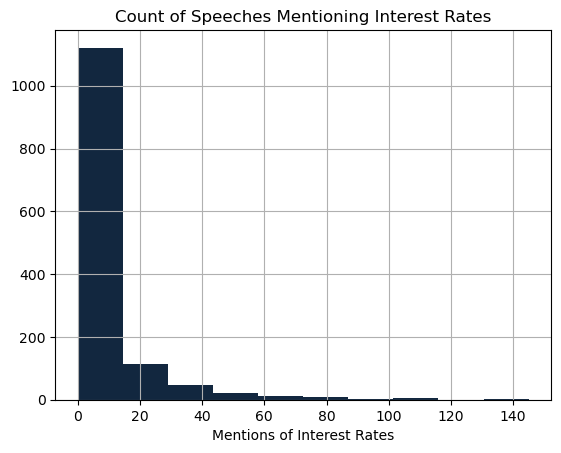

In [11]:
# Let's visualise this with a basic histogram.
# Plotting 'rates_mentioned'.
speeches['rates_mentioned'].hist(color=BoE_blue)

# Add labels and title.
plt.xlabel('Mentions of Interest Rates')
plt.title('Count of Speeches Mentioning Interest Rates')

Text(0.5, 1.0, 'Count of Speeches Mentioning Interest Rates Increasing')

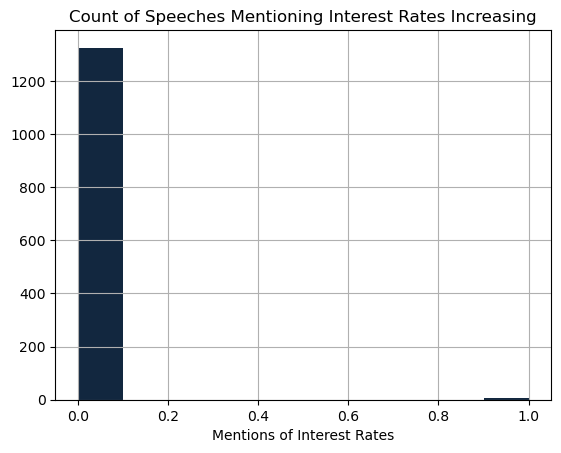

In [12]:
# Let's visualise this with a basic histogram.
# Plotting 'rates_up_mentioned'.
speeches['rates_up_mentioned'].hist(color=BoE_blue)

# Add labels and title.
plt.xlabel('Mentions of Interest Rates')
plt.title('Count of Speeches Mentioning Interest Rates Increasing')

Text(0.5, 1.0, 'Count of Speeches Mentioning Interest Rates Decreasing')

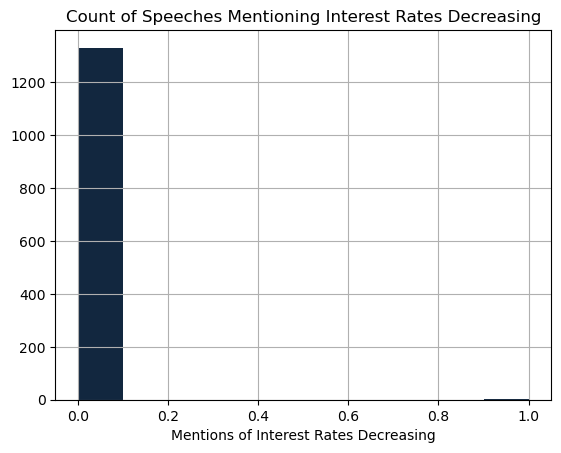

In [13]:
# Let's visualise this with a basic histogram.
# Plotting 'rates_down_mentioned'.
speeches['rates_down_mentioned'].hist(color=BoE_blue)

# Add labels and title.
plt.xlabel('Mentions of Interest Rates Decreasing')
plt.title('Count of Speeches Mentioning Interest Rates Decreasing')

<b> Thoughts: <b>

Interest rates are mentioned a lot, in at least one speech over 120 times, however it seems nakedly mentioning a directional change is unheard of. I suppose this is to be expected, as this will be a closely guarded secret. We will therefore need to rely on sentiments to reveal forward guidance. Very subtle. 


# Plotting the speech sentiment.

In order to plot sentiment, we will need to group first. I am going to group by date and subsequently plot visualisations with a 30-day rolling average. This is on a short enough time frame that we might reasonably expect forward guidance to manifest (forward guidance in Jan for an expected change in June would dissapear if we aggregated by year). Equally, it is long enough that we remove unhelpful levels of granularity. The aim is to see sentiment slowly introduced to the discourse. 

We will be grouping next. We can drop all non numerical columns.

In [14]:
# Dropping non numeric columns, and columns we do not need for subsequent analysis here.
# We will strip out all objects, meaning we will lose the ability later to look purely at governer sentiment.

speeches_agg = speeches[['date', 'negative_normalised', 'positive_normalised', 
                        'uncertainty_normalised', 'litigious_normalised', 'strong_normalised', 'weak_normalised', 
                        'constraining_normalised', 'rates_mentioned']]

# Group the sentiment by date. Total sentiment = tot_sent. Avergae sentiment = av_sent.

tot_sent = speeches_agg.groupby('date').sum()
av_sent = speeches_agg.groupby('date').mean()

# Viewing the DataFrames.
print('Total Sentiment by Day:\n--------------------\n')
print(tot_sent.head())
print('\n--------------------\n')
print('Average Sentiment by Day:\n--------------------\n')
print(av_sent.head())

Total Sentiment by Day:
--------------------

            negative_normalised  positive_normalised  uncertainty_normalised  \
date                                                                           
1997-02-25             0.002714             0.002874                0.001836   
1997-06-12             0.003320             0.003669                0.002271   
1997-06-24             0.002449             0.004198                0.002055   
1997-10-29             0.002521             0.002360                0.003046   
1997-11-18             0.000695             0.003939                0.001390   

            litigious_normalised  strong_normalised  weak_normalised  \
date                                                                   
1997-02-25              0.000399           0.001198         0.001038   
1997-06-12              0.000961           0.001485         0.001398   
1997-06-24              0.000568           0.001443         0.001399   
1997-10-29              0.000182 

<b> Basic plots: <b>

I will plot sentiment, both totals and averages, and each with a 30 day rolling average. For now I will leave out the legend and indication of significant events in order to reduce noise.

In [15]:
# First, let's define the color map which we will use for each sentiment.
colour_map = {
    'positive_normalised': '#FF9173',  # Peach
    'negative_normalised': '#9E71FE',  # Purple
    'uncertainty_normalised': '#A5D700',  # Green
    'strong_normalised': '#5297FF',  # Blue
    'weak_normalised': '#FE015B',  # Red
    'litigious_normalised': '#3CD7D9',  # Aqua
    'constraining_normalised': '#C0A033'  # Dark Gold
}

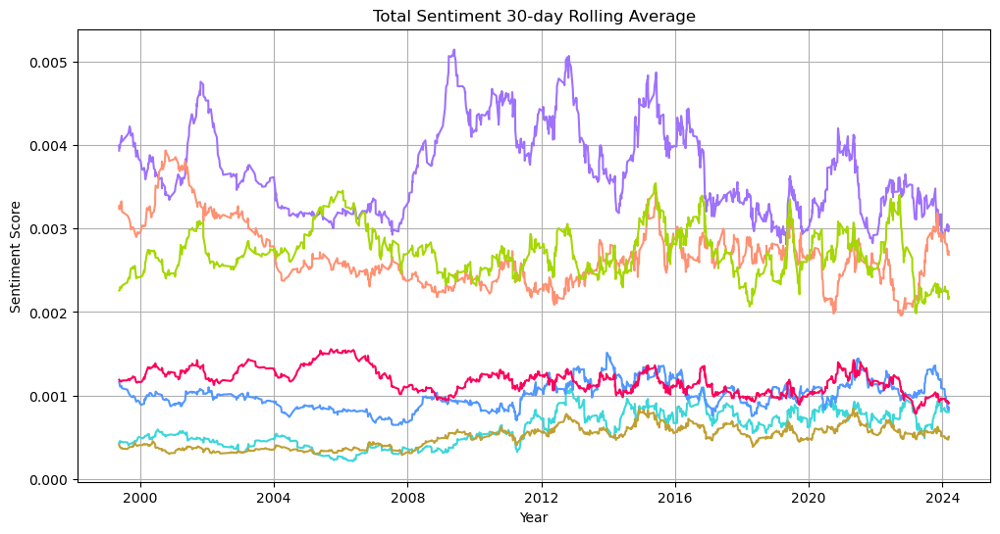

In [16]:
# Plot sentiment totals, 30 day rolling average.
plt.figure(figsize=(12, 6))

# Calculate the rolling average for each sentiment category
window = 30
for sentiment in ['negative_normalised', 'positive_normalised', 'uncertainty_normalised', 'litigious_normalised', 
                  'strong_normalised', 'weak_normalised', 'constraining_normalised']:
    rolling_avg = tot_sent[sentiment].rolling(window=window).mean()
    plt.plot(tot_sent.index, rolling_avg, color=colour_map[sentiment])

plt.title('Total Sentiment 30-day Rolling Average')
plt.xlabel('Year')
plt.ylabel('Sentiment Score')
plt.grid(True)
plt.show()


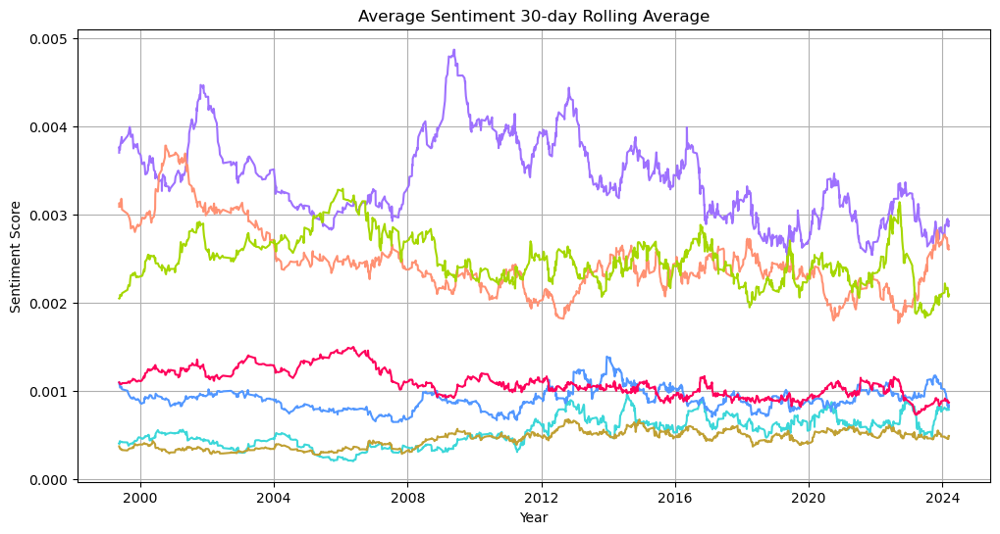

In [17]:
# Plot sentiment totals, 30 day rolling average.
plt.figure(figsize=(12, 6))

# Calculate the rolling average for each sentiment category
window = 30
for sentiment in ['negative_normalised', 'positive_normalised', 'uncertainty_normalised', 'litigious_normalised', 'strong_normalised', 'weak_normalised', 'constraining_normalised']:
    rolling_avg = av_sent[sentiment].rolling(window=window).mean()
    plt.plot(av_sent.index, rolling_avg, color = colour_map[sentiment])

plt.title('Average Sentiment 30-day Rolling Average')
plt.xlabel('Year')
plt.ylabel('Sentiment Score')
plt.grid(True)
plt.show()


<b> Okay, time to pause and define our terms a bit.: <b>

Tot_sent: this is the total sentiment on a given day, averaged over a 30 day period. This would mean that if multiple speeches occur on a single day, this volume of sentiment is captured and leaks into the next 30 days. 

Av_sent: this is the average sentiment on a given day, averaged over a 30 day period. This would mean that if multiple speeches occur on a single day, this volume of sentiment is NOT captured and does not leak into the next 30 days. Instead, this measurement captures the 'average sentiment output across all speakers'.

<b> In summary: <b>

Tot_sent reflects the volume of sentiment delivered. We might call this the 'Forward Guidance Volume'.

Av_sent reflects the Bank's intended sentiment output. We might call this the 'Forward Guidance Message'.

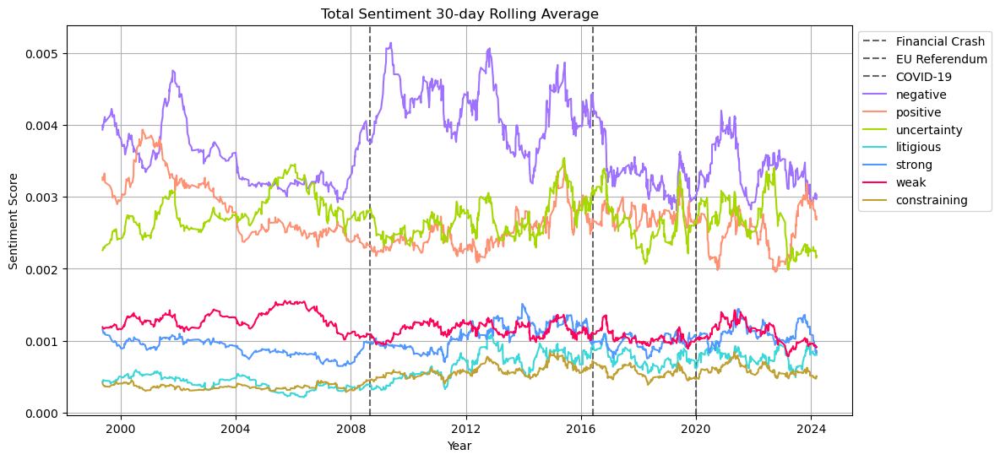

In [18]:
# Plot the sentiment scores over time with a 30-day rolling average.
plt.figure(figsize=(12, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2008-09-01'), color='black', alpha=0.6, linestyle='--', label='Financial Crash')
plt.axvline(pd.Timestamp('2016-06-01'), color='black', alpha=0.6, linestyle='--', label='EU Referendum')
plt.axvline(pd.Timestamp('2020-01-01'), color='black', alpha=0.6, linestyle='--', label='COVID-19')

# Calculate the rolling average for each sentiment category.
window = 30
for sentiment in ['negative_normalised', 'positive_normalised', 'uncertainty_normalised', 'litigious_normalised', 
                  'strong_normalised', 'weak_normalised', 'constraining_normalised']:
    rolling_avg = tot_sent[sentiment].rolling(window=window).mean()
    sentiment_label = sentiment.replace('_normalised', '')               # Remove '_normalised' from the sentiment label.
    plt.plot(tot_sent.index, rolling_avg, label=sentiment_label, color=colour_map[sentiment])

plt.title('Total Sentiment 30-day Rolling Average')
plt.xlabel('Year')
plt.ylabel('Sentiment Score')
plt.legend()

# Place the legend outside the graph.
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

plt.grid(True)
plt.show()


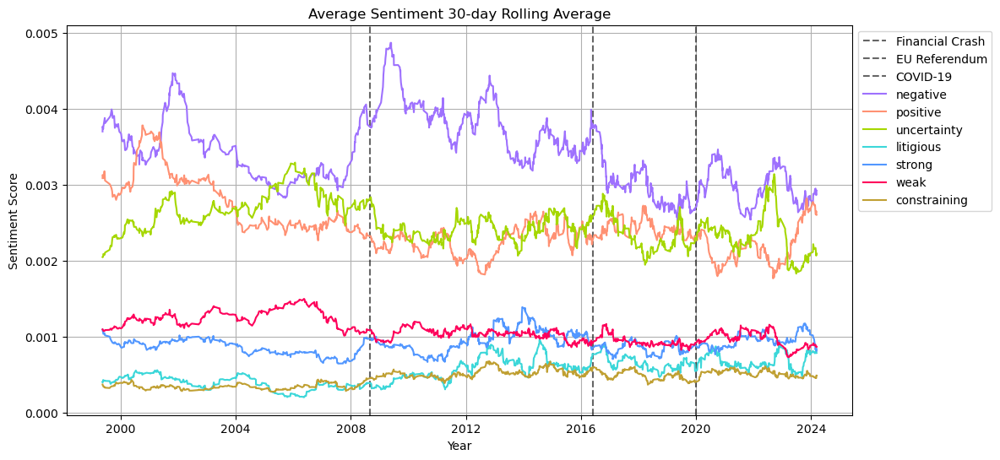

In [19]:
# Plot the sentiment scores over time with a 30-day rolling average.
plt.figure(figsize=(12, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2008-09-01'), color='black', alpha=0.6, linestyle='--', label='Financial Crash')
plt.axvline(pd.Timestamp('2016-06-01'), color='black', alpha=0.6, linestyle='--', label='EU Referendum')
plt.axvline(pd.Timestamp('2020-01-01'), color='black', alpha=0.6, linestyle='--', label='COVID-19')

# Calculate the rolling average for each sentiment category.
window = 30
for sentiment in ['negative_normalised', 'positive_normalised', 'uncertainty_normalised', 'litigious_normalised', 
                  'strong_normalised', 'weak_normalised', 'constraining_normalised']:
    rolling_avg = av_sent[sentiment].rolling(window=window).mean()
    sentiment_label = sentiment.replace('_normalised', '')               # Remove '_normalised' from the sentiment label.
    plt.plot(av_sent.index, rolling_avg, label=sentiment_label, color=colour_map[sentiment])

plt.title('Average Sentiment 30-day Rolling Average')
plt.xlabel('Year')
plt.ylabel('Sentiment Score')
plt.legend()

# Place the legend outside the graph.
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

plt.grid(True)
plt.show()


<b> Thoughts: <b>

I will generally ring fence positive, negative and uncertain from strong, weak and constraining. The magnitudes of the first group are several times higher than the second. 

Next, we will focus in on two times periods, 2008 and 2022.

# Total Sentiment vs Bank Rate.

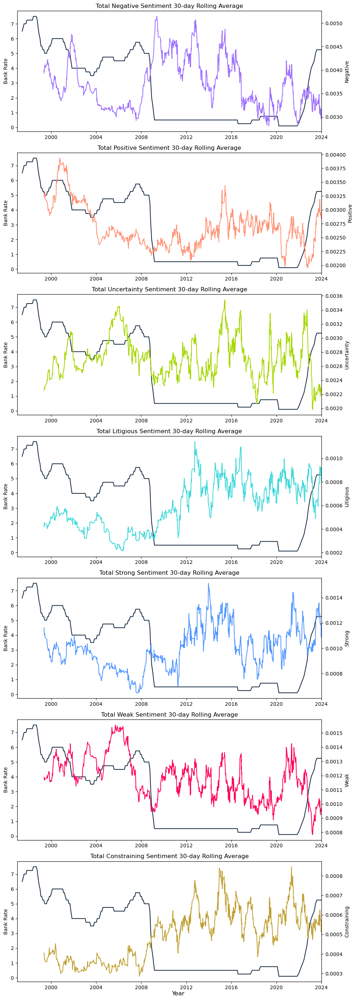

In [20]:
# Convert date columns to datetime objects and set the index of bank_rates to the date.               
bank_rates['date'] = pd.to_datetime(bank_rates['date'])
tot_sent.index = pd.to_datetime(tot_sent.index)

# Create subplots. We will do seven as there are seven sentiments.
fig, axes = plt.subplots(7, 1, figsize=(10, 28))

# List of sentiment column names.
sentiments = ['negative_normalised', 'positive_normalised', 'uncertainty_normalised', 'litigious_normalised', 
              'strong_normalised', 'weak_normalised', 'constraining_normalised']

# List of titles for each subplot.
titles = ['Total Negative Sentiment 30-day Rolling Average', 'Total Positive Sentiment 30-day Rolling Average', 
          'Total Uncertainty Sentiment 30-day Rolling Average', 'Total Litigious Sentiment 30-day Rolling Average', 
          'Total Strong Sentiment 30-day Rolling Average', 'Total Weak Sentiment 30-day Rolling Average', 
          'Total Constraining Sentiment 30-day Rolling Average']

# Plot each column on separate subplot.
for i in range(len(sentiments)):
    ax = axes[i]
    ax.set_title(titles[i])
    ax.set_xlim(pd.Timestamp('1997-01-01'), pd.Timestamp('2024-01-01'))  # Set date limits.
    ax1 = sns.lineplot(data=bank_rates, x='date', y='bank_rate', color=BoE_blue, ax=ax)
    ax1.set_ylabel('Bank Rate')
    ax2 = ax.twinx()
    
    # Calculate the rolling average for the current sentiment category.
    window = 30
    rolling_avg = tot_sent[sentiments[i]].rolling(window=window).mean()
    ax2.plot(tot_sent.index, rolling_avg, 
             color=colour_map[sentiments[i]],                # We need to refer to 'sentiments[i]' here. 
             label='30-day Rolling Average')

    # Set the name for the second y label. 
    ax2.set_ylabel(titles[i].split()[1])
    ax2.tick_params(axis='y')

    # Removing the x-axis name for each plot.
    ax.set_xlabel('')

# Adding a common x-axis label beneath all of the plots.
fig.supxlabel('Year')

# Adjust layout.
plt.tight_layout()

plt.show()


# Average Sentiment vs Bank Rate.

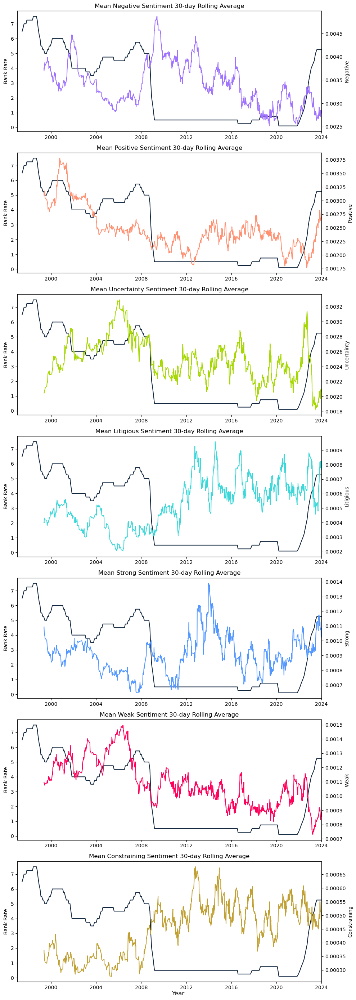

In [21]:
# Create subplots. We will do seven as there are seven sentiments.
fig, axes = plt.subplots(7, 1, figsize=(10, 28))

# List of sentiment column names.
sentiments = ['negative_normalised', 'positive_normalised', 'uncertainty_normalised', 'litigious_normalised', 
              'strong_normalised', 'weak_normalised', 'constraining_normalised']

# List of titles for each subplot.
titles = ['Mean Negative Sentiment 30-day Rolling Average', 'Mean Positive Sentiment 30-day Rolling Average', 
          'Mean Uncertainty Sentiment 30-day Rolling Average', 'Mean Litigious Sentiment 30-day Rolling Average', 
          'Mean Strong Sentiment 30-day Rolling Average', 'Mean Weak Sentiment 30-day Rolling Average', 
          'Mean Constraining Sentiment 30-day Rolling Average']

# Plot each column on separate subplot.
for i in range(len(sentiments)):
    ax = axes[i]
    ax.set_title(titles[i])
    ax.set_xlim(pd.Timestamp('1997-01-01'), pd.Timestamp('2024-01-01'))  # Set date limits.
    ax1 = sns.lineplot(data=bank_rates, x='date', y='bank_rate', color=BoE_blue, ax=ax)
    ax1.set_ylabel('Bank Rate')
    ax2 = ax.twinx()
    
    # Calculate the rolling average for the current sentiment category.
    window = 30
    rolling_avg = av_sent[sentiments[i]].rolling(window=window).mean()                         # Change to av_sent.
    ax2.plot(av_sent.index, rolling_avg, 
             color=colour_map[sentiments[i]],                # We need to refer to 'sentiments[i]' here. 
             label='30-day Rolling Average')     # Change to av_sent here too.

    # Set the name for the second y label. 
    ax2.set_ylabel(titles[i].split()[1])
    ax2.tick_params(axis='y')

    # Removing the x-axis name for each plot.
    ax.set_xlabel('')

# Adding a common x-axis label beneath all of the plots.
fig.supxlabel('Year')

# Adjust layout.
plt.tight_layout()

plt.show()


# Total Sentiment vs Rate Change.

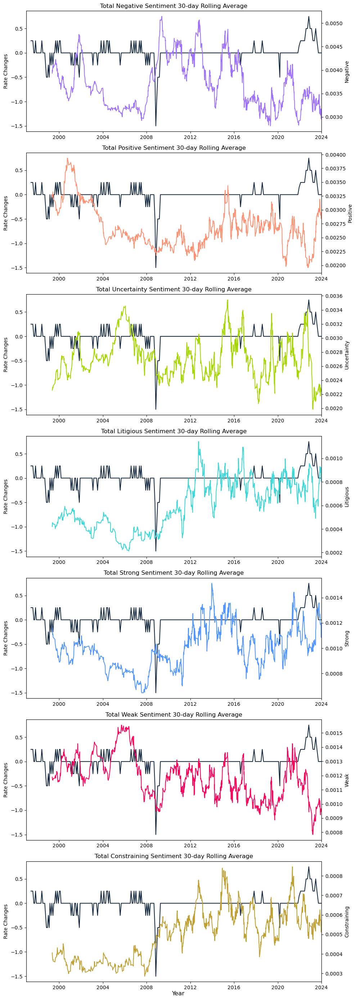

In [22]:
# Create subplots. We will do seven as there are seven sentiments.
fig, axes = plt.subplots(7, 1, figsize=(10, 28))

# List of sentiment column names.
sentiments = ['negative_normalised', 'positive_normalised', 'uncertainty_normalised', 'litigious_normalised', 
              'strong_normalised', 'weak_normalised', 'constraining_normalised']

# List of titles for each subplot.
titles = ['Total Negative Sentiment 30-day Rolling Average', 'Total Positive Sentiment 30-day Rolling Average', 
          'Total Uncertainty Sentiment 30-day Rolling Average', 'Total Litigious Sentiment 30-day Rolling Average', 
          'Total Strong Sentiment 30-day Rolling Average', 'Total Weak Sentiment 30-day Rolling Average', 
          'Total Constraining Sentiment 30-day Rolling Average']

# Plot each column on separate subplot.
for i in range(len(sentiments)):
    ax = axes[i]
    ax.set_title(titles[i])
    ax.set_xlim(pd.Timestamp('1997-01-01'), pd.Timestamp('2024-01-01'))  # Set date limits.
    ax1 = sns.lineplot(data=bank_rates, x='date', y='change', color=BoE_blue, ax=ax)         # Change to 'change'.
    ax1.set_ylabel('Rate Changes')
    ax2 = ax.twinx()
    
    # Calculate the rolling average for the current sentiment category.
    window = 30
    rolling_avg = tot_sent[sentiments[i]].rolling(window=window).mean()
    ax2.plot(tot_sent.index, rolling_avg, 
             color=colour_map[sentiments[i]],                # We need to refer to 'sentiments[i]' here. 
             label='30-day Rolling Average')

    # Set the name for the second y label. 
    ax2.set_ylabel(titles[i].split()[1])
    ax2.tick_params(axis='y')

    # Removing the x-axis name for each plot.
    ax.set_xlabel('')

# Adding a common x-axis label beneath all of the plots.
fig.supxlabel('Year')

# Adjust layout.
plt.tight_layout()

plt.show()


# Average Sentiment vs Rate Change.

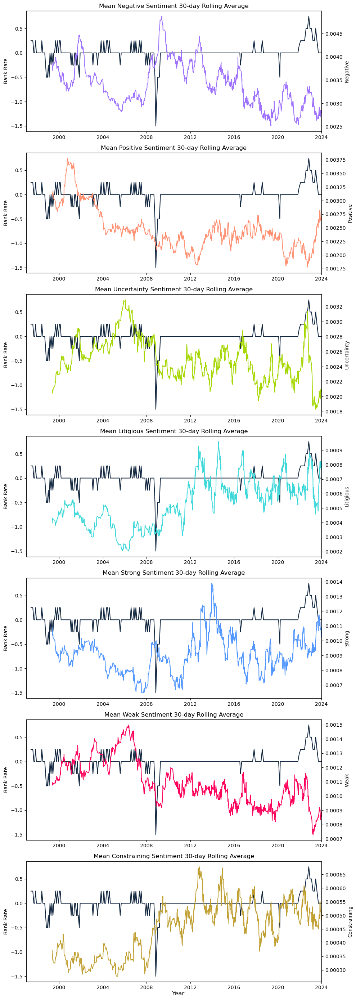

In [23]:
# Create subplots. We will do seven as there are seven sentiments.
fig, axes = plt.subplots(7, 1, figsize=(10, 28))

# List of sentiment column names.
sentiments = ['negative_normalised', 'positive_normalised', 'uncertainty_normalised', 'litigious_normalised', 
              'strong_normalised', 'weak_normalised', 'constraining_normalised']

# List of titles for each subplot.
titles = ['Mean Negative Sentiment 30-day Rolling Average', 'Mean Positive Sentiment 30-day Rolling Average', 
          'Mean Uncertainty Sentiment 30-day Rolling Average', 'Mean Litigious Sentiment 30-day Rolling Average', 
          'Mean Strong Sentiment 30-day Rolling Average', 'Mean Weak Sentiment 30-day Rolling Average', 
          'Mean Constraining Sentiment 30-day Rolling Average']

# Plot each column on separate subplot.
for i in range(len(sentiments)):
    ax = axes[i]
    ax.set_title(titles[i])
    ax.set_xlim(pd.Timestamp('1997-01-01'), pd.Timestamp('2024-01-01'))  # Set date limits.
    ax1 = sns.lineplot(data=bank_rates, x='date', y='change', color=BoE_blue, ax=ax)           # Change to 'change'.
    ax1.set_ylabel('Bank Rate')
    ax2 = ax.twinx()
    
    # Calculate the rolling average for the current sentiment category.
    window = 30
    rolling_avg = av_sent[sentiments[i]].rolling(window=window).mean()                         # Change to av_sent.
    ax2.plot(av_sent.index, rolling_avg, 
             color=colour_map[sentiments[i]],                # We need to refer to 'sentiments[i]' here. 
             label='30-day Rolling Average')                 # Change to av_sent here too.

    # Set the name for the second y label. 
    ax2.set_ylabel(titles[i].split()[1])
    ax2.tick_params(axis='y')

    # Removing the x-axis name for each plot.
    ax.set_xlabel('')

# Adding a common x-axis label beneath all of the plots.
fig.supxlabel('Year')

# Adjust layout.
plt.tight_layout()

plt.show()


<b> Thoughts: <b>

The following graphs are very interesting and should be looked at closer, for both 2008 and 2022:

- Total negative vs bank rate and rate change.
- Mean uncertainty vs bank rate.
- Mean constraining vs bank rate and rate change.

First we will generate some basic plots, capturing the full range of time.

## Basic plot:

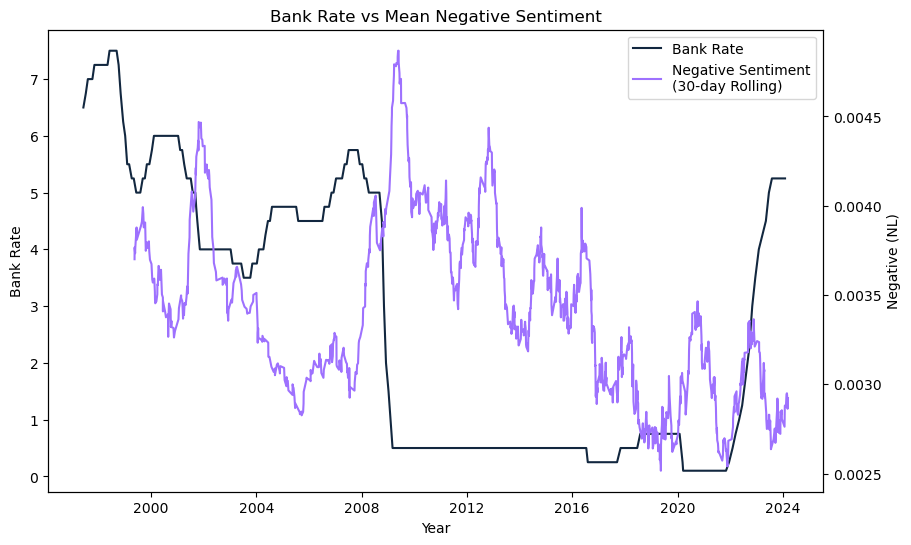

In [24]:
# First we will create a basic summary plot which we will then focus in on.
# Note that this plot is looking at av_sent which we will need to toggle.

# Create a new plot.
plt.figure(figsize=(10, 6))

# Plot bank rate on the primary y-axis.
ax1 = sns.lineplot(data=bank_rates, x='date', y='bank_rate', color=BoE_blue, label='Bank Rate')

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent['negative_normalised'].rolling(window=30).mean()
ax2 = ax1.twinx()
sns.lineplot(x=av_sent.index, y=rolling_avg, 
             color=colour_map['negative_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Negative Sentiment\n(30-day Rolling)', ax=ax2)

# Set y-axis labels.
ax1.set_ylabel('Bank Rate')
ax2.set_ylabel('Negative (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Bank Rate vs Mean Negative Sentiment')

# Combine handles and labels from both legends
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Create a single legend in the top right corner.
plt.legend(handles, labels, loc='upper right')

# Remove the individual legends.
ax1.get_legend().remove()

# Save the plot as a PNG file.
plt.savefig('Bank_Rate_vs_Mean_Negative30dr')

# Show the plot.
plt.show()


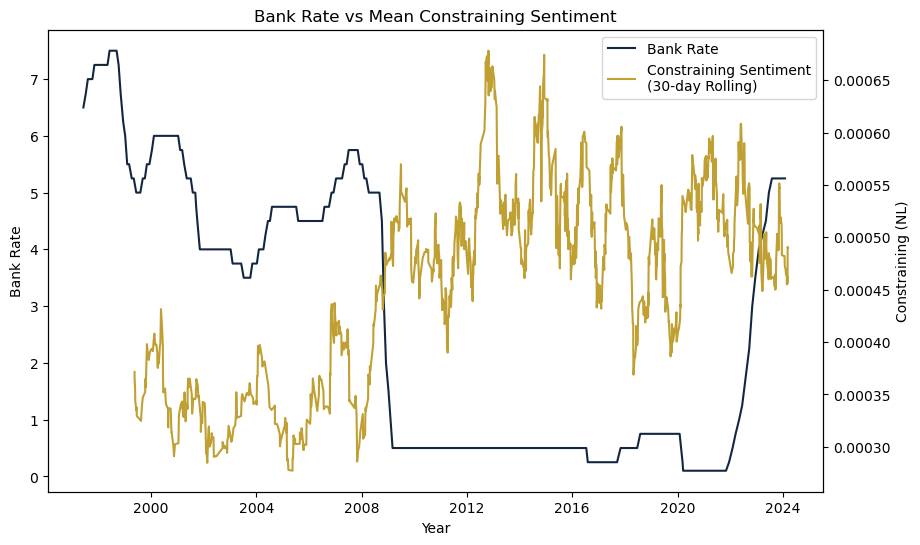

In [25]:
# Note that this plot is looking at av_sent which we will need to toggle.
# Create a new plot.
plt.figure(figsize=(10, 6))

# Plot bank rate on the primary y-axis.
ax1 = sns.lineplot(data=bank_rates, x='date', y='bank_rate', color=BoE_blue, label='Bank Rate')

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent['constraining_normalised'].rolling(window=30).mean()
ax2 = ax1.twinx()
sns.lineplot(x=av_sent.index, y=rolling_avg, 
             color=colour_map['constraining_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Constraining Sentiment\n(30-day Rolling)', ax=ax2)

# Set y-axis labels.
ax1.set_ylabel('Bank Rate')
ax2.set_ylabel('Constraining (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Bank Rate vs Mean Constraining Sentiment')

# Combine handles and labels from both legends
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Create a single legend in the top right corner.
plt.legend(handles, labels, loc='upper right')

# Remove the individual legends.
ax1.get_legend().remove()

# Save the plot as a PNG file.
plt.savefig('Bank_Rate_vs_Mean_Constraining30dr')

# Show the plot.
plt.show()


## 2008 'Total' Negative Sentiment plots:

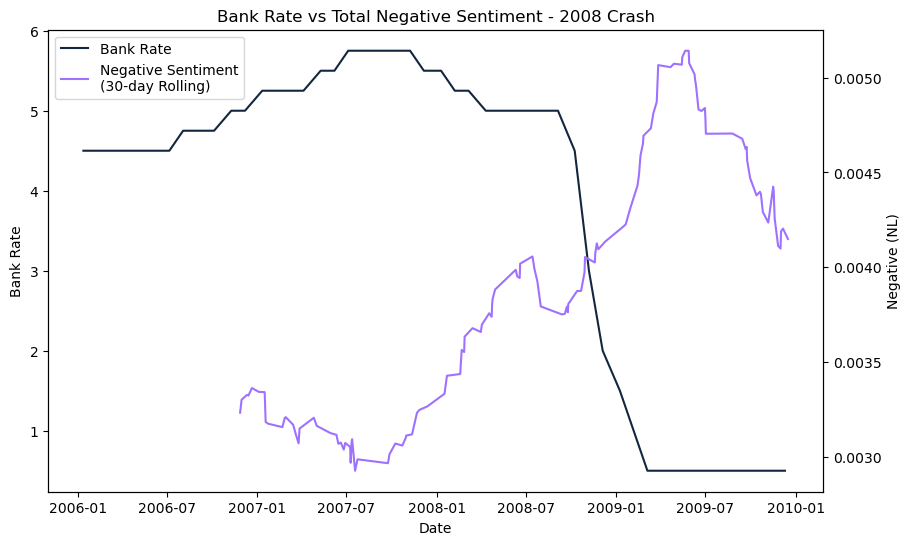

In [26]:
# Define the date range.
start_date = '2006-01-01'
end_date = '2009-12-31'

# Filter bank_rates and av_sent dataframes. Define tot or av sent here.
bank_rates_filtered = bank_rates[(bank_rates['date'] >= start_date) & (bank_rates['date'] <= end_date)]
tot_sent_filtered = tot_sent[(tot_sent.index >= start_date) & (tot_sent.index <= end_date)]

# Create a new plot.
plt.figure(figsize=(10, 6))

# Plot bank rate on the primary y-axis. 
ax1 = sns.lineplot(data=bank_rates_filtered, x='date', y='bank_rate', color=BoE_blue, label='Bank Rate')

# Plot the selected sentiment on the secondary y-axis. Define tot or av sent here.
rolling_avg = tot_sent_filtered['negative_normalised'].rolling(window=30).mean()
ax2 = ax1.twinx()
sns.lineplot(x=tot_sent_filtered.index, y=rolling_avg, 
             color=colour_map['negative_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Negative Sentiment\n(30-day Rolling)', ax=ax2)

# Set y-axis labels.
ax1.set_ylabel('Bank Rate')
ax2.set_ylabel('Negative (NL)')

# Set the x-axis label.
ax1.set_xlabel('Date')

# Set the title.
plt.title('Bank Rate vs Total Negative Sentiment - 2008 Crash')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Create a single legend in the top right corner.
plt.legend(handles, labels, loc='upper left')

# Remove the individual legends.
ax1.get_legend().remove()

# Show the plot.
plt.show()


# Adding lines for key dates.

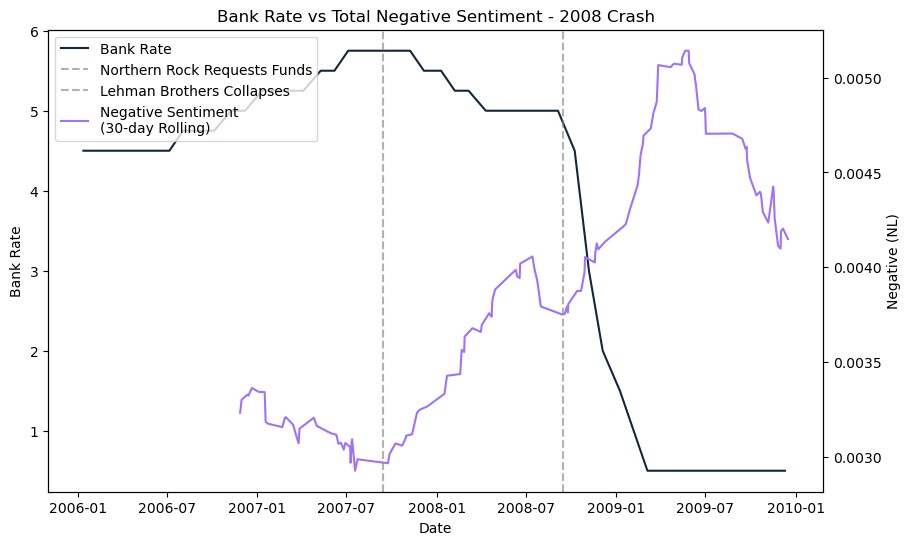

In [27]:
# Define the date range.
start_date = '2006-01-01'
end_date = '2009-12-31'

# Filter bank_rates and av_sent dataframes. Define tot or av sent here.
bank_rates_filtered = bank_rates[(bank_rates['date'] >= start_date) & (bank_rates['date'] <= end_date)]
tot_sent_filtered = tot_sent[(tot_sent.index >= start_date) & (tot_sent.index <= end_date)]

# Create a new plot.
plt.figure(figsize=(10, 6))

# Plot bank rate on the primary y-axis. Toggle from 'bank_rate' to 'change' here.
ax1 = sns.lineplot(data=bank_rates_filtered, x='date', y='bank_rate', color=BoE_blue, label='Bank Rate')


# Plot vertical dashed lines for significant dates.
significant_dates = [
    ('2007-09-14', 'Northern Rock Requests Funds'),
    ('2008-09-15', 'Lehman Brothers Collapses')
]

for date, label in significant_dates:
    ax1.axvline(x=pd.to_datetime(date), linestyle='--', color ='grey', alpha = 0.6, label=label)
    
# Plot the selected sentiment on the secondary y-axis. Define tot or av sent here.
rolling_avg = tot_sent_filtered['negative_normalised'].rolling(window=30).mean()
ax2 = ax1.twinx()
sns.lineplot(x=tot_sent_filtered.index, y=rolling_avg, 
             color=colour_map['negative_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Negative Sentiment\n(30-day Rolling)', ax=ax2)

# Set y-axis labels.
ax1.set_ylabel('Bank Rate')
ax2.set_ylabel('Negative (NL)')

# Set the x-axis label.
ax1.set_xlabel('Date')

# Set the title.
plt.title('Bank Rate vs Total Negative Sentiment - 2008 Crash')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Create a single legend in the top right corner.
plt.legend(handles, labels, loc='upper left')

# Remove the individual legends
ax1.get_legend().remove()

# Show the plot
plt.show()


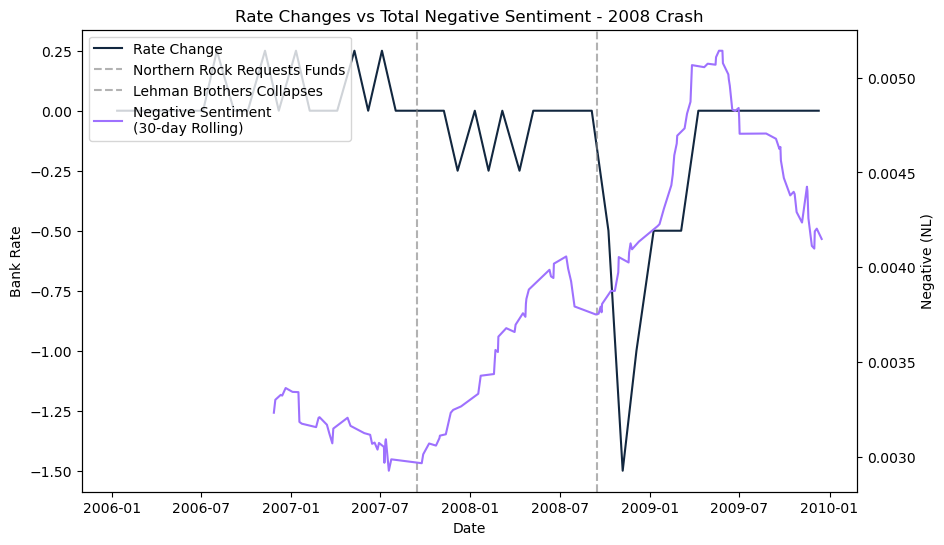

In [28]:
# Define the date range.
start_date = '2006-01-01'
end_date = '2009-12-31'

# Filter bank_rates and av_sent dataframes. Define tot or av sent here.
bank_rates_filtered = bank_rates[(bank_rates['date'] >= start_date) & (bank_rates['date'] <= end_date)]
tot_sent_filtered = tot_sent[(tot_sent.index >= start_date) & (tot_sent.index <= end_date)]

# Create a new plot.
plt.figure(figsize=(10, 6))

# Plot bank rate on the primary y-axis. Toggle from 'bank_rate' to 'change' here.
ax1 = sns.lineplot(data=bank_rates_filtered, x='date', y='change', color=BoE_blue, label='Rate Change')


# Plot vertical dashed lines for significant dates.
significant_dates = [
    ('2007-09-14', 'Northern Rock Requests Funds'),
    ('2008-09-15', 'Lehman Brothers Collapses')
]

for date, label in significant_dates:
    ax1.axvline(x=pd.to_datetime(date), linestyle='--', color ='grey', alpha = 0.6, label=label)
    
# Plot the selected sentiment on the secondary y-axis. Define tot or av sent here.
rolling_avg = tot_sent_filtered['negative_normalised'].rolling(window=30).mean()
ax2 = ax1.twinx()
sns.lineplot(x=tot_sent_filtered.index, y=rolling_avg, 
             color=colour_map['negative_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Negative Sentiment\n(30-day Rolling)', ax=ax2)

# Set y-axis labels.
ax1.set_ylabel('Bank Rate')
ax2.set_ylabel('Negative (NL)')

# Set the x-axis label.
ax1.set_xlabel('Date')

# Set the title.
plt.title('Rate Changes vs Total Negative Sentiment - 2008 Crash')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Create a single legend in the top right corner.
plt.legend(handles, labels, loc='upper left')

# Remove the individual legends
ax1.get_legend().remove()

# Show the plot
plt.show()


## 2008 'Average' Uncertain Sentiment Plot:

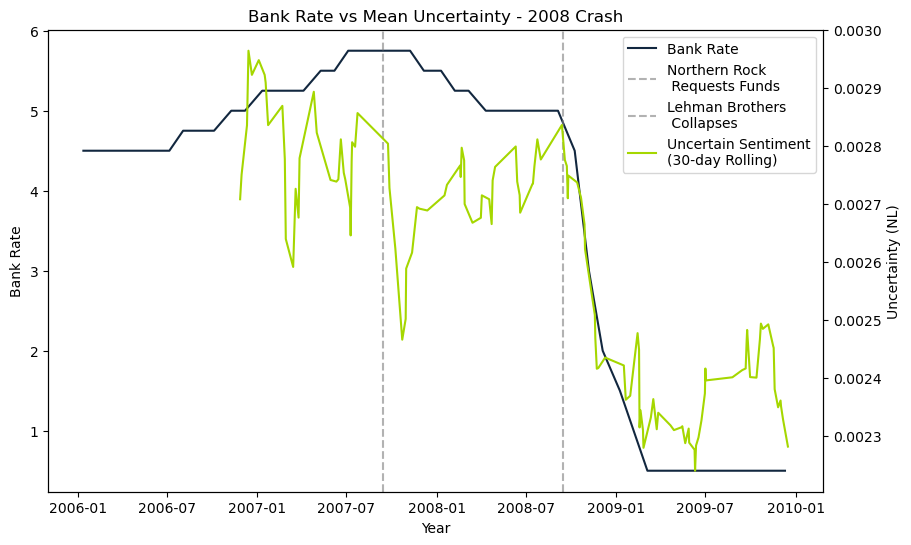

In [343]:
# Define the date range.
start_date = '2006-01-01'
end_date = '2009-12-31'

# Filter bank_rates and av_sent dataframes. Define tot or av sent here.
bank_rates_filtered = bank_rates[(bank_rates['date'] >= start_date) & (bank_rates['date'] <= end_date)]
av_sent_filtered = av_sent[(av_sent.index >= start_date) & (av_sent.index <= end_date)]                    # Here we have moved to 'av_sent'.

# Create a new plot.
plt.figure(figsize=(10, 6))

# Plot bank rate on the primary y-axis. Toggle from 'bank_rate' to 'change' here.
ax1 = sns.lineplot(data=bank_rates_filtered, x='date', y='bank_rate', color=BoE_blue, label='Bank Rate')    # Change to 'bank_rate'.

# Plot vertical dashed lines for significant dates.
significant_dates = [
    ('2007-09-14', 'Northern Rock\n Requests Funds'),
    ('2008-09-15', 'Lehman Brothers\n Collapses')
]
for date, label in significant_dates:
    ax1.axvline(x=pd.to_datetime(date), linestyle='--', color ='grey', alpha = 0.6, label=label)

# Plot the selected sentiment on the secondary y-axis. Define tot or av sent here.
rolling_avg = av_sent_filtered['uncertainty_normalised'].rolling(window=30).mean()             # Change to 'uncertainty'.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent_filtered.index, y=rolling_avg, 
             color=colour_map['uncertainty_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Uncertain Sentiment\n(30-day Rolling)', ax=ax2)

# Set y-axis labels.
ax1.set_ylabel('Bank Rate')                # Change the label here.
ax2.set_ylabel('Uncertainty (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Bank Rate vs Mean Uncertainty - 2008 Crash')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Create a single legend in the top right corner.
plt.legend(handles, labels, loc='upper right')

# Remove the individual legends
ax1.get_legend().remove()

# Save the plot as a PNG file.
plt.savefig('Bank_Rate_vs_Mean_Uncertainty30dr_(2008)')

# Show the plot
plt.show()

<b> Repeat the above with gridlines:

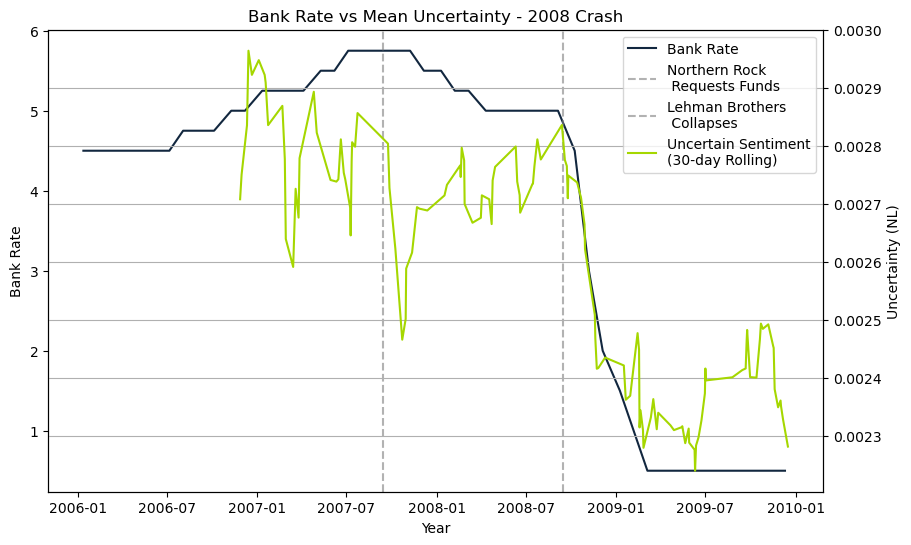

In [344]:
# Define the date range.
start_date = '2006-01-01'
end_date = '2009-12-31'

# Filter bank_rates and av_sent dataframes. Define tot or av sent here.
bank_rates_filtered = bank_rates[(bank_rates['date'] >= start_date) & (bank_rates['date'] <= end_date)]
av_sent_filtered = av_sent[(av_sent.index >= start_date) & (av_sent.index <= end_date)]                    # Here we have moved to 'av_sent'.

# Create a new plot.
plt.figure(figsize=(10, 6))

# Plot bank rate on the primary y-axis. Toggle from 'bank_rate' to 'change' here.
ax1 = sns.lineplot(data=bank_rates_filtered, x='date', y='bank_rate', color=BoE_blue, label='Bank Rate')    # Change to 'bank_rate'.

# Plot vertical dashed lines for significant dates.
significant_dates = [
    ('2007-09-14', 'Northern Rock\n Requests Funds'),
    ('2008-09-15', 'Lehman Brothers\n Collapses')
]
for date, label in significant_dates:
    ax1.axvline(x=pd.to_datetime(date), linestyle='--', color ='grey', alpha = 0.6, label=label)

# Plot the selected sentiment on the secondary y-axis. Define tot or av sent here.
rolling_avg = av_sent_filtered['uncertainty_normalised'].rolling(window=30).mean()             # Change to 'uncertainty'.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent_filtered.index, y=rolling_avg, 
             color=colour_map['uncertainty_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Uncertain Sentiment\n(30-day Rolling)', ax=ax2)

# Set y-axis labels.
ax1.set_ylabel('Bank Rate')                # Change the label here.
ax2.set_ylabel('Uncertainty (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Bank Rate vs Mean Uncertainty - 2008 Crash')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Create a single legend in the top right corner.
plt.legend(handles, labels, loc='upper right')

# Remove the individual legends
ax1.get_legend().remove()

# Add grid lines.
plt.grid(True)

# Save the plot as a PNG file.
plt.savefig('Bank_Rate_vs_Mean_Uncertainty30dr_(2008)')

# Show the plot
plt.show()

## 2008 'Mean' Constraining Sentiment Plot:

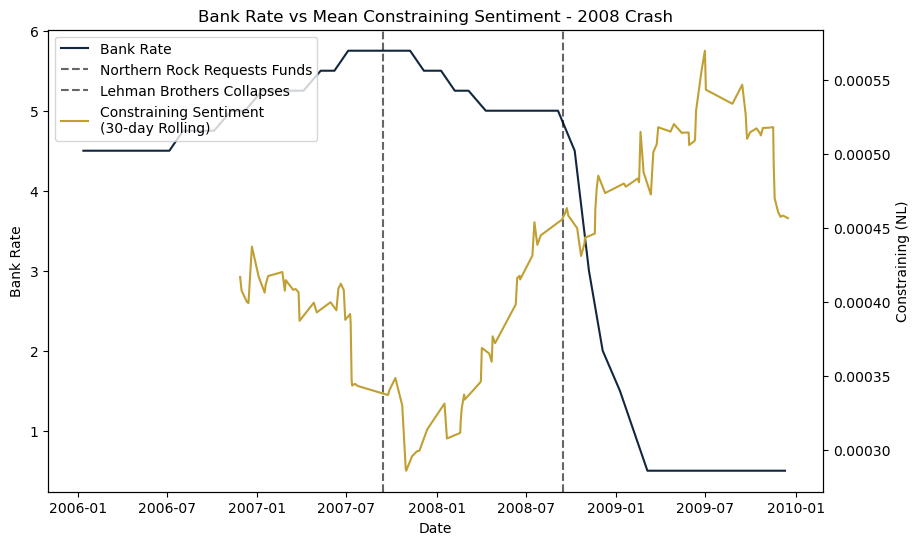

In [30]:
# Define the date range.
start_date = '2006-01-01'
end_date = '2009-12-31'

# Filter bank_rates and av_sent dataframes. Define tot or av sent here.
bank_rates_filtered = bank_rates[(bank_rates['date'] >= start_date) & (bank_rates['date'] <= end_date)]
av_sent_filtered = av_sent[(av_sent.index >= start_date) & (av_sent.index <= end_date)]

# Create a new plot.
plt.figure(figsize=(10, 6))

# Plot bank rate on the primary y-axis. Toggle from 'bank_rate' to 'change' here.
ax1 = sns.lineplot(data=bank_rates_filtered, x='date', y='bank_rate', color=BoE_blue, label='Bank Rate')    # Change to 'bank_rates'.

# Plot vertical dashed lines for significant dates.
significant_dates = [
    ('2007-09-14', 'Northern Rock Requests Funds'),
    ('2008-09-15', 'Lehman Brothers Collapses')
]
for date, label in significant_dates:
    ax1.axvline(x=pd.to_datetime(date), linestyle='--', color ='black', alpha = 0.6, label=label)

# Plot the selected sentiment on the secondary y-axis. Define tot or av sent here.
rolling_avg = av_sent_filtered['constraining_normalised'].rolling(window=30).mean()                              # Change to 'constraining'.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent_filtered.index, y=rolling_avg, 
             color=colour_map['constraining_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Constraining Sentiment\n(30-day Rolling)', ax=ax2)

# Set y-axis labels.
ax1.set_ylabel('Bank Rate')                # Change the label here.
ax2.set_ylabel('Constraining (NL)')

# Set the x-axis label.
ax1.set_xlabel('Date')

# Set the title.
plt.title('Bank Rate vs Mean Constraining Sentiment - 2008 Crash')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Create a single legend in the top right corner.
plt.legend(handles, labels, loc='upper left')

# Remove the individual legends.
ax1.get_legend().remove()

# Show the plot.
plt.show()

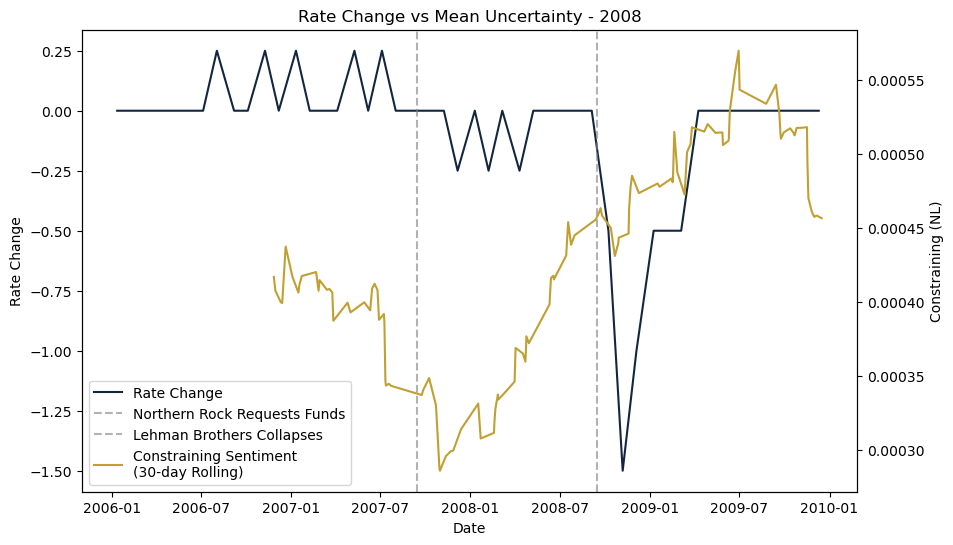

In [31]:
# Define the date range.
start_date = '2006-01-01'
end_date = '2009-12-31'

# Filter bank_rates and av_sent dataframes. Define tot or av sent here.
bank_rates_filtered = bank_rates[(bank_rates['date'] >= start_date) & (bank_rates['date'] <= end_date)]
av_sent_filtered = av_sent[(av_sent.index >= start_date) & (av_sent.index <= end_date)]

# Create a new plot.
plt.figure(figsize=(10, 6))

# Plot bank rate on the primary y-axis. Toggle from 'bank_rate' to 'change' here.
ax1 = sns.lineplot(data=bank_rates_filtered, x='date', y='change', color=BoE_blue, label='Rate Change')    # Change to 'change'.

# Plot vertical dashed lines for significant dates.
significant_dates = [
    ('2007-09-14', 'Northern Rock Requests Funds'),
    ('2008-09-15', 'Lehman Brothers Collapses')
]
for date, label in significant_dates:
    ax1.axvline(x=pd.to_datetime(date), linestyle='--', color ='grey', alpha = 0.6, label=label)

# Plot the selected sentiment on the secondary y-axis. Define tot or av sent here.
rolling_avg = av_sent_filtered['constraining_normalised'].rolling(window=30).mean()                              # Change to 'uncertainty'.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent_filtered.index, y=rolling_avg, 
             color=colour_map['constraining_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Constraining Sentiment\n(30-day Rolling)', ax=ax2)

# Set y-axis labels.
ax1.set_ylabel('Rate Change')                # Change the label here.
ax2.set_ylabel('Constraining (NL)')

# Set the x-axis label.
ax1.set_xlabel('Date')

# Set the title.
plt.title('Rate Change vs Mean Uncertainty - 2008')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Create a single legend in the top right corner.
plt.legend(handles, labels, loc='lower left')

# Remove the individual legends.
ax1.get_legend().remove()

# Show the plot.
plt.show()

<b> Thoughts: <b> 

Negative and constraining sentiment spike between Northern Rock requesting emergency funds and Lehman Brothers collpasing. 

Uncertainty appears to be the most interesting to me. Uncertainty dips strongly after Northern Rock requests funds from BOE but immedietly spikes again. This could be due to an initial confidence and clarity in the market, which quickly subsides as the extent of the problem begins to unfold. Uncertainty continues to increase until interest rates are dropped, at which point both decline precipitously.

# 2014-2019 Period:

## 2014-2019 Period 'Total' Negative Sentiment plots:

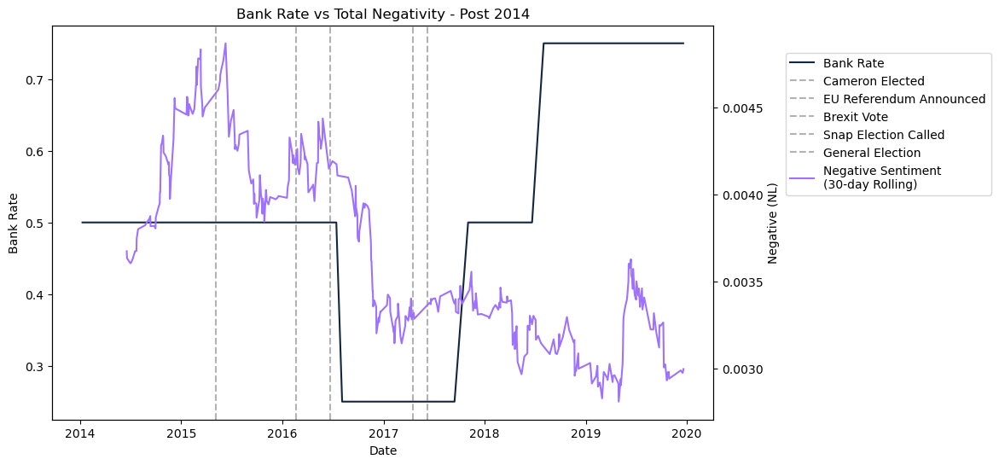

In [32]:
# Define the date range
start_date = '2014-01-01'
end_date = '2019-12-31'

# Filter bank_rates and av_sent dataframes. Define tot or av sent here.
bank_rates_filtered = bank_rates[(bank_rates['date'] >= start_date) & (bank_rates['date'] <= end_date)]
tot_sent_filtered = tot_sent[(tot_sent.index >= start_date) & (tot_sent.index <= end_date)]

# Create a new plot
plt.figure(figsize=(10, 6))

# Plot bank rate on the primary y-axis. 
ax1 = sns.lineplot(data=bank_rates_filtered, x='date', y='bank_rate', color=BoE_blue, label='Bank Rate')

# Plot vertical dashed lines for significant dates.
significant_dates = [
    ('2015-05-07', 'Cameron Elected'),                        
    ('2016-02-20', 'EU Referendum Announced'),
    ('2016-06-23', 'Brexit Vote'),
    ('2017-04-18', 'Snap Election Called'),
    ('2017-06-08', 'General Election')
    #('2019-12-12', 'General Election')
    #('2020-03-23', 'Lockdown Announced'),                     # I have commented out several dates to avoid too much clutter.
    #('2020-11-09', 'Vaccine Announced')
]
for date, label in significant_dates:
    ax1.axvline(x=pd.to_datetime(date), linestyle='--', color ='grey', alpha = 0.6, label=label)

# Plot the selected sentiment on the secondary y-axis. Define tot or av sent here.
rolling_avg = tot_sent_filtered['negative_normalised'].rolling(window=30).mean()
ax2 = ax1.twinx()
sns.lineplot(x=tot_sent_filtered.index, y=rolling_avg, 
             color=colour_map['negative_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Negative Sentiment\n(30-day Rolling)', ax=ax2)

# Set y-axis labels
ax1.set_ylabel('Bank Rate')
ax2.set_ylabel('Negative (NL)')

# Set the x-axis label
ax1.set_xlabel('Date')

# Set the title
plt.title('Bank Rate vs Total Negativity - Post 2014')

# Combine handles and labels from both legends
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Create a single legend in the top right corner
plt.legend(handles, labels, loc='center left', bbox_to_anchor=(1.1, 0.75))

# Remove the individual legends
ax1.get_legend().remove()

# Show the plot
plt.show()


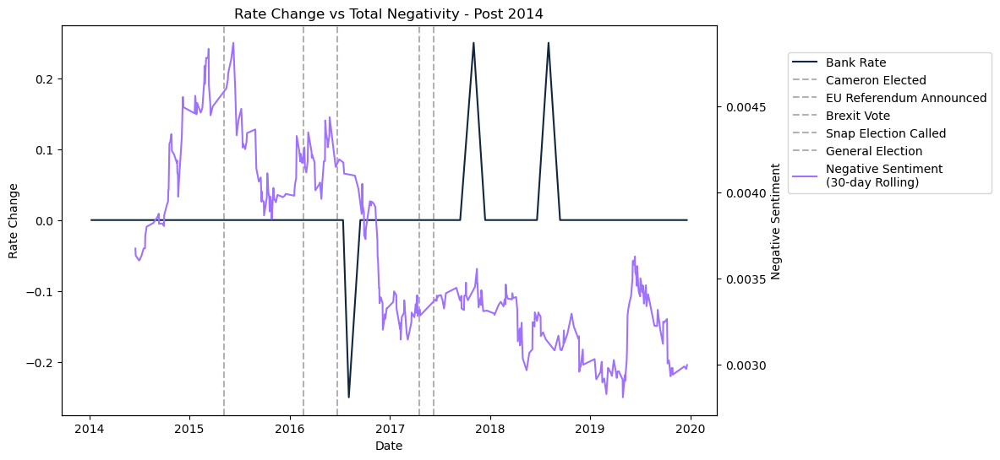

In [33]:
# Define the date range
start_date = '2014-01-01'
end_date = '2019-12-31'

# Filter bank_rates and av_sent dataframes. Define tot or av sent here.
bank_rates_filtered = bank_rates[(bank_rates['date'] >= start_date) & (bank_rates['date'] <= end_date)]
tot_sent_filtered = tot_sent[(tot_sent.index >= start_date) & (tot_sent.index <= end_date)]

# Create a new plot
plt.figure(figsize=(10, 6))

# Plot bank rate on the primary y-axis. 
ax1 = sns.lineplot(data=bank_rates_filtered, x='date', y='change', color=BoE_blue, label='Bank Rate')    # Change y value to 'change'.

# Plot vertical dashed lines for significant dates.
significant_dates = [
    ('2015-05-07', 'Cameron Elected'),
    ('2016-02-20', 'EU Referendum Announced'),
    ('2016-06-23', 'Brexit Vote'),
    ('2017-04-18', 'Snap Election Called'),
    ('2017-06-08', 'General Election')
    #('2019-12-12', 'General Election')
    #('2020-03-23', 'Lockdown Announced'),                     # I have commented out several dates to avoid too much clutter.
    #('2020-11-09', 'Vaccine Announced')
]
for date, label in significant_dates:
    ax1.axvline(x=pd.to_datetime(date), linestyle='--', color ='grey', alpha = 0.6, label=label)

# Plot the selected sentiment on the secondary y-axis. Define tot or av sent here.
rolling_avg = tot_sent_filtered['negative_normalised'].rolling(window=30).mean()
ax2 = ax1.twinx()
sns.lineplot(x=tot_sent_filtered.index, y=rolling_avg, 
             color=colour_map['negative_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Negative Sentiment\n(30-day Rolling)', ax=ax2)

# Set y-axis labels
ax1.set_ylabel('Rate Change')
ax2.set_ylabel('Negative Sentiment')

# Set the x-axis label
ax1.set_xlabel('Date')

# Set the title
plt.title('Rate Change vs Total Negativity - Post 2014')

# Combine handles and labels from both legends
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Create a single legend in the top right corner
plt.legend(handles, labels, loc='center left', bbox_to_anchor=(1.1, 0.75))

# Remove the individual legends
ax1.get_legend().remove()

# Show the plot
plt.show()


## 2014-2019 Period 'Mean' Negative Sentiment plots:

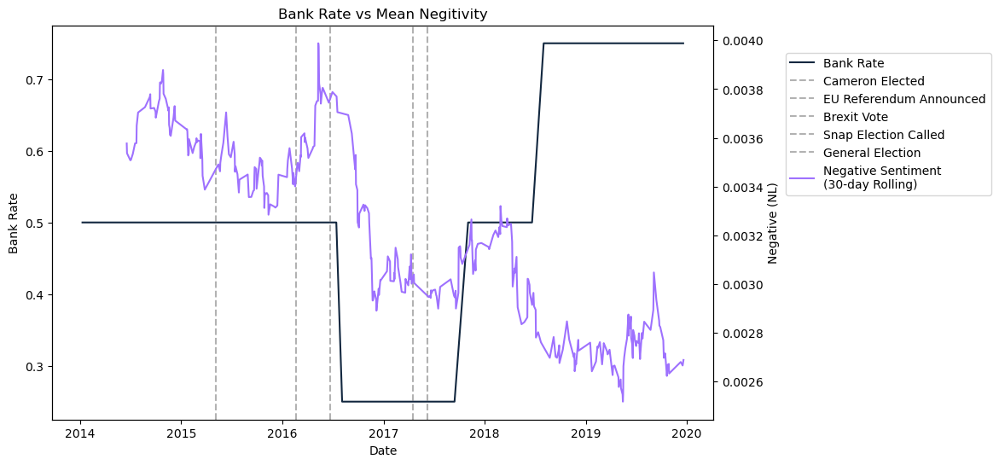

In [34]:
# Define the date range
start_date = '2014-01-01'
end_date = '2019-12-31'

# Filter bank_rates and av_sent dataframes. Define tot or av sent here.
bank_rates_filtered = bank_rates[(bank_rates['date'] >= start_date) & (bank_rates['date'] <= end_date)]
av_sent_filtered = av_sent[(av_sent.index >= start_date) & (av_sent.index <= end_date)]                  # Change to av_sent.

# Create a new plot
plt.figure(figsize=(10, 6))

# Plot bank rate on the primary y-axis. 
ax1 = sns.lineplot(data=bank_rates_filtered, x='date', y='bank_rate', color=BoE_blue, label='Bank Rate')

# Plot vertical dashed lines for significant dates.
significant_dates = [
    ('2015-05-07', 'Cameron Elected'),
    ('2016-02-20', 'EU Referendum Announced'),
    ('2016-06-23', 'Brexit Vote'),
    ('2017-04-18', 'Snap Election Called'),
    ('2017-06-08', 'General Election')
    #('2019-12-12', 'General Election')
    #('2020-03-23', 'Lockdown Announced'),
    #('2020-11-09', 'Vaccine Announced')
]
for date, label in significant_dates:
    ax1.axvline(x=pd.to_datetime(date), linestyle='--', color ='grey', alpha = 0.6, label=label)

# Plot the selected sentiment on the secondary y-axis. Define tot or av sent here.
rolling_avg = av_sent_filtered['negative_normalised'].rolling(window=30).mean()                            # Change to av_sent.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent_filtered.index, y=rolling_avg, 
             color=colour_map['negative_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Negative Sentiment\n(30-day Rolling)', ax=ax2)    # Change to av_sent.

# Set y-axis labels
ax1.set_ylabel('Bank Rate')
ax2.set_ylabel('Negative (NL)')

# Set the x-axis label
ax1.set_xlabel('Date')

# Set the title
plt.title('Bank Rate vs Mean Negitivity')

# Combine handles and labels from both legends
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Create a single legend in the top right corner
plt.legend(handles, labels, loc='center left', bbox_to_anchor=(1.1, 0.75))

# Remove the individual legends
ax1.get_legend().remove()

# Show the plot
plt.show()


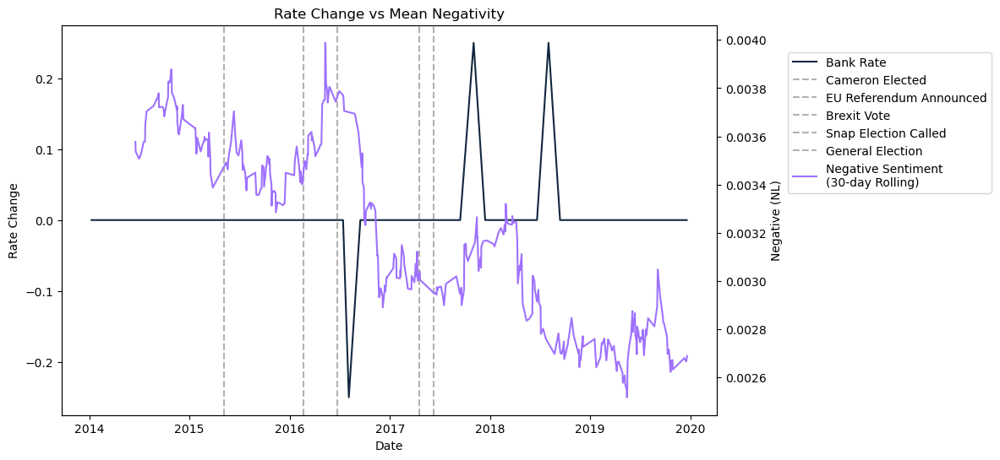

In [35]:
# Define the date range
start_date = '2014-01-01'
end_date = '2019-12-31'

# Filter bank_rates and av_sent dataframes. Define tot or av sent here.
bank_rates_filtered = bank_rates[(bank_rates['date'] >= start_date) & (bank_rates['date'] <= end_date)]
av_sent_filtered = av_sent[(av_sent.index >= start_date) & (av_sent.index <= end_date)]                  # Change to av_sent.

# Create a new plot
plt.figure(figsize=(10, 6))

# Plot bank rate on the primary y-axis. 
ax1 = sns.lineplot(data=bank_rates_filtered, x='date', y='change', color=BoE_blue, label='Bank Rate')    # Change to 'change'.

# Plot vertical dashed lines for significant dates.
significant_dates = [
    ('2015-05-07', 'Cameron Elected'),
    ('2016-02-20', 'EU Referendum Announced'),
    ('2016-06-23', 'Brexit Vote'),
    ('2017-04-18', 'Snap Election Called'),
    ('2017-06-08', 'General Election')
    #('2019-12-12', 'General Election')
    #('2020-03-23', 'Lockdown Announced'),
    #('2020-11-09', 'Vaccine Announced')
]
for date, label in significant_dates:
    ax1.axvline(x=pd.to_datetime(date), linestyle='--', color ='grey', alpha = 0.6, label=label)

# Plot the selected sentiment on the secondary y-axis. Define tot or av sent here.
rolling_avg = av_sent_filtered['negative_normalised'].rolling(window=30).mean()                            # Change to av_sent.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent_filtered.index, y=rolling_avg, 
             color=colour_map['negative_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Negative Sentiment\n(30-day Rolling)', ax=ax2)    # Change to av_sent.

# Set y-axis labels
ax1.set_ylabel('Rate Change')
ax2.set_ylabel('Negative (NL)')

# Set the x-axis label
ax1.set_xlabel('Date')

# Set the title
plt.title('Rate Change vs Mean Negativity')

# Combine handles and labels from both legends
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Create a single legend in the top right corner
plt.legend(handles, labels, loc='center left', bbox_to_anchor=(1.1, 0.75))

# Remove the individual legends
ax1.get_legend().remove()

# Show the plot
plt.show()


# Bank Rates versus Mention of Interest Rates

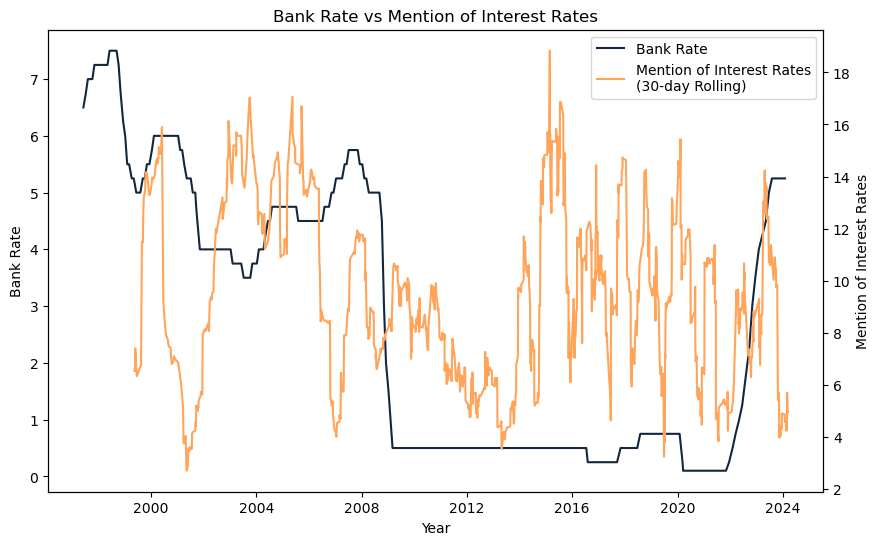

In [36]:
# First we will create a basic summary plot which we will then focus in on.
# Note that this plot is looking at av_sent which we will need to toggle.

# Create a new plot.
plt.figure(figsize=(10, 6))

# Plot bank rate on the primary y-axis.
ax1 = sns.lineplot(data=bank_rates, x='date', y='bank_rate', color=BoE_blue, label='Bank Rate')

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = tot_sent['rates_mentioned'].rolling(window=30).mean()
ax2 = ax1.twinx()
sns.lineplot(x=tot_sent.index, y=rolling_avg, 
             color='#FFA459',                                        # Choosing orange as it doesn't clash with the sentiment colour palette.
             label='Mention of Interest Rates\n(30-day Rolling)', ax=ax2)

# Set y-axis labels.
ax1.set_ylabel('Bank Rate')
ax2.set_ylabel('Mention of Interest Rates')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Bank Rate vs Mention of Interest Rates')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Create a single legend in the top right corner.
plt.legend(handles, labels, loc='upper right')

# Remove the individual legends.
ax1.get_legend().remove()

# Show the plot.
plt.show()


<b> Insights: <b>

There is not really a discernable pattern here. We see mentions of rates went very low around 2013 when the plan seemed to be to hold them very low for sometime.

# Bank of England 'Unity' Analysis:

## The subsequent analysis will seek to answer the following questions:

- How 'on message' were BOE in their speeches.
- How does this unity in message correlate with unity in committee votes.   

## Justifying my approach:

First we will need to aggregate the speech data. At this stage it is important to define some of our terms in order to better explain what we mean by 'on message'. My supposition is that speakers are relatively free to communicate the Bank's stance, however in periods of crisis, we may see the range of expression change. The Bank may internally agree a more succinct message they want to put across and impress upon speakers the need to 'stick to' this message. Therefore, irrespective of mean sentiment expressed in this time, we would expect the standard deviation around this mean sentiment to decrease.

We may also observe this phenomena in non crisis periods as well. A change in leadership may usher in a new approach to public communication, and we therefore may see, across all sentiments, a 'tightening up' of public expression.

## Looking again at the speeches data:

Let's return to the 30-day rolling summary. We will add colour fill around the standard deviation.

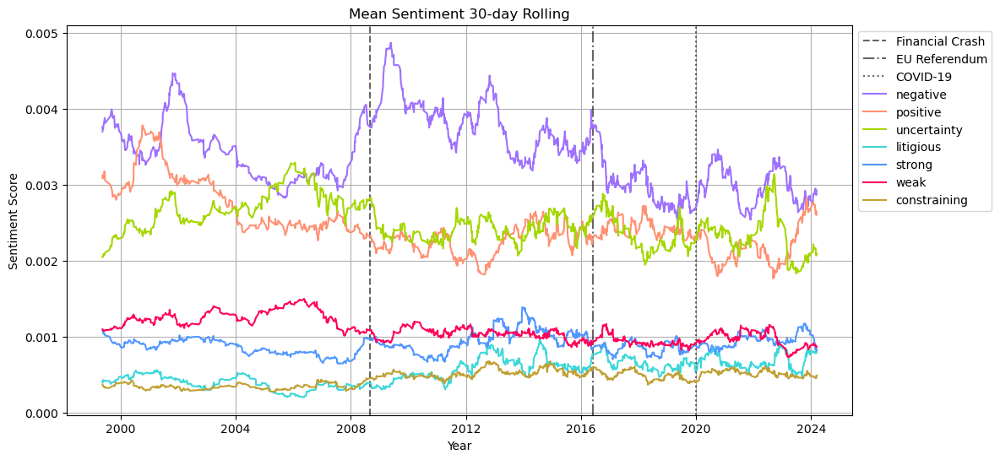

In [37]:
# Plot the sentiment scores over time with a 30-day rolling average.
plt.figure(figsize=(12, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2008-09-01'), color='black', alpha=0.6, linestyle='--', label='Financial Crash')
plt.axvline(pd.Timestamp('2016-06-01'), color='black', alpha=0.6, linestyle='-.', label='EU Referendum')
plt.axvline(pd.Timestamp('2020-01-01'), color='black', alpha=0.6, linestyle=':', label='COVID-19')

# Calculate the rolling average for each sentiment category.
window = 30
for sentiment in ['negative_normalised', 'positive_normalised', 'uncertainty_normalised', 'litigious_normalised', 
                  'strong_normalised', 'weak_normalised', 'constraining_normalised']:
    rolling_avg = av_sent[sentiment].rolling(window=window).mean()
    rolling_std = av_sent[sentiment].rolling(window=window).std()
    sentiment_label = sentiment.replace('_normalised', '')               # Remove '_normalised' from the sentiment label.
    plt.plot(av_sent.index, rolling_avg, label=sentiment_label, color=colour_map[sentiment])

plt.title('Mean Sentiment 30-day Rolling')
plt.xlabel('Year')
plt.ylabel('Sentiment Score')
plt.legend()

# Place the legend outside the graph.
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

plt.grid(True)
plt.show()


<b> Note: <b>

Next we will add the standard deviation to the graphic. We will use a fill function to fill the space above and below the mean. 

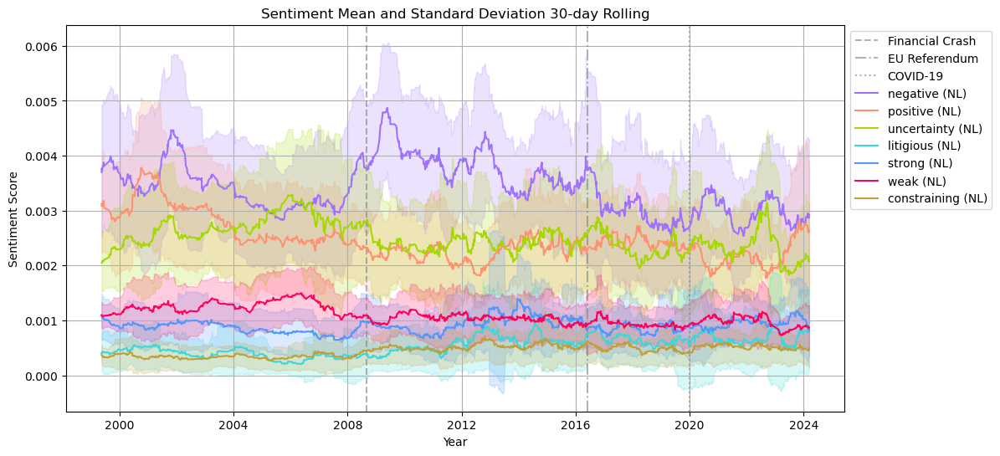

In [38]:
# Plot the sentiment scores over time with a 30-day rolling average.
plt.figure(figsize=(12, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2008-09-01'), color='grey', alpha=0.6, linestyle='--', label='Financial Crash')
plt.axvline(pd.Timestamp('2016-06-01'), color='grey', alpha=0.6, linestyle='-.', label='EU Referendum')
plt.axvline(pd.Timestamp('2020-01-01'), color='grey', alpha=0.6, linestyle=':', label='COVID-19')

# Calculate the rolling average and standard deviation for each sentiment category.
window = 30
for sentiment in ['negative_normalised', 'positive_normalised', 'uncertainty_normalised', 'litigious_normalised', 
                  'strong_normalised', 'weak_normalised', 'constraining_normalised']:
    rolling_avg = av_sent[sentiment].rolling(window=window).mean()
    rolling_std = av_sent[sentiment].rolling(window=window).std()  # Calculate standard deviation here.
    sentiment_label = sentiment.replace('_normalised', ' (NL)')  # Remove '_normalised' from the sentiment label.
    plt.plot(av_sent.index, rolling_avg, label=sentiment_label, color=colour_map[sentiment])
    
    # Add standard deviation around the mean. Use a low alpha to retain legibility of the mean line.
    plt.fill_between(av_sent.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map[sentiment], alpha=0.2)

plt.title('Sentiment Mean and Standard Deviation 30-day Rolling')
plt.xlabel('Year')
plt.ylabel('Sentiment Score')
plt.legend()

# Place the legend outside the graph.
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

plt.grid(True)
plt.show()


<b> Thoughts: <b>

It is very hard to discern here due to the significant overlap but this is the right track. We can see that strong sentiment spreads a lot in 2013 or so. We will plot each sentiment now individually with thoughts after each visualisation. As we are also interested in changes in governer, I will add these as events too going forward.

Note: Bailey was appointed on 16/03/2020. The pandemic arose and really took hold around this time. I will regard these events as one for now as they are hard to discern at such a high level. I have kept two different time points for these as we may focus in later to this period. In reality, if a new governer really does have an effect, there is likely an anticipatory gradual shift.

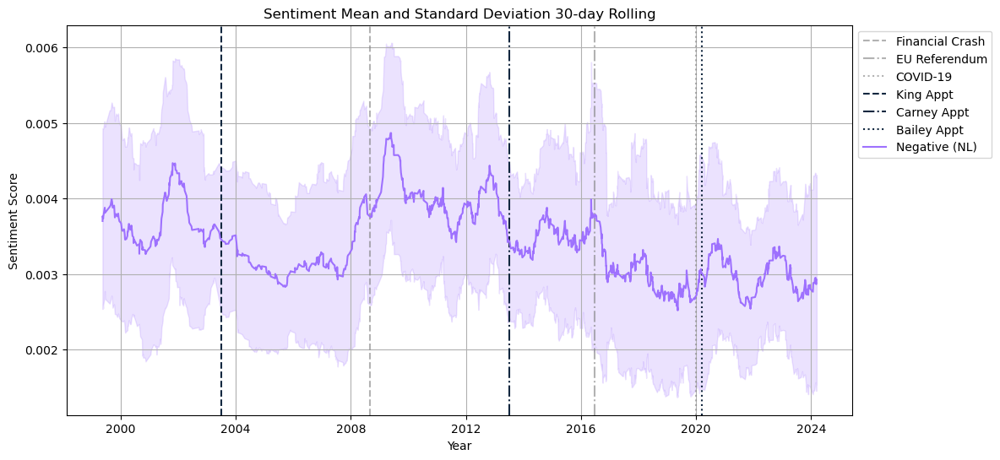

In [39]:
# Negative sentiment plot. Rolling mean and standard deviation fill.

# Plot the sentiment scores over time with a 30-day rolling average.
plt.figure(figsize=(12, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2008-09-01'), color='grey', alpha=0.6, linestyle='--', label='Financial Crash')
plt.axvline(pd.Timestamp('2016-06-23'), color='grey', alpha=0.6, linestyle='-.', label='EU Referendum')
plt.axvline(pd.Timestamp('2020-01-01'), color='grey', alpha=0.6, linestyle=':', label='COVID-19')

# Add vertical lines for change in Governer.
plt.axvline(pd.Timestamp('2003-07-01'), color=BoE_blue, linestyle='--', label='King Appt')
plt.axvline(pd.Timestamp('2013-07-01'), color=BoE_blue, linestyle='-.', label='Carney Appt')
plt.axvline(pd.Timestamp('2020-03-16'), color=BoE_blue, linestyle=':', label='Bailey Appt')

# Calculate the rolling average and standard deviation for each sentiment category.
window = 30
rolling_avg = av_sent['negative_normalised'].rolling(window=window).mean()
rolling_std = av_sent['negative_normalised'].rolling(window=window).std()  # Calculate standard deviation
sentiment_label = 'Negative (NL)'  # Remove '_normalised' from the sentiment label.
plt.plot(av_sent.index, rolling_avg, label=sentiment_label, color=colour_map['negative_normalised'])

# Add confidence interval shading
plt.fill_between(av_sent.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['negative_normalised'], alpha=0.2)

plt.title('Sentiment Mean and Standard Deviation 30-day Rolling')
plt.xlabel('Year')
plt.ylabel('Sentiment Score')
plt.legend()

# Place the legend outside the graph.
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

plt.grid(True)
plt.show()


<b> Thoughts: <b>

It is hard to see and stand out periods of divergence. Around the Brexit vote we do see divergence which quickly closes up.

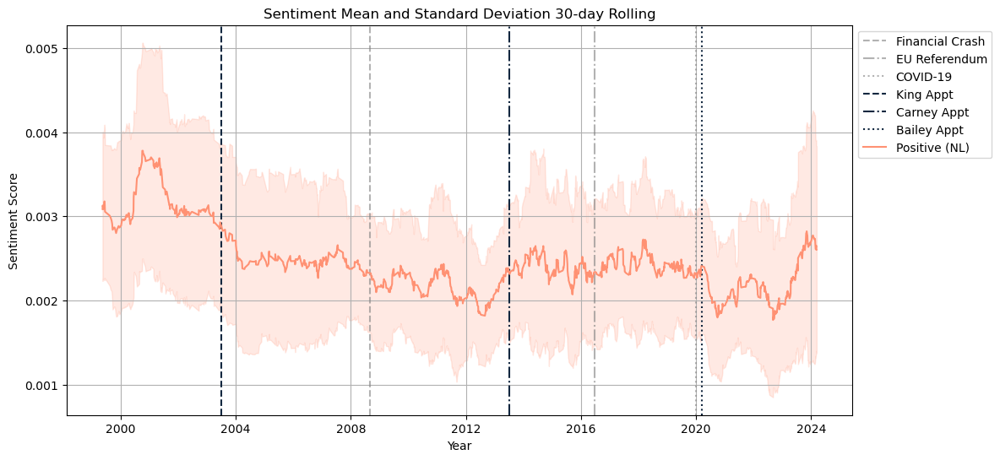

In [40]:
# Positive sentiment plot. Rolling mean and standard deviation fill.

# Plot the sentiment scores over time with a 30-day rolling average.
plt.figure(figsize=(12, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2008-09-01'), color='grey', alpha=0.6, linestyle='--', label='Financial Crash')
plt.axvline(pd.Timestamp('2016-06-23'), color='grey', alpha=0.6, linestyle='-.', label='EU Referendum')
plt.axvline(pd.Timestamp('2020-01-01'), color='grey', alpha=0.6, linestyle=':', label='COVID-19')

# Add vertical lines for change in Governer.
plt.axvline(pd.Timestamp('2003-07-01'), color=BoE_blue, linestyle='--', label='King Appt')
plt.axvline(pd.Timestamp('2013-07-01'), color=BoE_blue, linestyle='-.', label='Carney Appt')
plt.axvline(pd.Timestamp('2020-03-16'), color=BoE_blue, linestyle=':', label='Bailey Appt')

# Calculate the rolling average and standard deviation for each sentiment category.
window = 30
rolling_avg = av_sent['positive_normalised'].rolling(window=window).mean()
rolling_std = av_sent['positive_normalised'].rolling(window=window).std()  # Calculate standard deviation
sentiment_label = 'Positive (NL)'  # Remove '_normalised' from the sentiment label.
plt.plot(av_sent.index, rolling_avg, label=sentiment_label, color=colour_map['positive_normalised'])

# Add confidence interval shading
plt.fill_between(av_sent.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['positive_normalised'], alpha=0.2)

plt.title('Sentiment Mean and Standard Deviation 30-day Rolling')
plt.xlabel('Year')
plt.ylabel('Sentiment Score')
plt.legend()

# Place the legend outside the graph.
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

plt.grid(True)
plt.show()


<b> Thoughts: <b>

In 2012/2013 we see a noticably smaller standard deviation which occured in the lead up to the transition toward Carney as governer. 2024 also seems to have seen a significant divergence in positivity.

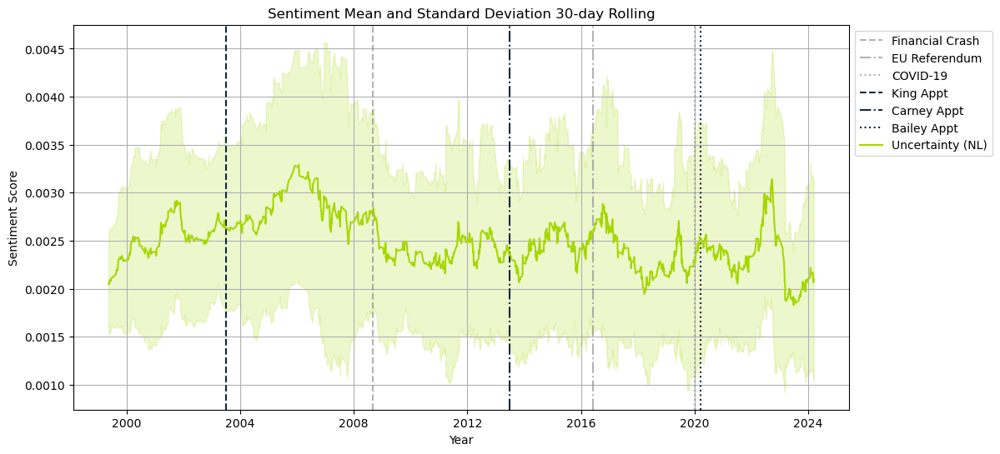

In [41]:
# Uncertain sentiment plot. Rolling mean and standard deviation fill.

# Plot the sentiment scores over time with a 30-day rolling average.
plt.figure(figsize=(12, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2008-09-01'), color='grey', alpha=0.6, linestyle='--', label='Financial Crash')
plt.axvline(pd.Timestamp('2016-06-01'), color='grey', alpha=0.6, linestyle='-.', label='EU Referendum')
plt.axvline(pd.Timestamp('2020-01-01'), color='grey', alpha=0.6, linestyle=':', label='COVID-19')

# Add vertical lines for change in Governer.
plt.axvline(pd.Timestamp('2003-07-01'), color=BoE_blue, linestyle='--', label='King Appt')
plt.axvline(pd.Timestamp('2013-07-01'), color=BoE_blue, linestyle='-.', label='Carney Appt')
plt.axvline(pd.Timestamp('2020-03-16'), color=BoE_blue, linestyle=':', label='Bailey Appt')

# Calculate the rolling average and standard deviation for each sentiment category.
window = 30
rolling_avg = av_sent['uncertainty_normalised'].rolling(window=window).mean()
rolling_std = av_sent['uncertainty_normalised'].rolling(window=window).std()  # Calculate standard deviation
sentiment_label = 'Uncertainty (NL)'  # Remove '_normalised' from the sentiment label.
plt.plot(av_sent.index, rolling_avg, label=sentiment_label, color=colour_map['uncertainty_normalised'])

# Add confidence interval shading
plt.fill_between(av_sent.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['uncertainty_normalised'], alpha=0.2)

plt.title('Sentiment Mean and Standard Deviation 30-day Rolling')
plt.xlabel('Year')
plt.ylabel('Sentiment Score')
plt.legend()

# Place the legend outside the graph.
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

plt.grid(True)
plt.show()


<b> Thoughts: <b>

The mid 2000s until just after the GFC in 2008 seem to show a large standard deviation. Things appear to be the tightest around 2010 and to remain fairly static for a few years. The 2023-2024 drop in mean uncertainty appears to be followed with a slight decrease in the standard deviation around that uncertanty.

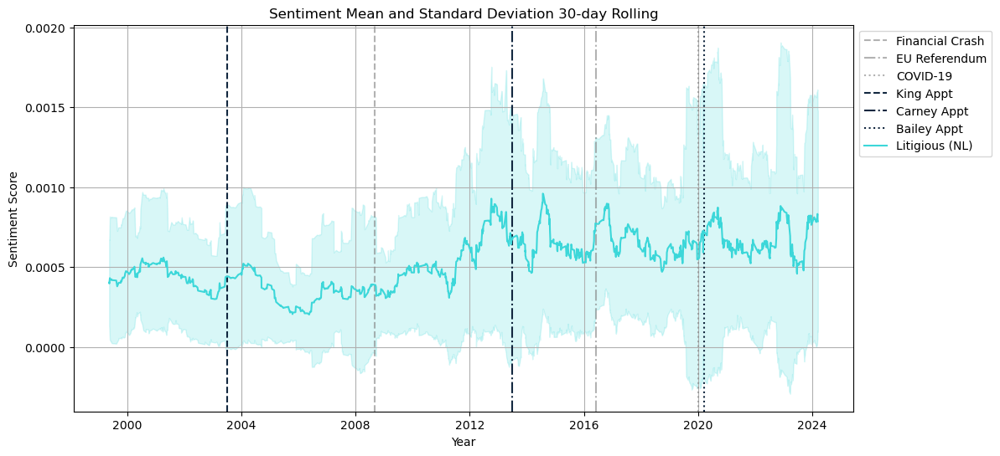

In [42]:
# Litigious sentiment plot. Rolling mean and standard deviation fill.

# Plot the sentiment scores over time with a 30-day rolling average.
plt.figure(figsize=(12, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2008-09-01'), color='grey', alpha=0.6, linestyle='--', label='Financial Crash')
plt.axvline(pd.Timestamp('2016-06-01'), color='grey', alpha=0.6, linestyle='-.', label='EU Referendum')
plt.axvline(pd.Timestamp('2020-01-01'), color='grey', alpha=0.6, linestyle=':', label='COVID-19')

# Add vertical lines for change in Governer.
plt.axvline(pd.Timestamp('2003-07-01'), color=BoE_blue, linestyle='--', label='King Appt')
plt.axvline(pd.Timestamp('2013-07-01'), color=BoE_blue, linestyle='-.', label='Carney Appt')
plt.axvline(pd.Timestamp('2020-03-16'), color=BoE_blue, linestyle=':', label='Bailey Appt')

# Calculate the rolling average and standard deviation for each sentiment category.
window = 30
rolling_avg = av_sent['litigious_normalised'].rolling(window=window).mean()
rolling_std = av_sent['litigious_normalised'].rolling(window=window).std()  # Calculate standard deviation
sentiment_label = 'Litigious (NL)'  # Remove '_normalised' from the sentiment label.
plt.plot(av_sent.index, rolling_avg, label=sentiment_label, color=colour_map['litigious_normalised'])

# Add confidence interval shading
plt.fill_between(av_sent.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['litigious_normalised'], alpha=0.2)

plt.title('Sentiment Mean and Standard Deviation 30-day Rolling')
plt.xlabel('Year')
plt.ylabel('Sentiment Score')
plt.legend()

# Place the legend outside the graph.
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

plt.grid(True)
plt.show()


<b> Thoughts: <b>

There is a clear change, post 2008-2010, though it does not see, to have occured overnight. The 2008 GFC appears to be a good point to focus in on later. As does 2019-2024.

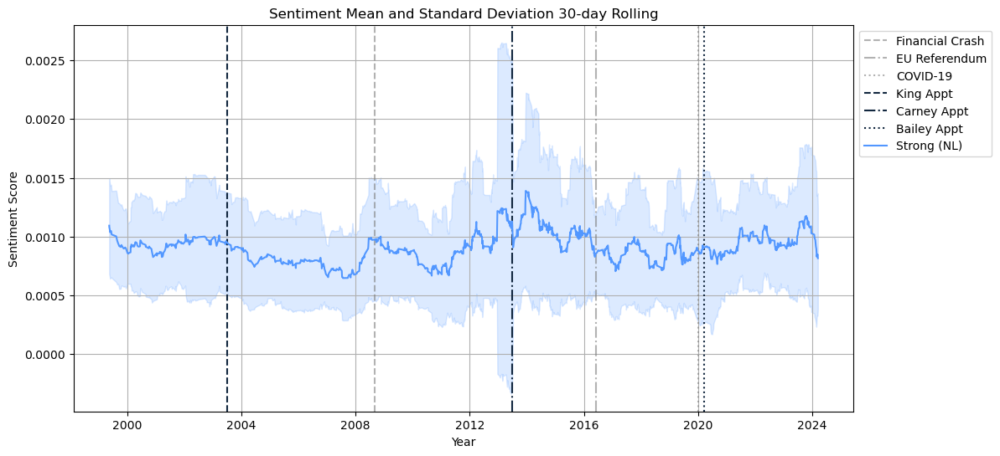

In [43]:
# Strong sentiment plot. Rolling mean and standard deviation fill.

# Plot the sentiment scores over time with a 30-day rolling average.
plt.figure(figsize=(12, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2008-09-01'), color='grey', alpha=0.6, linestyle='--', label='Financial Crash')
plt.axvline(pd.Timestamp('2016-06-01'), color='grey', alpha=0.6, linestyle='-.', label='EU Referendum')
plt.axvline(pd.Timestamp('2020-01-01'), color='grey', alpha=0.6, linestyle=':', label='COVID-19')

# Add vertical lines for change in Governer.
plt.axvline(pd.Timestamp('2003-07-01'), color=BoE_blue, linestyle='--', label='King Appt')
plt.axvline(pd.Timestamp('2013-07-01'), color=BoE_blue, linestyle='-.', label='Carney Appt')
plt.axvline(pd.Timestamp('2020-03-16'), color=BoE_blue, linestyle=':', label='Bailey Appt')

# Calculate the rolling average and standard deviation for each sentiment category.
window = 30
rolling_avg = av_sent['strong_normalised'].rolling(window=window).mean()
rolling_std = av_sent['strong_normalised'].rolling(window=window).std()  # Calculate standard deviation
sentiment_label = 'Strong (NL)'  # Remove '_normalised' from the sentiment label.
plt.plot(av_sent.index, rolling_avg, label=sentiment_label, color=colour_map['strong_normalised'])

# Add confidence interval shading
plt.fill_between(av_sent.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['strong_normalised'], alpha=0.2)

plt.title('Sentiment Mean and Standard Deviation 30-day Rolling')
plt.xlabel('Year')
plt.ylabel('Sentiment Score')
plt.legend()

# Place the legend outside the graph.
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

plt.grid(True)
plt.show()


<b> Thoughts: <b>

The stand out here is the Carney transition. There was massive divergence prior which was pulled in very fast. It would be good to plot the date of his announcement as well. 2016-2020 could prove interesting as well.

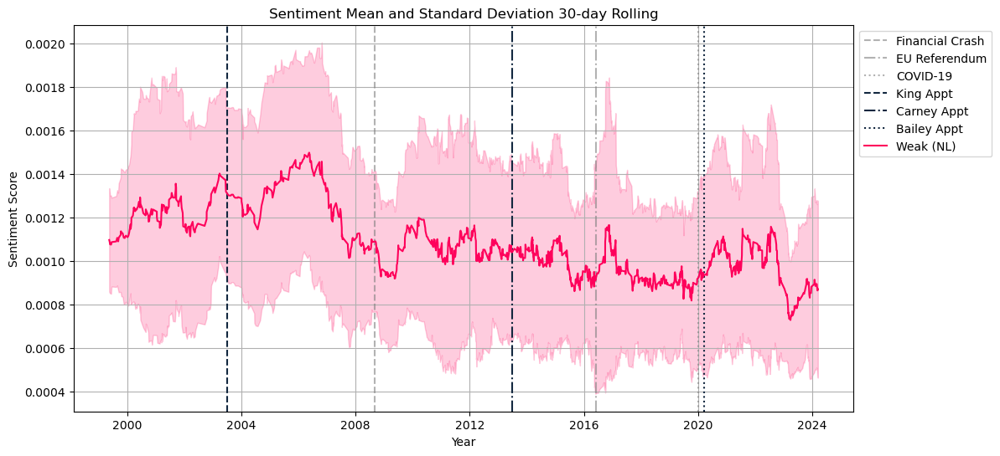

In [44]:
# Weak sentiment plot. Rolling mean and standard deviation fill.

# Plot the sentiment scores over time with a 30-day rolling average.
plt.figure(figsize=(12, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2008-09-01'), color='grey', alpha=0.6, linestyle='--', label='Financial Crash')
plt.axvline(pd.Timestamp('2016-06-01'), color='grey', alpha=0.6, linestyle='-.', label='EU Referendum')
plt.axvline(pd.Timestamp('2020-01-01'), color='grey', alpha=0.6, linestyle=':', label='COVID-19')

# Add vertical lines for change in Governer.
plt.axvline(pd.Timestamp('2003-07-01'), color=BoE_blue, linestyle='--', label='King Appt')
plt.axvline(pd.Timestamp('2013-07-01'), color=BoE_blue, linestyle='-.', label='Carney Appt')
plt.axvline(pd.Timestamp('2020-03-16'), color=BoE_blue, linestyle=':', label='Bailey Appt')

# Calculate the rolling average and standard deviation for each sentiment category.
window = 30
rolling_avg = av_sent['weak_normalised'].rolling(window=window).mean()
rolling_std = av_sent['weak_normalised'].rolling(window=window).std()  # Calculate standard deviation
sentiment_label = 'Weak (NL)'  # Remove '_normalised' from the sentiment label.
plt.plot(av_sent.index, rolling_avg, label=sentiment_label, color=colour_map['weak_normalised'])

# Add confidence interval shading
plt.fill_between(av_sent.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['weak_normalised'], alpha=0.2)

plt.title('Sentiment Mean and Standard Deviation 30-day Rolling')
plt.xlabel('Year')
plt.ylabel('Sentiment Score')
plt.legend()

# Place the legend outside the graph.
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

plt.grid(True)
plt.show()


<b> Thoughts: <b>

Weak sentiment abrubtly tightens when King comes in. The tightest point is perhaps around 2008 or 2023. The clear stand out here is post EU referendum.

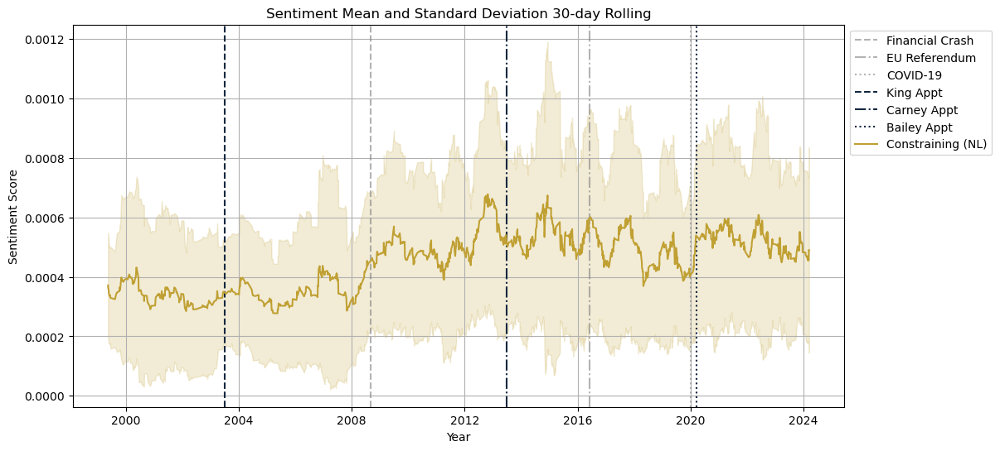

In [45]:
# Constraining sentiment plot. Rolling mean and standard deviation fill.

# Plot the sentiment scores over time with a 30-day rolling average.
plt.figure(figsize=(12, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2008-09-01'), color='grey', alpha=0.6, linestyle='--', label='Financial Crash')
plt.axvline(pd.Timestamp('2016-06-01'), color='grey', alpha=0.6, linestyle='-.', label='EU Referendum')
plt.axvline(pd.Timestamp('2020-01-01'), color='grey', alpha=0.6, linestyle=':', label='COVID-19')

# Add vertical lines for change in Governer.
plt.axvline(pd.Timestamp('2003-07-01'), color=BoE_blue, linestyle='--', label='King Appt')
plt.axvline(pd.Timestamp('2013-07-01'), color=BoE_blue, linestyle='-.', label='Carney Appt')
plt.axvline(pd.Timestamp('2020-03-16'), color=BoE_blue, linestyle=':', label='Bailey Appt')

# Calculate the rolling average and standard deviation for each sentiment category.
window = 30
rolling_avg = av_sent['constraining_normalised'].rolling(window=window).mean()
rolling_std = av_sent['constraining_normalised'].rolling(window=window).std()  # Calculate standard deviation
sentiment_label = 'Constraining (NL)'  # Remove '_normalised' from the sentiment label.
plt.plot(av_sent.index, rolling_avg, label=sentiment_label, color=colour_map['constraining_normalised'])

# Add confidence interval shading
plt.fill_between(av_sent.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['constraining_normalised'], alpha=0.2)

plt.title('Sentiment Mean and Standard Deviation 30-day Rolling')
plt.xlabel('Year')
plt.ylabel('Sentiment Score')
plt.legend()

# Place the legend outside the graph.
plt.legend(bbox_to_anchor=(1, 1), loc='upper left')

plt.grid(True)
plt.show()


<b> Thoughts: <b> 

Much more discipline in the message around the early 2000s. The message tightens as King and Carney comes in but diverges wheb Bailey comes in (though this also overlaps with the pandemic). 2015 would be good to look into as the most 'spread' out period for this sentiment.

# Looking at dissent in the rate vote committee:
## We will park the above and focus now on the dissent in the rate votes.

Rates are decided by vote, with each memeber expressing a desired rate. A measure of 'unity' within the committee would be the entropy of this vote, with the greater entropy the greater the disunity. A unanimous vote would have the lowest possible entropy.

# Reading in the voting data.

The 'Vote_Summary' data summarises the votes in each committee meating for the last few decades. Each column corresponds to a committee member who served on and subsequently retired from the committee. This is why a majority of the columns appear blank or N/A, as they are only partly filled.

We will format the data into the appropriate type, calculate the entropy of the vote, then delete all columns other than date and entropy.

In [46]:
# Read in the data.
vote_summary = pd.read_csv('Vote_Summary.csv')

# We should view the head and the tail, as the top left of the head will be blank and the bottom left of the tail populated.
print('Vote Summary (head):\n--------------------\n')
print(vote_summary.head())
print('\n--------------------\n')
print('Vote Summary (tail):\n--------------------\n')
print(vote_summary.tail())
print('\n--------------------\n')
print('Vote Summary Data Types:\n--------------------\n')
print(vote_summary.dtypes)

Vote Summary (head):
--------------------

                Date New_Rate Vote_1 Vote_2 Vote_3 Vote_4 Vote_5 Vote_6  \
0       06 June 1997    6.50%    NaN    NaN    NaN    NaN    NaN    NaN   
1       10 July 1997    6.75%    NaN    NaN    NaN    NaN    NaN    NaN   
2     07 August 1997    7.00%    NaN    NaN    NaN    NaN    NaN    NaN   
3  11 September 1997    7.00%    NaN    NaN    NaN    NaN    NaN    NaN   
4    09 October 1997    7.00%    NaN    NaN    NaN    NaN    NaN    NaN   

  Vote_7 Vote_8  ... Vote_41  Vote_42 Vote_43 Vote_44 Vote_45 Vote_46 Vote_47  \
0    NaN    NaN  ...     NaN      NaN     NaN     NaN     NaN     NaN     NaN   
1    NaN    NaN  ...     NaN      NaN     NaN     NaN     NaN     NaN     NaN   
2    NaN    NaN  ...     NaN      NaN     NaN     NaN     NaN     NaN     NaN   
3    NaN    NaN  ...     NaN      NaN     NaN     NaN     NaN     NaN     NaN   
4    NaN    NaN  ...     NaN      NaN     NaN     NaN     NaN     NaN     NaN   

  Vote_48 Vote_49 V

In [47]:
# Setting the date to the desired data types.
vote_summary['Date'] = pd.to_datetime(vote_summary['Date'])

# We will set the vote_10 column to object just to keep things uniform.
vote_summary['Vote_10'] = vote_summary['Vote_10'].astype(object)

# Verify the changes.
print('Vote Summary Data Types:\n--------------------\n')
print(vote_summary.dtypes)

Vote Summary Data Types:
--------------------

Date        datetime64[ns]
New_Rate            object
Vote_1              object
Vote_2              object
Vote_3              object
Vote_4              object
Vote_5              object
Vote_6              object
Vote_7              object
Vote_8              object
Vote_9              object
Vote_10             object
Vote_11             object
Vote_12             object
Vote_13             object
Vote_14             object
Vote_15             object
Vote_16             object
Vote_17             object
Vote_18             object
Vote_19             object
Vote_20             object
Vote_21             object
Vote_22             object
Vote_23             object
Vote_24             object
Vote_25             object
Vote_26             object
Vote_27             object
Vote_28             object
Vote_29             object
Vote_30             object
Vote_31             object
Vote_32             object
Vote_33             object
Vote_34 

## Calculating entropy:

We will now calculate the entropy for each vote. The below method will calculate and entropy score, such that 0 is perfect unity and 1 is maximum disorder. The first step is to drop the 'New_Rate' column so that this is not counted as a vote.

In [48]:
# Import an additional library in order to calculate entropy.
from scipy.stats import entropy

# Drop the 'New_Rate' column. If we keep it, the following code will regard it as vote option.
vote_summary.drop(columns=['New_Rate'], inplace=True)

# Set date as the index.
vote_summary.set_index('Date', inplace=True)

# Calculate the entropy for each row (date).
# Create an empty list to store the entropy values.
entropy_values = []
for date, row in vote_summary.iterrows():
    # Specify that NaN should be disregarded and not counted as a 'vote'.
    non_nan_values = row.dropna()
    probabilities = non_nan_values.value_counts(normalize=True)
    # Calculate entropy using the 'entropy' function.
    entropy_value = entropy(probabilities)
    # Append these values into the list we created above.
    entropy_values.append(entropy_value)

# Add these entropy values in the 'entropy_values' list to the vote_summary DataFrame. 
# We will intentionally append to them to index 0.
vote_summary.insert(loc=0,                             # Insert on the first column, far left.
                    column='Entropy',                  # Name the column.
                    value=entropy_values)              # Specify the entropy values list to fill this column.

# View the DataFrame. We will look at the tail.
vote_summary.tail()

,Entropy,Vote_1,Vote_2,Vote_3,Vote_4,Vote_5,Vote_6,Vote_7,Vote_8,Vote_9,...,Vote_41,Vote_42,Vote_43,Vote_44,Vote_45,Vote_46,Vote_47,Vote_48,Vote_49,Vote_50
Date,,,,,,,,,,,,,,,,,,,,,
2023-08-03,0.848686,5.25%,NaN,5.25%,5.00%,5.25%,5.50%,5.50%,5.25%,5.25%,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-09-21,0.686962,5.25%,NaN,5.25%,5.25%,5.50%,5.50%,5.50%,5.25%,5.25%,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-11-02,0.636514,5.25%,5.25%,5.25%,5.25%,5.50%,5.50%,5.50%,5.25%,5.25%,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-12-14,0.636514,5.25%,5.25%,5.25%,5.25%,5.50%,5.50%,5.50%,5.25%,5.25%,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-02-01,0.848686,5.25%,5.25%,5.25%,5.00%,5.25%,5.50%,5.50%,5.25%,5.25%,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Validate the process:

We will validate this process by checking entropy against a few dates, one in which the committee voted in perfect unanimity and another in which they were disunited.

Perfect unanimity: 05/08/2021.
Disorder: 01/02/2024 (three different rates voted for).

In [49]:
# Checking 05/08/2021.
print('Checking entropy of a unanimous vote (05/08/2021):')
print('Vote options (percentages) and the corresponding entropy (float)')
print(vote_summary.loc['2021-08-05'].value_counts())
print('\n--------------------\n')

# Checking 01/02/2024.
print('Checking entropy of a disunited vote (01/02/2024):')
print('Vote options (percentages) and the corresponding entropy (float)')
print(vote_summary.loc['2024-02-01'].value_counts())

Checking entropy of a unanimous vote (05/08/2021):
Vote options (percentages) and the corresponding entropy (float)
2021-08-05 00:00:00
0.10%    8
0.0      1
Name: count, dtype: int64

--------------------

Checking entropy of a disunited vote (01/02/2024):
Vote options (percentages) and the corresponding entropy (float)
2024-02-01 00:00:00
5.25%                 6
5.50%                 2
0.8486855577264172    1
5.00%                 1
Name: count, dtype: int64


## Creating a new DataFrame and plotting entropy over time.

In [50]:
# We will call the new DataFrame 'vote_entropy'.
vote_entropy = vote_summary[['Entropy']].copy()

# Let's reset the index now so that column 1 is the date. This is consistent with our bank rate data above.
vote_entropy.reset_index(inplace=True)

# View the new DataFrame.
vote_entropy.head()

,Date,Entropy
0,1997-06-06,0.0
1,1997-07-10,0.0
2,1997-08-07,0.0
3,1997-09-11,0.0
4,1997-10-09,0.0


<Figure size 1500x800 with 0 Axes>

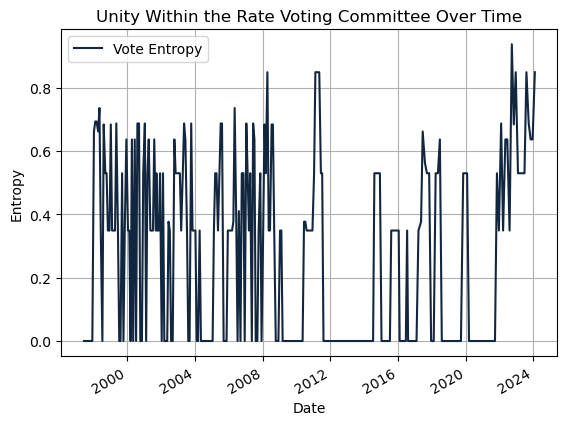

In [51]:
# Plotting entropy over time.
plt.figure(figsize=(15, 8))

vote_entropy.plot(x='Date', y='Entropy', label='Vote Entropy',
               color = BoE_blue)

# Add labels and a title.
plt.title('Unity Within the Rate Voting Committee Over Time')
plt.xlabel('Date')
plt.ylabel('Entropy')
plt.legend()
plt.grid(True)

# Save the plot as a PNG file.
plt.savefig('Vote_Entropy_absolute')

# Show the plot.
plt.show()

<b> Thoughts: <b>

We can see that disunity is currently (early 2024) at record high levels. It is also the first period of sustained disunity. There was a prolonged period of unity among members betwen 2012 and 2015 which would be worth a closer look. We will look at how vote entropy correlates with the unity in message in the next section.

# Plotting vote entropy against sentiment variations.

<b> Justifications: <b>

I will not apply a 30 day rolling average to the entropy. Votes are every 30 days or so anyway and although it looks quite erratic, it is still useful to see the true scale of disunity, as well as the frequency by which it returns to unification. Once we hone in on a date, it will also be easier to see through the jitters.

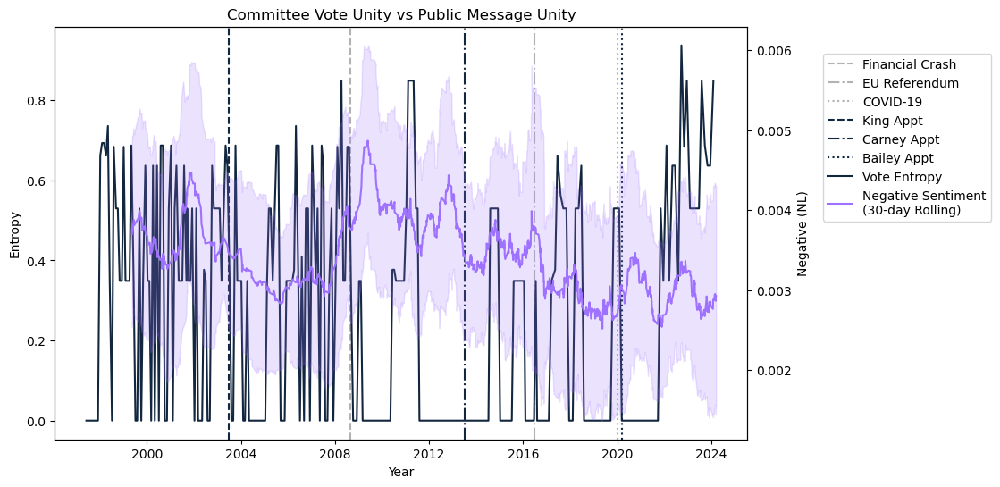

In [52]:
# Entropy vs Negative Sentiment.

# Create a new plot.
plt.figure(figsize=(10, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2008-09-01'), color='grey', alpha=0.6, linestyle='--', label='Financial Crash')
plt.axvline(pd.Timestamp('2016-06-23'), color='grey', alpha=0.6, linestyle='-.', label='EU Referendum')
plt.axvline(pd.Timestamp('2020-01-01'), color='grey', alpha=0.6, linestyle=':', label='COVID-19')

# Add vertical lines for change in Governer.
plt.axvline(pd.Timestamp('2003-07-01'), color=BoE_blue, linestyle='--', label='King Appt')
plt.axvline(pd.Timestamp('2013-07-01'), color=BoE_blue, linestyle='-.', label='Carney Appt')
plt.axvline(pd.Timestamp('2020-03-16'), color=BoE_blue, linestyle=':', label='Bailey Appt')

# Plot vote entropy on the primary y-axis.
ax1 = sns.lineplot(data=vote_entropy, x='Date', y='Entropy', color=BoE_blue, label='Vote Entropy')

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent['negative_normalised'].rolling(window=30).mean()
rolling_std = av_sent['negative_normalised'].rolling(window=window).std()         # Calculate standard deviation.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent.index, y=rolling_avg, 
             color=colour_map['negative_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Negative Sentiment\n(30-day Rolling)', ax=ax2)

# Add confidence interval shading
plt.fill_between(av_sent.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['negative_normalised'], alpha=0.2)

# Set y-axis labels.
ax1.set_ylabel('Entropy')
ax2.set_ylabel('Negative (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Committee Vote Unity vs Public Message Unity')

# Combine handles and labels from both legends
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Toggle either of the below two legends to place it inside or outside.
# Create a single legend in the top right corner.
#plt.legend(handles, labels, loc='upper right')

# Place the legend outside the graph.
plt.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.1, 0.95))

# Remove the individual legends.
ax1.get_legend().remove()

# Save the plot as a PNG file.
plt.savefig('Vote_Entropy_vs_Mean+SD_Negative30dr')

# Show the plot.
plt.show()


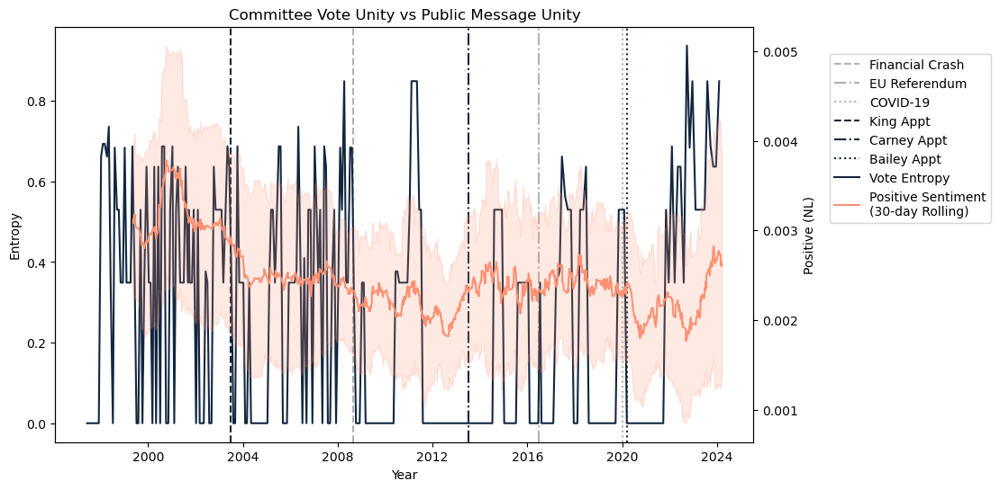

In [53]:
# Entropy vs Positive Sentiment.

# Create a new plot.
plt.figure(figsize=(10, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2008-09-01'), color='grey', alpha=0.6, linestyle='--', label='Financial Crash')
plt.axvline(pd.Timestamp('2016-06-23'), color='grey', alpha=0.6, linestyle='-.', label='EU Referendum')
plt.axvline(pd.Timestamp('2020-01-01'), color='grey', alpha=0.6, linestyle=':', label='COVID-19')

# Add vertical lines for change in Governer.
plt.axvline(pd.Timestamp('2003-07-01'), color=BoE_blue, linestyle='--', label='King Appt')
plt.axvline(pd.Timestamp('2013-07-01'), color=BoE_blue, linestyle='-.', label='Carney Appt')
plt.axvline(pd.Timestamp('2020-03-16'), color=BoE_blue, linestyle=':', label='Bailey Appt')

# Plot vote entropy on the primary y-axis.
ax1 = sns.lineplot(data=vote_entropy, x='Date', y='Entropy', color=BoE_blue, label='Vote Entropy')

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent['positive_normalised'].rolling(window=30).mean()
rolling_std = av_sent['positive_normalised'].rolling(window=window).std()         # Calculate standard deviation.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent.index, y=rolling_avg, 
             color=colour_map['positive_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Positive Sentiment\n(30-day Rolling)', ax=ax2)

# Add confidence interval shading
plt.fill_between(av_sent.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['positive_normalised'], alpha=0.2)

# Set y-axis labels.
ax1.set_ylabel('Entropy')
ax2.set_ylabel('Positive (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Committee Vote Unity vs Public Message Unity')

# Combine handles and labels from both legends
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Toggle either of the below two legends to place it inside or outside.
# Create a single legend in the top right corner.
#plt.legend(handles, labels, loc='upper right')

# Place the legend outside the graph.
plt.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.1, 0.95))

# Remove the individual legends.
ax1.get_legend().remove()

# Save the plot as a PNG file.
plt.savefig('Vote_Entropy_vs_Mean+SD_Positive30dr')

# Show the plot.
plt.show()


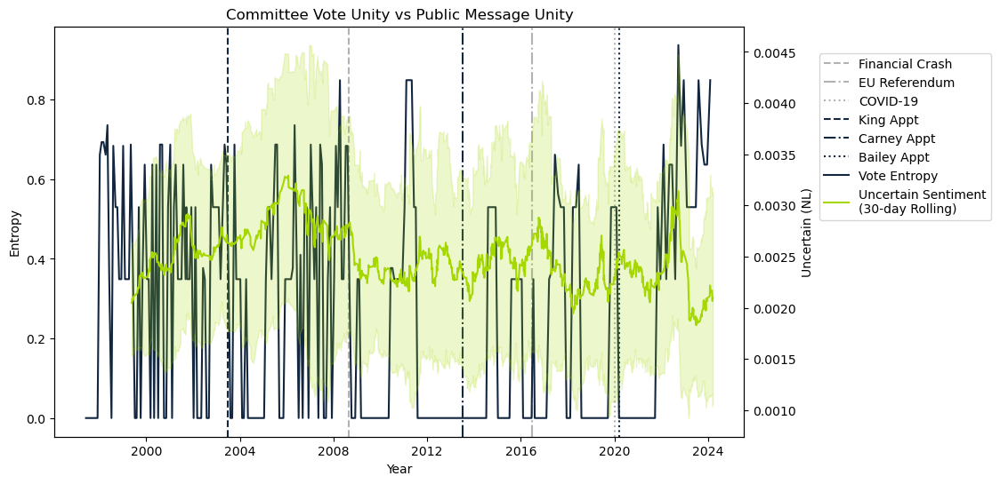

In [54]:
# Entropy vs Uncertain Sentiment.

# Create a new plot.
plt.figure(figsize=(10, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2008-09-01'), color='grey', alpha=0.6, linestyle='--', label='Financial Crash')
plt.axvline(pd.Timestamp('2016-06-23'), color='grey', alpha=0.6, linestyle='-.', label='EU Referendum')
plt.axvline(pd.Timestamp('2020-01-01'), color='grey', alpha=0.6, linestyle=':', label='COVID-19')

# Add vertical lines for change in Governer.
plt.axvline(pd.Timestamp('2003-07-01'), color=BoE_blue, linestyle='--', label='King Appt')
plt.axvline(pd.Timestamp('2013-07-01'), color=BoE_blue, linestyle='-.', label='Carney Appt')
plt.axvline(pd.Timestamp('2020-03-16'), color=BoE_blue, linestyle=':', label='Bailey Appt')

# Plot vote entropy on the primary y-axis.
ax1 = sns.lineplot(data=vote_entropy, x='Date', y='Entropy', color=BoE_blue, label='Vote Entropy')

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent['uncertainty_normalised'].rolling(window=30).mean()
rolling_std = av_sent['uncertainty_normalised'].rolling(window=window).std()         # Calculate standard deviation.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent.index, y=rolling_avg, 
             color=colour_map['uncertainty_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Uncertain Sentiment\n(30-day Rolling)', ax=ax2)

# Add confidence interval shading
plt.fill_between(av_sent.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['uncertainty_normalised'], alpha=0.2)

# Set y-axis labels.
ax1.set_ylabel('Entropy')
ax2.set_ylabel('Uncertain (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Committee Vote Unity vs Public Message Unity')

# Combine handles and labels from both legends
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Toggle either of the below two legends to place it inside or outside.
# Create a single legend in the top right corner.
#plt.legend(handles, labels, loc='upper right')

# Place the legend outside the graph.
plt.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.1, 0.95))

# Remove the individual legends.
ax1.get_legend().remove()

# Save the plot as a PNG file.
plt.savefig('Vote_Entropy_vs_Mean+SD_Uncertain30dr')

# Show the plot.
plt.show()

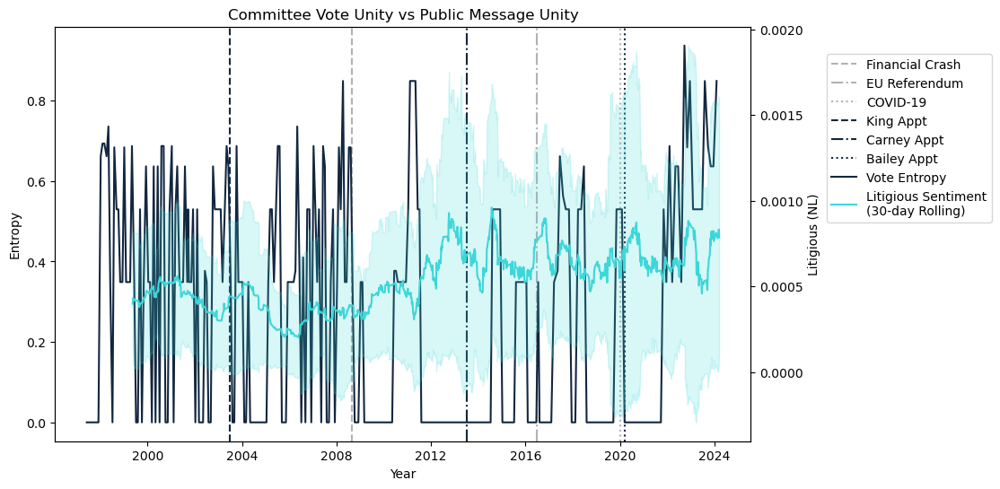

In [55]:
# Entropy vs Litigious Sentiment.

# Create a new plot.
plt.figure(figsize=(10, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2008-09-01'), color='grey', alpha=0.6, linestyle='--', label='Financial Crash')
plt.axvline(pd.Timestamp('2016-06-23'), color='grey', alpha=0.6, linestyle='-.', label='EU Referendum')
plt.axvline(pd.Timestamp('2020-01-01'), color='grey', alpha=0.6, linestyle=':', label='COVID-19')

# Add vertical lines for change in Governer.
plt.axvline(pd.Timestamp('2003-07-01'), color=BoE_blue, linestyle='--', label='King Appt')
plt.axvline(pd.Timestamp('2013-07-01'), color=BoE_blue, linestyle='-.', label='Carney Appt')
plt.axvline(pd.Timestamp('2020-03-16'), color=BoE_blue, linestyle=':', label='Bailey Appt')

# Plot vote entropy on the primary y-axis.
ax1 = sns.lineplot(data=vote_entropy, x='Date', y='Entropy', color=BoE_blue, label='Vote Entropy')

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent['litigious_normalised'].rolling(window=30).mean()
rolling_std = av_sent['litigious_normalised'].rolling(window=window).std()         # Calculate standard deviation.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent.index, y=rolling_avg, 
             color=colour_map['litigious_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Litigious Sentiment\n(30-day Rolling)', ax=ax2)

# Add confidence interval shading
plt.fill_between(av_sent.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['litigious_normalised'], alpha=0.2)

# Set y-axis labels.
ax1.set_ylabel('Entropy')
ax2.set_ylabel('Litigious (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Committee Vote Unity vs Public Message Unity')

# Combine handles and labels from both legends
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Toggle either of the below two legends to place it inside or outside.
# Create a single legend in the top right corner.
#plt.legend(handles, labels, loc='upper right')

# Place the legend outside the graph.
plt.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.1, 0.95))

# Remove the individual legends.
ax1.get_legend().remove()

# Save the plot as a PNG file.
plt.savefig('Vote_Entropy_vs_Mean+SD_Litigious30dr')

# Show the plot.
plt.show()

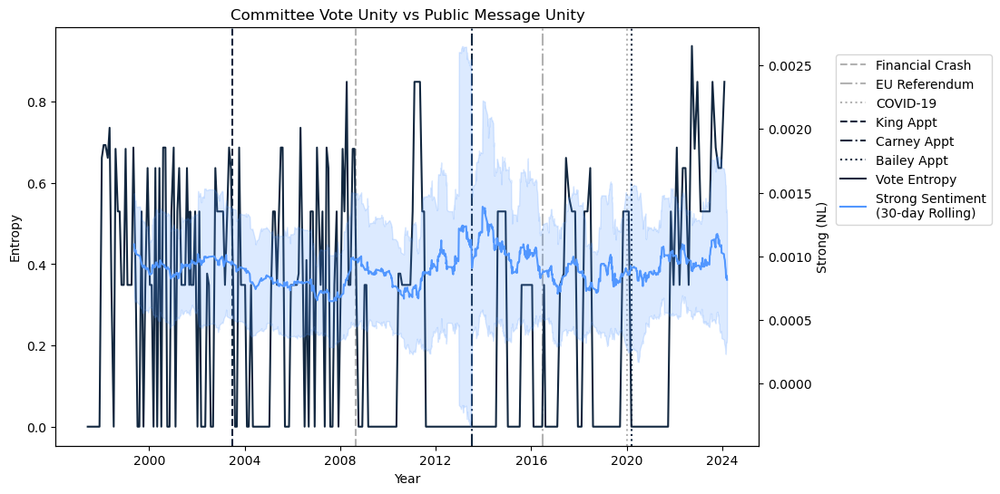

In [56]:
# Entropy vs Strong Sentiment.

# Create a new plot.
plt.figure(figsize=(10, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2008-09-01'), color='grey', alpha=0.6, linestyle='--', label='Financial Crash')
plt.axvline(pd.Timestamp('2016-06-23'), color='grey', alpha=0.6, linestyle='-.', label='EU Referendum')
plt.axvline(pd.Timestamp('2020-01-01'), color='grey', alpha=0.6, linestyle=':', label='COVID-19')

# Add vertical lines for change in Governer.
plt.axvline(pd.Timestamp('2003-07-01'), color=BoE_blue, linestyle='--', label='King Appt')
plt.axvline(pd.Timestamp('2013-07-01'), color=BoE_blue, linestyle='-.', label='Carney Appt')
plt.axvline(pd.Timestamp('2020-03-16'), color=BoE_blue, linestyle=':', label='Bailey Appt')

# Plot vote entropy on the primary y-axis.
ax1 = sns.lineplot(data=vote_entropy, x='Date', y='Entropy', color=BoE_blue, label='Vote Entropy')

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent['strong_normalised'].rolling(window=30).mean()
rolling_std = av_sent['strong_normalised'].rolling(window=window).std()         # Calculate standard deviation.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent.index, y=rolling_avg, 
             color=colour_map['strong_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Strong Sentiment\n(30-day Rolling)', ax=ax2)

# Add confidence interval shading.
plt.fill_between(av_sent.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['strong_normalised'], alpha=0.2)

# Set y-axis labels.
ax1.set_ylabel('Entropy')
ax2.set_ylabel('Strong (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Committee Vote Unity vs Public Message Unity')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Toggle either of the below two legends to place it inside or outside.
# Create a single legend in the top right corner.
#plt.legend(handles, labels, loc='upper right')

# Place the legend outside the graph.
plt.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.1, 0.95))

# Remove the individual legends.
ax1.get_legend().remove()

# Save the plot as a PNG file.
plt.savefig('Vote_Entropy_vs_Mean+SD_Strong30dr')

# Show the plot.
plt.show()

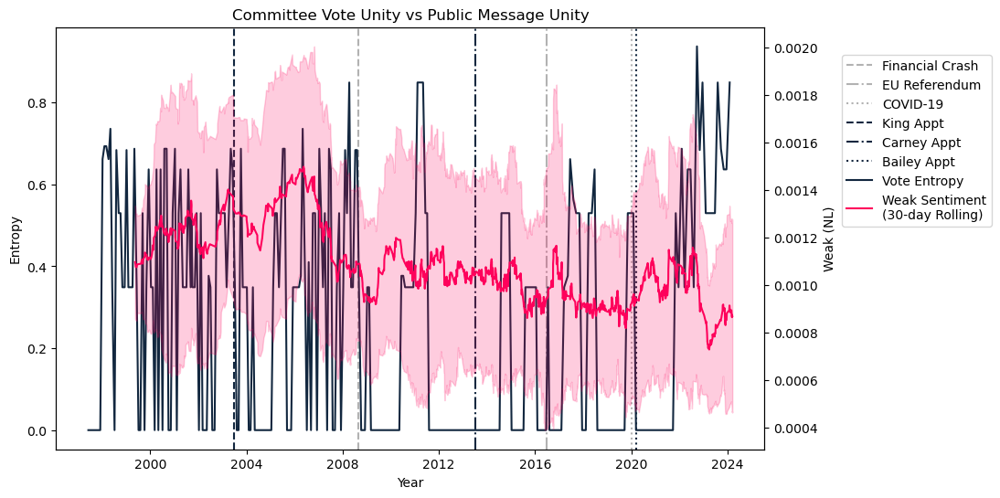

In [57]:
# Entropy vs Weak Sentiment.

# Create a new plot.
plt.figure(figsize=(10, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2008-09-01'), color='grey', alpha=0.6, linestyle='--', label='Financial Crash')
plt.axvline(pd.Timestamp('2016-06-23'), color='grey', alpha=0.6, linestyle='-.', label='EU Referendum')
plt.axvline(pd.Timestamp('2020-01-01'), color='grey', alpha=0.6, linestyle=':', label='COVID-19')

# Add vertical lines for change in Governor.
plt.axvline(pd.Timestamp('2003-07-01'), color=BoE_blue, linestyle='--', label='King Appt')
plt.axvline(pd.Timestamp('2013-07-01'), color=BoE_blue, linestyle='-.', label='Carney Appt')
plt.axvline(pd.Timestamp('2020-03-16'), color=BoE_blue, linestyle=':', label='Bailey Appt')

# Plot vote entropy on the primary y-axis.
ax1 = sns.lineplot(data=vote_entropy, x='Date', y='Entropy', color=BoE_blue, label='Vote Entropy')

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent['weak_normalised'].rolling(window=30).mean()
rolling_std = av_sent['weak_normalised'].rolling(window=window).std()         # Calculate standard deviation.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent.index, y=rolling_avg, 
             color=colour_map['weak_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Weak Sentiment\n(30-day Rolling)', ax=ax2)

# Add confidence interval shading.
plt.fill_between(av_sent.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['weak_normalised'], alpha=0.2)

# Set y-axis labels.
ax1.set_ylabel('Entropy')
ax2.set_ylabel('Weak (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Committee Vote Unity vs Public Message Unity')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Place the legend outside the graph.
plt.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.1, 0.95))

# Remove the individual legends.
ax1.get_legend().remove()

# Save the plot as a PNG file.
plt.savefig('Vote_Entropy_vs_Mean+SD_Weak30dr')

# Show the plot.
plt.show()

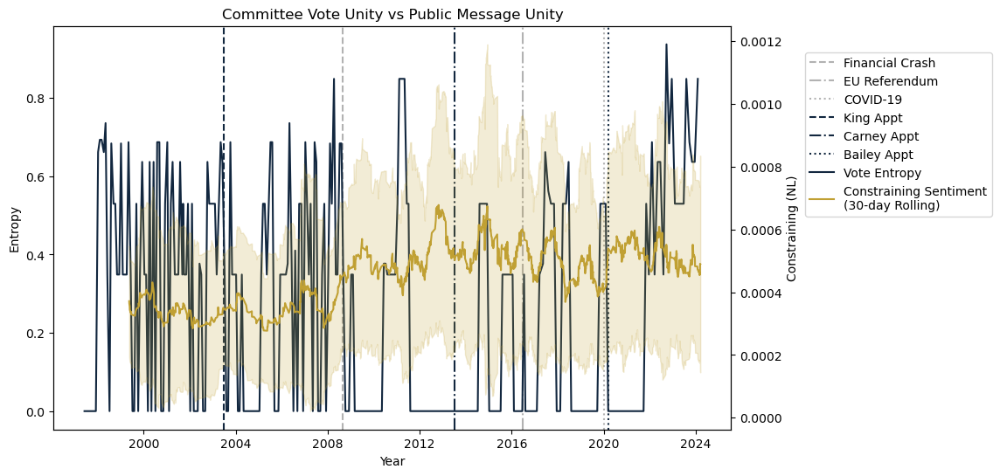

In [59]:
# Entropy vs Constraining Sentiment.

# Create a new plot.
plt.figure(figsize=(10, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2008-09-01'), color='grey', alpha=0.6, linestyle='--', label='Financial Crash')
plt.axvline(pd.Timestamp('2016-06-23'), color='grey', alpha=0.6, linestyle='-.', label='EU Referendum')
plt.axvline(pd.Timestamp('2020-01-01'), color='grey', alpha=0.6, linestyle=':', label='COVID-19')

# Add vertical lines for change in Governor.
plt.axvline(pd.Timestamp('2003-07-01'), color=BoE_blue, linestyle='--', label='King Appt')
plt.axvline(pd.Timestamp('2013-07-01'), color=BoE_blue, linestyle='-.', label='Carney Appt')
plt.axvline(pd.Timestamp('2020-03-16'), color=BoE_blue, linestyle=':', label='Bailey Appt')

# Plot vote entropy on the primary y-axis.
ax1 = sns.lineplot(data=vote_entropy, x='Date', y='Entropy', color=BoE_blue, label='Vote Entropy')

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent['constraining_normalised'].rolling(window=30).mean()
rolling_std = av_sent['constraining_normalised'].rolling(window=window).std()         # Calculate standard deviation.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent.index, y=rolling_avg, 
             color=colour_map['constraining_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Constraining Sentiment\n(30-day Rolling)', ax=ax2)

# Add confidence interval shading.
plt.fill_between(av_sent.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['constraining_normalised'], alpha=0.2)

# Set y-axis labels.
ax1.set_ylabel('Entropy')
ax2.set_ylabel('Constraining (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Committee Vote Unity vs Public Message Unity')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Place the legend outside the graph.
plt.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.1, 0.95))

# Remove the individual legends.
ax1.get_legend().remove()

# Save the plot as a PNG file.
plt.savefig('Vote_Entropy_vs_Mean+SD_Constraining30dr')

# Show the plot.
plt.show()

# Cosmetic Changes:

We will pause briefly to explore some cosmetic changes:

- Expressing standard deviation as its own line, rather than a fill on either side.
- Creating a rolling average for the vote entropy.

Lets apply this to Constraining Sentiment (above) as this example proved tricky to see high levels of devation when using the fill technique.

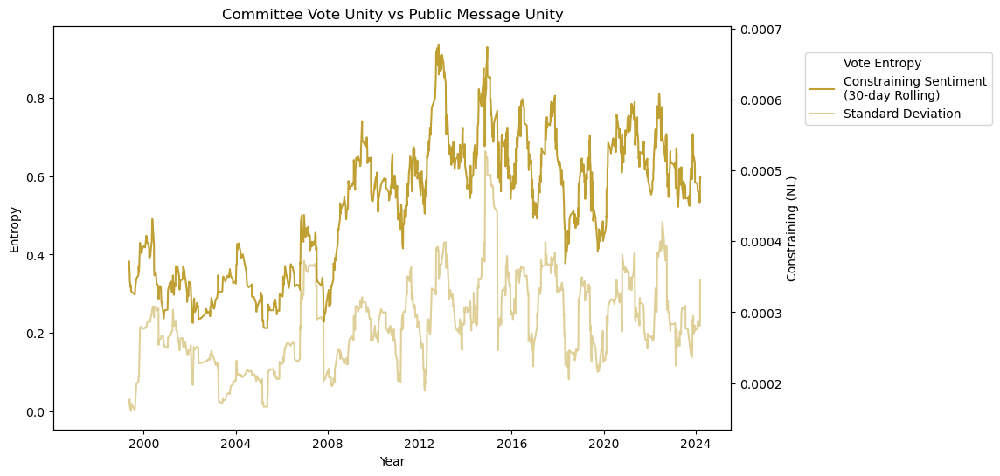

In [65]:
# Copy the code from the previous graphic.

# Create a new plot.
plt.figure(figsize=(10, 6))

# Comment out the envent lines. The less busy this visualisation is for now, the better.
"""
# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2008-09-01'), color='grey', alpha=0.6, linestyle='--', label='Financial Crash')
plt.axvline(pd.Timestamp('2016-06-23'), color='grey', alpha=0.6, linestyle='-.', label='EU Referendum')
plt.axvline(pd.Timestamp('2020-01-01'), color='grey', alpha=0.6, linestyle=':', label='COVID-19')

# Add vertical lines for change in Governor.
plt.axvline(pd.Timestamp('2003-07-01'), color=BoE_blue, linestyle='--', label='King Appt')
plt.axvline(pd.Timestamp('2013-07-01'), color=BoE_blue, linestyle='-.', label='Carney Appt')
plt.axvline(pd.Timestamp('2020-03-16'), color=BoE_blue, linestyle=':', label='Bailey Appt')
"""


# Plot vote entropy on the primary y-axis. NOTE: I will temporarily change the line colour to white as it is easier than stripping the code out!
ax1 = sns.lineplot(data=vote_entropy, x='Date', y='Entropy', 
                   color='white',                                          # Colour change to white!
                   label='Vote Entropy')

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent['constraining_normalised'].rolling(window=30).mean()
rolling_std = av_sent['constraining_normalised'].rolling(window=window).std()         # Calculate standard deviation.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent.index, y=rolling_avg, 
             color=colour_map['constraining_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Constraining Sentiment\n(30-day Rolling)', ax=ax2)

# Change the standard deviation from a fill to a line. I have commented out the old line and added the new method below.
# plt.fill_between(av_sent.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['constraining_normalised'], alpha=0.2)
sns.lineplot(x=av_sent.index, y=rolling_std, 
             color=colour_map['constraining_normalised'],
             label='Standard Deviation',
             alpha=0.5,
             ax = ax2)


# Set y-axis labels.
ax1.set_ylabel('Entropy')
ax2.set_ylabel('Constraining (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Committee Vote Unity vs Public Message Unity')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Place the legend outside the graph.
plt.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.1, 0.95))

# Remove the individual legends.
ax1.get_legend().remove()

# Save the plot as a PNG file. (Ignore this set for now).
# plt.savefig('Vote_Entropy_vs_Mean+SD_Constraining30dr')

# Show the plot.
plt.show()

<b> Thoughts: <b>

I have toggled a few different colours and line styles. I think this boils down to the trade off that fill offers and which, generally, is more intuitive. Plotting standard eviation as another line seems inappropriate, as dual line graphs are typically used to express relationships between different variables, not to express two statistical features of the same variable.

Shaded regions lose us that prevision, however we gain (or at least retain) clarity of purpose. The audience will likely find it much easier to digest the meaning that the filled area is converying.

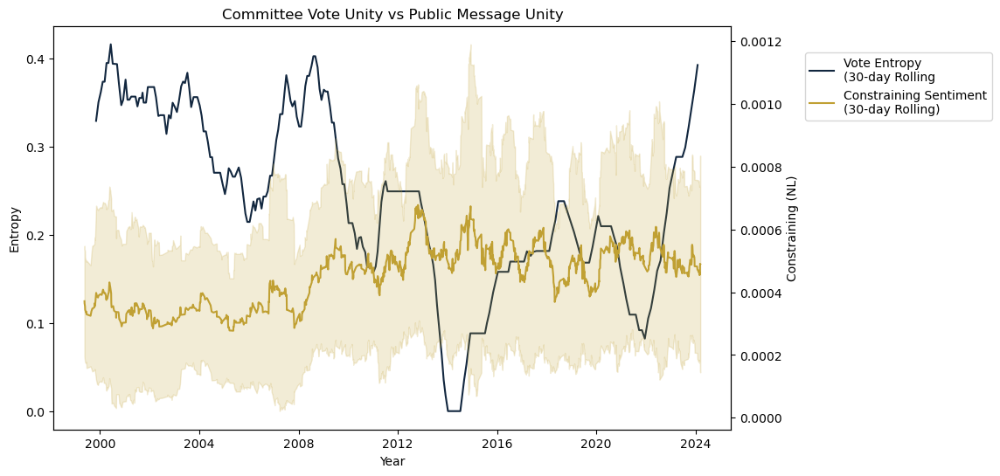

In [69]:
# Changing the entropy to a 30-dat rolling line.

# Create a new plot.
plt.figure(figsize=(10, 6))

# Again, comment out the events to reduce clutter.
"""
# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2008-09-01'), color='grey', alpha=0.6, linestyle='--', label='Financial Crash')
plt.axvline(pd.Timestamp('2016-06-23'), color='grey', alpha=0.6, linestyle='-.', label='EU Referendum')
plt.axvline(pd.Timestamp('2020-01-01'), color='grey', alpha=0.6, linestyle=':', label='COVID-19')

# Add vertical lines for change in Governor.
plt.axvline(pd.Timestamp('2003-07-01'), color=BoE_blue, linestyle='--', label='King Appt')
plt.axvline(pd.Timestamp('2013-07-01'), color=BoE_blue, linestyle='-.', label='Carney Appt')
plt.axvline(pd.Timestamp('2020-03-16'), color=BoE_blue, linestyle=':', label='Bailey Appt')
"""

# Plot vote entropy on the primary y-axis. We must add a line creating the rolling average for entropy.
rolling_ent = vote_entropy['Entropy'].rolling(window=30).mean()
ax1 = sns.lineplot(x=vote_entropy['Date'],                                            # Keep this as as df['column'] as the index is not the date.
                   y=rolling_ent,                                                     # Add the newly created 'rolling_ent' object.
                   color=BoE_blue, label='Vote Entropy\n(30-day Rolling')

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent['constraining_normalised'].rolling(window=30).mean()
rolling_std = av_sent['constraining_normalised'].rolling(window=window).std()         # Calculate standard deviation.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent.index, y=rolling_avg, 
             color=colour_map['constraining_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Constraining Sentiment\n(30-day Rolling)', ax=ax2)

# Add confidence interval shading.
plt.fill_between(av_sent.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['constraining_normalised'], alpha=0.2)

# Set y-axis labels.
ax1.set_ylabel('Entropy')
ax2.set_ylabel('Constraining (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Committee Vote Unity vs Public Message Unity')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Place the legend outside the graph.
plt.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.1, 0.95))

# Remove the individual legends.
ax1.get_legend().remove()

# Save the plot as a PNG file. (Ignore this set for now).
# plt.savefig('Vote_Entropy_vs_Mean+SD_Constraining30dr')

# Show the plot.
plt.show()

<b> Thoughts: <b>

This looks much neater but we lose the meaning somewhat here. This makes the early 2000s look like an era of sustained disunity. I will experiment with reducing and increasing the roll-time to 15 and 90 days.

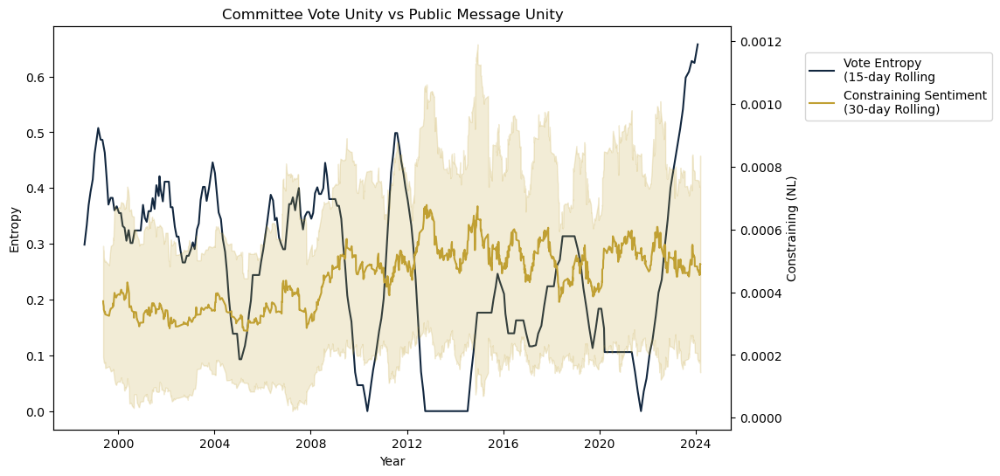

In [72]:
# Changing the entropy to a 30-dat rolling line.

# Create a new plot.
plt.figure(figsize=(10, 6))

# Again, comment out the events to reduce clutter.
"""
# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2008-09-01'), color='grey', alpha=0.6, linestyle='--', label='Financial Crash')
plt.axvline(pd.Timestamp('2016-06-23'), color='grey', alpha=0.6, linestyle='-.', label='EU Referendum')
plt.axvline(pd.Timestamp('2020-01-01'), color='grey', alpha=0.6, linestyle=':', label='COVID-19')

# Add vertical lines for change in Governor.
plt.axvline(pd.Timestamp('2003-07-01'), color=BoE_blue, linestyle='--', label='King Appt')
plt.axvline(pd.Timestamp('2013-07-01'), color=BoE_blue, linestyle='-.', label='Carney Appt')
plt.axvline(pd.Timestamp('2020-03-16'), color=BoE_blue, linestyle=':', label='Bailey Appt')
"""

# Plot vote entropy on the primary y-axis. We must add a line creating the rolling average for entropy.
rolling_ent = vote_entropy['Entropy'].rolling(window=15).mean()
ax1 = sns.lineplot(x=vote_entropy['Date'],                                            # Keep this as as df['column'] as the index is not the date.
                   y=rolling_ent,                                                     # Add the newly created 'rolling_ent' object.
                   color=BoE_blue, label='Vote Entropy\n(15-day Rolling')

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent['constraining_normalised'].rolling(window=30).mean()
rolling_std = av_sent['constraining_normalised'].rolling(window=window).std()         # Calculate standard deviation.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent.index, y=rolling_avg, 
             color=colour_map['constraining_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Constraining Sentiment\n(30-day Rolling)', ax=ax2)

# Add confidence interval shading.
plt.fill_between(av_sent.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['constraining_normalised'], alpha=0.2)

# Set y-axis labels.
ax1.set_ylabel('Entropy')
ax2.set_ylabel('Constraining (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Committee Vote Unity vs Public Message Unity')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Place the legend outside the graph.
plt.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.1, 0.95))

# Remove the individual legends.
ax1.get_legend().remove()

# Save the plot as a PNG file. (Ignore this set for now).
# plt.savefig('Vote_Entropy_vs_Mean+SD_Constraining30dr')

# Show the plot.
plt.show()

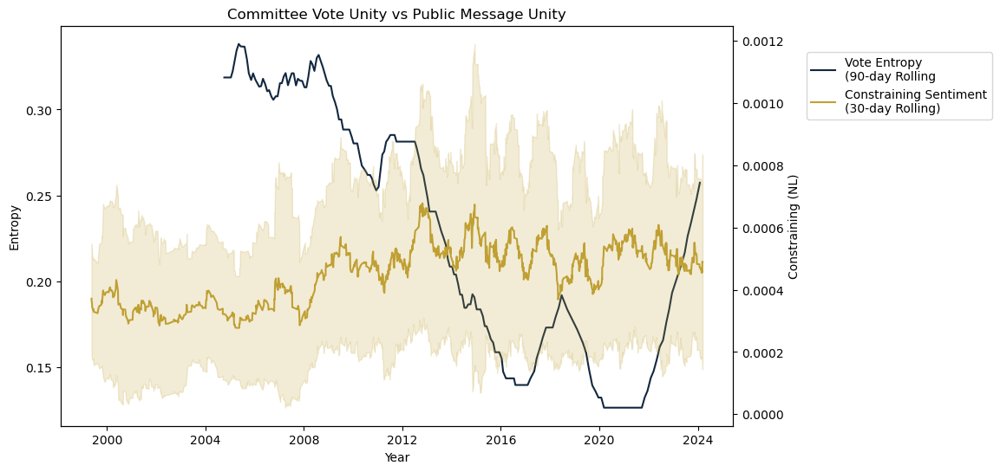

In [73]:
# Changing the entropy to a 30-dat rolling line.

# Create a new plot.
plt.figure(figsize=(10, 6))

# Again, comment out the events to reduce clutter.
"""
# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2008-09-01'), color='grey', alpha=0.6, linestyle='--', label='Financial Crash')
plt.axvline(pd.Timestamp('2016-06-23'), color='grey', alpha=0.6, linestyle='-.', label='EU Referendum')
plt.axvline(pd.Timestamp('2020-01-01'), color='grey', alpha=0.6, linestyle=':', label='COVID-19')

# Add vertical lines for change in Governor.
plt.axvline(pd.Timestamp('2003-07-01'), color=BoE_blue, linestyle='--', label='King Appt')
plt.axvline(pd.Timestamp('2013-07-01'), color=BoE_blue, linestyle='-.', label='Carney Appt')
plt.axvline(pd.Timestamp('2020-03-16'), color=BoE_blue, linestyle=':', label='Bailey Appt')
"""

# Plot vote entropy on the primary y-axis. We must add a line creating the rolling average for entropy.
rolling_ent = vote_entropy['Entropy'].rolling(window=90).mean()
ax1 = sns.lineplot(x=vote_entropy['Date'],                                            # Keep this as as df['column'] as the index is not the date.
                   y=rolling_ent,                                                     # Add the newly created 'rolling_ent' object.
                   color=BoE_blue, label='Vote Entropy\n(90-day Rolling')

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent['constraining_normalised'].rolling(window=30).mean()
rolling_std = av_sent['constraining_normalised'].rolling(window=window).std()         # Calculate standard deviation.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent.index, y=rolling_avg, 
             color=colour_map['constraining_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Constraining Sentiment\n(30-day Rolling)', ax=ax2)

# Add confidence interval shading.
plt.fill_between(av_sent.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['constraining_normalised'], alpha=0.2)

# Set y-axis labels.
ax1.set_ylabel('Entropy')
ax2.set_ylabel('Constraining (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Committee Vote Unity vs Public Message Unity')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Place the legend outside the graph.
plt.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.1, 0.95))

# Remove the individual legends.
ax1.get_legend().remove()

# Save the plot as a PNG file. (Ignore this set for now).
# plt.savefig('Vote_Entropy_vs_Mean+SD_Constraining30dr')

# Show the plot.
plt.show()

<b> Thoughts: <b>

It is clear that significant meaning is lost with a higher roll time. The early 2000s look less unified than they actually were and the entropy value is quite badly watered down. A 15 day roll seems like a good compromise. It retains the 'scrathy' line for the early 2000s which derive from periodic agreement. Importantly it also shows the spike in entropy in 2022-2024.

With that in mind, let us just save a graphic of the 15 day entropy roll.

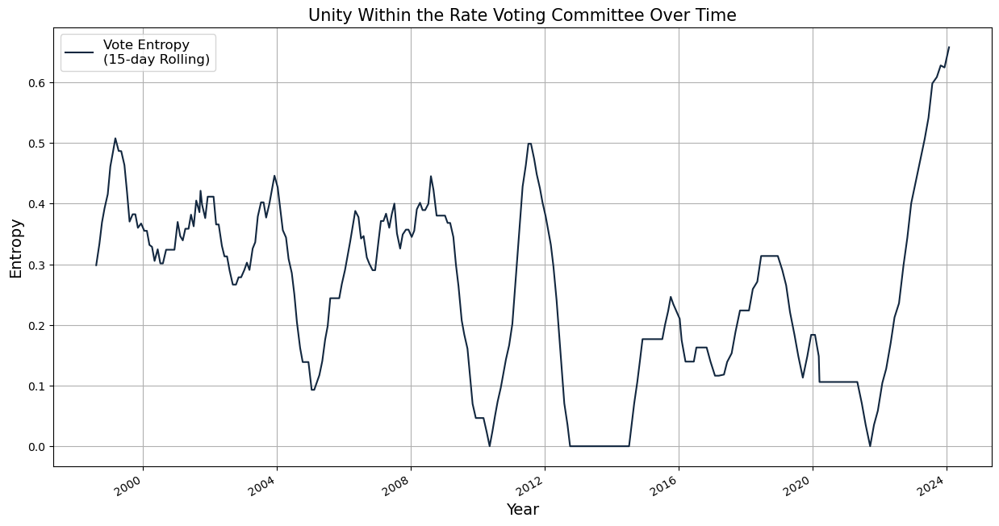

In [99]:
# Plotting 15-day rolling entropy over time.
# First we need to redefine the object to 15 days, as the above set it at 30.
rolling_ent = vote_entropy['Entropy'].rolling(window=15).mean()

# Let's also create a copy of this DataFrame for the purposes of this plot only.
rolling_ent2 = rolling_ent.copy()

# Let's just set the index of 'rolling_ent2' to the date column in the original vote_entropy df.
rolling_ent2.index = vote_entropy['Date']

# Plot the graphic.
plt.figure(figsize=(15, 8))

rolling_ent2.plot(label='Vote Entropy\n(15-day Rolling)',
               color = BoE_blue)

# Add labels and a title.
plt.title('Unity Within the Rate Voting Committee Over Time', fontsize=15)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Entropy', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)

# Save the plot as a PNG file.
plt.savefig('Vote_Entropy_15dr')

# Show the plot.
plt.show()


# We will now focus in on sentiments & points in time of interest.

<b> Strong Sentiment: Carney Transtition - 2013

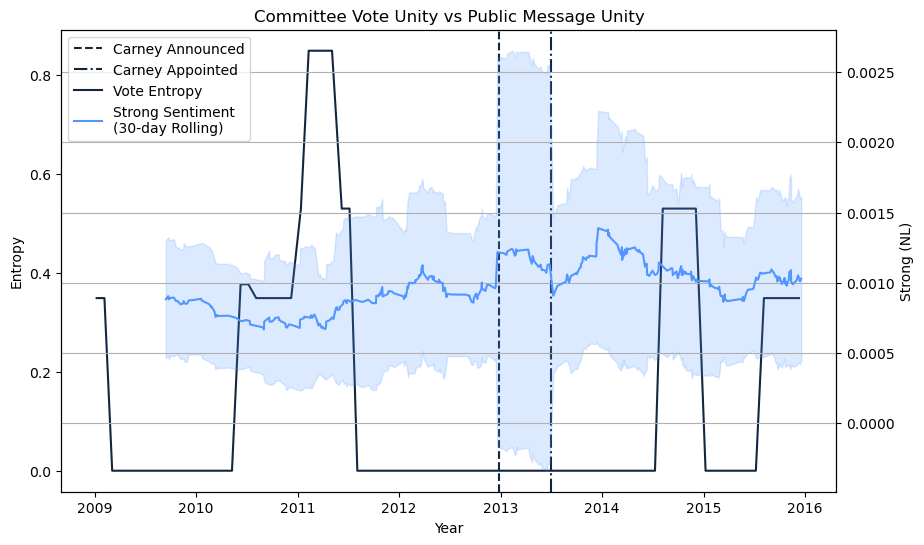

In [341]:
# Define the date range in question. We will look at 2010-2015.
start_date = '2009-01-01'
end_date = '2015-12-31'

# Filter vote_entropy and av_sent dataframes.
vote_entropy_filtered = vote_entropy[(vote_entropy['Date'] >= start_date) & (vote_entropy['Date'] <= end_date)]
av_sent_filtered = av_sent[(av_sent.index >= start_date) & (av_sent.index <= end_date)]

# Create a new plot.
plt.figure(figsize=(10, 6))

# Add vertical lines for change in Governer.
plt.axvline(pd.Timestamp('2012-12-26'), color=BoE_blue, linestyle='--', label='Carney Announced')
plt.axvline(pd.Timestamp('2013-07-01'), color=BoE_blue, linestyle='-.', label='Carney Appointed')

# Plot the filtered vote entropy on the primary y-axis.
ax1 = sns.lineplot(data=vote_entropy_filtered, x='Date', y='Entropy', color=BoE_blue, label='Vote Entropy')

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent_filtered['strong_normalised'].rolling(window=30).mean()
rolling_std = av_sent_filtered['strong_normalised'].rolling(window=window).std()         # Calculate standard deviation.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent_filtered.index, y=rolling_avg, 
             color=colour_map['strong_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Strong Sentiment\n(30-day Rolling)', ax=ax2)

# Add confidence interval shading.
plt.fill_between(av_sent_filtered.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['strong_normalised'], alpha=0.2)

# Set y-axis labels.
ax1.set_ylabel('Entropy')
ax2.set_ylabel('Strong (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Committee Vote Unity vs Public Message Unity')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Toggle either of the below two legends to place it inside or outside.
# Create a single legend in the top right corner.
#plt.legend(handles, labels, loc='upper right')

# Place the legend outside the graph.
plt.legend(handles, labels, loc='upper left')

# Remove the individual legends.
ax1.get_legend().remove()

# Add grid lines.
plt.grid(True)

# Save the plot as a PNG file.
plt.savefig('Strong_Sent_Entropy_vs_CarneyAppointment')

# Show the plot.
plt.show()

<b> Strong Sentiment: Sustained Committee Disunity - 2022-2024

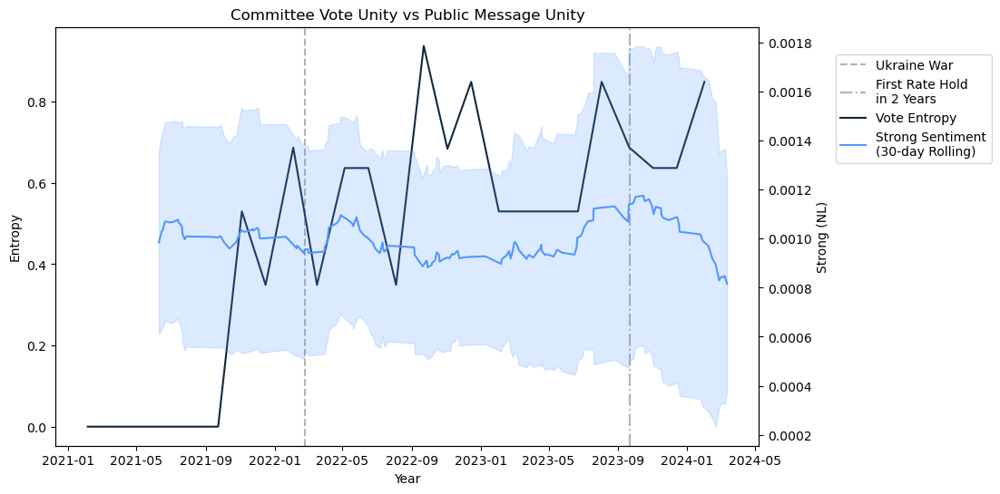

In [113]:
# Define the date range in question. We will look at 2021-2024.
start_date = '2021-01-01'
end_date = '2024-12-31'

# Filter vote_entropy and av_sent dataframes.
vote_entropy_filtered = vote_entropy[(vote_entropy['Date'] >= start_date) & (vote_entropy['Date'] <= end_date)]
av_sent_filtered = av_sent[(av_sent.index >= start_date) & (av_sent.index <= end_date)]

# Create a new plot.
plt.figure(figsize=(10, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2022-02-24'), color='grey', alpha=0.6, linestyle='--', label='Ukraine War')
plt.axvline(pd.Timestamp('2023-09-21'), color='grey', alpha=0.6, linestyle='-.', label='First Rate Hold\nin 2 Years')

# Plot the filtered vote entropy on the primary y-axis.
ax1 = sns.lineplot(data=vote_entropy_filtered, x='Date', y='Entropy', color=BoE_blue, label='Vote Entropy')

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent_filtered['strong_normalised'].rolling(window=30).mean()
rolling_std = av_sent_filtered['strong_normalised'].rolling(window=window).std()         # Calculate standard deviation.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent_filtered.index, y=rolling_avg, 
             color=colour_map['strong_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Strong Sentiment\n(30-day Rolling)', ax=ax2)

# Add confidence interval shading.
plt.fill_between(av_sent_filtered.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['strong_normalised'], alpha=0.2)

# Set y-axis labels.
ax1.set_ylabel('Entropy')
ax2.set_ylabel('Strong (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Committee Vote Unity vs Public Message Unity')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Toggle either of the below two legends to place it inside or outside.
# Create a single legend in the top right corner.
#plt.legend(handles, labels, loc='upper right')

# Place the legend outside the graph.
plt.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.1, 0.95))

# Remove the individual legends.
ax1.get_legend().remove()

# Save the plot as a PNG file.
plt.savefig('Strong_Sent_Entropy_vs_2024Unity')

# Show the plot.
plt.show()

<b> Thoughts: <b>

I think it is clear from the above that the Carney transition was unprecedented for the lack of coordination of strong sentiment in the messaging. This indicates a lack of discipline in messaging around this time. On the other hand, sustained disunity in the voting committee does not seem to carry through in speech sentiment. 

<b> Negative Sentiment: EU Referendum

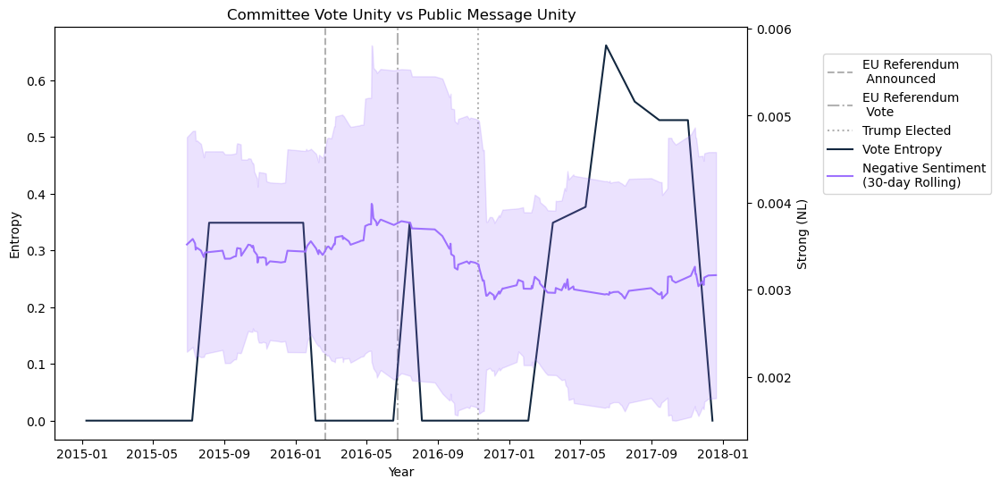

In [116]:
# Define the date range in question. We will look at 2013-2017.
start_date = '2015-01-01'
end_date = '2017-12-31'

# Filter vote_entropy and av_sent dataframes.
vote_entropy_filtered = vote_entropy[(vote_entropy['Date'] >= start_date) & (vote_entropy['Date'] <= end_date)]
av_sent_filtered = av_sent[(av_sent.index >= start_date) & (av_sent.index <= end_date)]

# Create a new plot.
plt.figure(figsize=(10, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2016-02-20'), color='grey', alpha=0.6, linestyle='--', label='EU Referendum\n Announced')
plt.axvline(pd.Timestamp('2016-06-23'), color='grey', alpha=0.6, linestyle='-.', label='EU Referendum\n Vote')
plt.axvline(pd.Timestamp('2016-11-08'), color='grey', alpha=0.6, linestyle=':', label='Trump Elected')

# Plot the filtered vote entropy on the primary y-axis.
ax1 = sns.lineplot(data=vote_entropy_filtered, x='Date', y='Entropy', color=BoE_blue, label='Vote Entropy')

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent_filtered['negative_normalised'].rolling(window=30).mean()
rolling_std = av_sent_filtered['negative_normalised'].rolling(window=window).std()         # Calculate standard deviation.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent_filtered.index, y=rolling_avg, 
             color=colour_map['negative_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Negative Sentiment\n(30-day Rolling)', ax=ax2)

# Add confidence interval shading.
plt.fill_between(av_sent_filtered.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['negative_normalised'], alpha=0.2)

# Set y-axis labels.
ax1.set_ylabel('Entropy')
ax2.set_ylabel('Negative (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Committee Vote Unity vs Public Message Unity')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Toggle either of the below two legends to place it inside or outside.
# Create a single legend in the top right corner.
#plt.legend(handles, labels, loc='upper right')

# Place the legend outside the graph.
plt.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.1, 0.95))

# Remove the individual legends.
ax1.get_legend().remove()

# Save the plot as a PNG file.
plt.savefig('Negative_Sent_Entropy_vs_EUREF')

# Show the plot.
plt.show()

<b> Thoughts: <b>

Okay, we can can again see that message deviations occur more around political events than they do around vote unity. 

<b> Uncertainty: 2020-2024

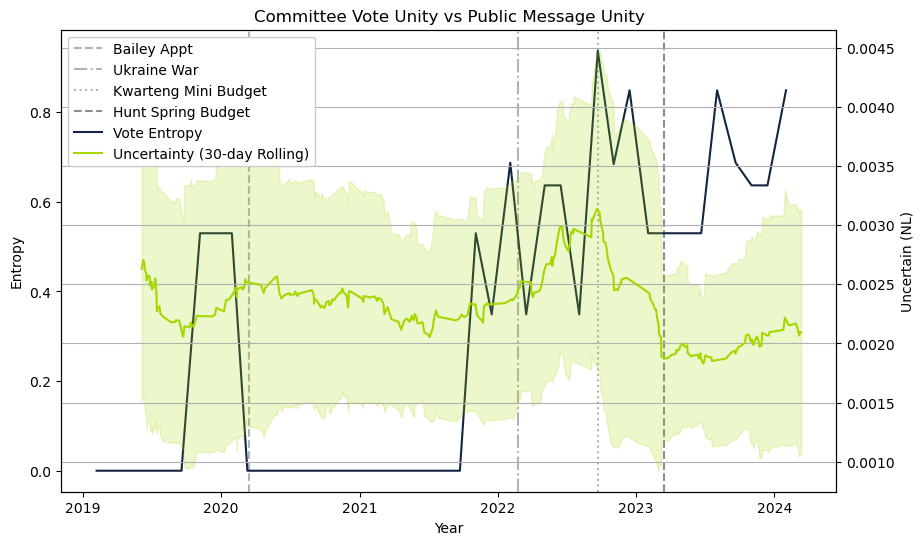

In [340]:
# Define the date range in question. We will look at 2019-2024.
start_date = '2019-01-01'
end_date = '2024-12-31'

# Filter vote_entropy and av_sent dataframes.
vote_entropy_filtered = vote_entropy[(vote_entropy['Date'] >= start_date) & (vote_entropy['Date'] <= end_date)]
av_sent_filtered = av_sent[(av_sent.index >= start_date) & (av_sent.index <= end_date)]

# Create a new plot.
plt.figure(figsize=(10, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2020-03-16'), color='grey', alpha=0.6, linestyle='--', label='Bailey Appt')
plt.axvline(pd.Timestamp('2022-02-24'), color='grey', alpha=0.6, linestyle='-.', label='Ukraine War')
plt.axvline(pd.Timestamp('2022-09-23'), color='grey', alpha=0.6, linestyle=':', label='Kwarteng Mini Budget')
plt.axvline(pd.Timestamp('2023-03-15'), color='grey', alpha=0.9, linestyle='--', label='Hunt Spring Budget')


# Plot the filtered vote entropy on the primary y-axis.
ax1 = sns.lineplot(data=vote_entropy_filtered, x='Date', y='Entropy', color=BoE_blue, label='Vote Entropy')

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent_filtered['uncertainty_normalised'].rolling(window=30).mean()
rolling_std = av_sent_filtered['uncertainty_normalised'].rolling(window=window).std()         # Calculate standard deviation.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent_filtered.index, y=rolling_avg, 
             color=colour_map['uncertainty_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Uncertainty (30-day Rolling)', ax=ax2)

# Add confidence interval shading.
plt.fill_between(av_sent_filtered.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['uncertainty_normalised'], alpha=0.2)

# Set y-axis labels.
ax1.set_ylabel('Entropy')
ax2.set_ylabel('Uncertain (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Committee Vote Unity vs Public Message Unity')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Toggle either of the below two legends to place it inside or outside.
# Create a single legend in the top right corner.
#plt.legend(handles, labels, loc='upper right')

# Place the legend outside the graph.
plt.legend(handles, labels, loc='upper left', 
          framealpha=1)                                # Remove any transparency to the legend.

# Remove the individual legends.
ax1.get_legend().remove()

# Add grid lines.
plt.grid(True)

# Save the plot as a PNG file.
plt.savefig('Uncertain_Sent_Entropy_vs_Recent_unity')

# Show the plot.
plt.show()

<b> Thoughts: <b>

We can see the message tighten after Bailey's appointment, however we must remember the pandemic was ongoing. The overall sentiment ticks up around the time the committee becomes disunited and this seems accelerated by Russia's invasion of Ukraine, likely due to the issues around the affect this would have on the UK economy. The Kwarteng and Hunt budgets align most neatly with the sentiment shifts in this period. 

<b> Litigious: GFC 2008, Carney appointment 2013, 2020-2024. 

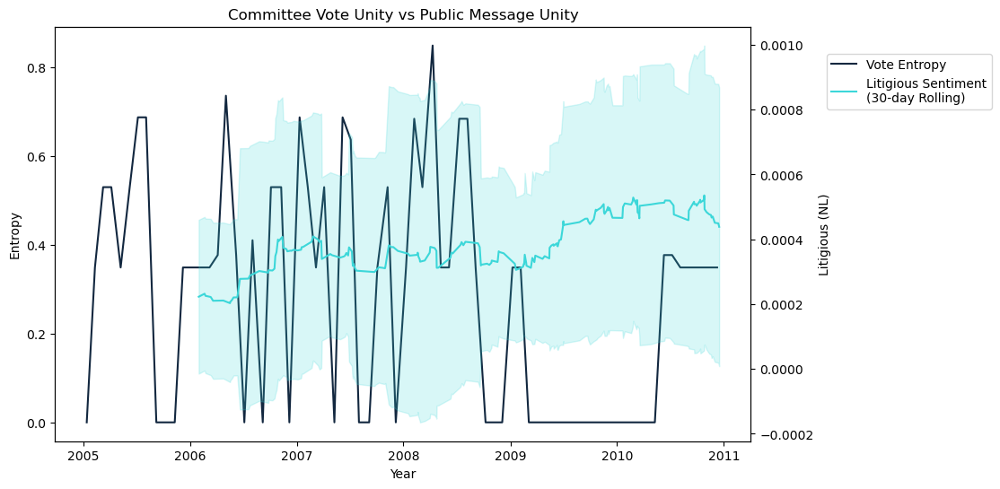

In [130]:
# Define the date range in question. We will look at 2000-2004.
start_date = '2005-01-01'
end_date = '2010-12-31'

# Filter vote_entropy and av_sent dataframes.
vote_entropy_filtered = vote_entropy[(vote_entropy['Date'] >= start_date) & (vote_entropy['Date'] <= end_date)]
av_sent_filtered = av_sent[(av_sent.index >= start_date) & (av_sent.index <= end_date)]

# Create a new plot.
plt.figure(figsize=(10, 6))

# Add vertical lines for significant events.
#plt.axvline(pd.Timestamp('2003-07-01'), color='grey', alpha=0.6, linestyle='--', label='King Appt')

# Plot the filtered vote entropy on the primary y-axis.
ax1 = sns.lineplot(data=vote_entropy_filtered, x='Date', y='Entropy', color=BoE_blue, label='Vote Entropy')

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent_filtered['litigious_normalised'].rolling(window=30).mean()
rolling_std = av_sent_filtered['litigious_normalised'].rolling(window=window).std()         # Calculate standard deviation.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent_filtered.index, y=rolling_avg, 
             color=colour_map['litigious_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Litigious Sentiment\n(30-day Rolling)', ax=ax2)

# Add confidence interval shading.
plt.fill_between(av_sent_filtered.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['litigious_normalised'], alpha=0.2)

# Set y-axis labels.
ax1.set_ylabel('Entropy')
ax2.set_ylabel('Litigious (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Committee Vote Unity vs Public Message Unity')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Toggle either of the below two legends to place it inside or outside.
# Create a single legend in the top right corner.
#plt.legend(handles, labels, loc='upper right')

# Place the legend outside the graph.
plt.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.1, 0.95))

# Remove the individual legends.
ax1.get_legend().remove()

# Save the plot as a PNG file.
plt.savefig('Litigious_Sent_vs_Entropy_2008')

# Show the plot.
plt.show()

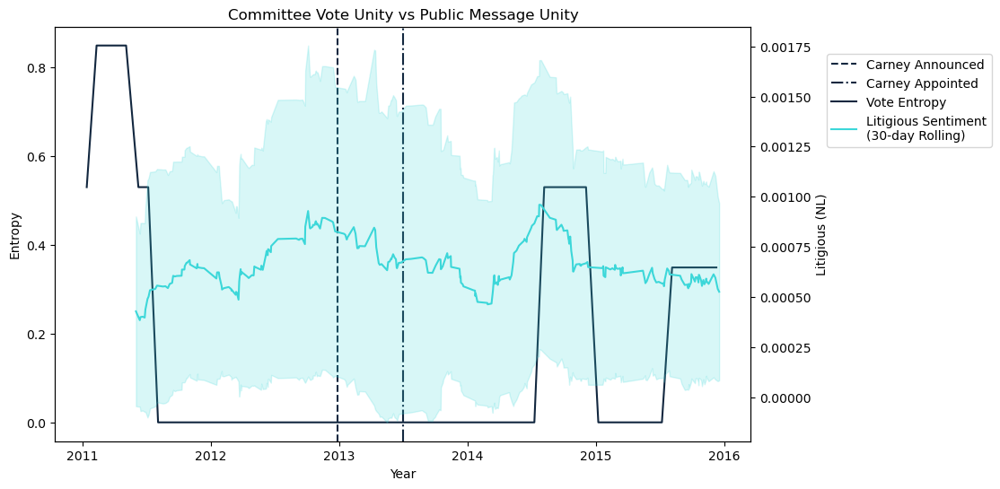

In [132]:
# Define the date range in question. We will look at 2011-2015.
start_date = '2011-01-01'
end_date = '2015-12-31'

# Filter vote_entropy and av_sent dataframes.
vote_entropy_filtered = vote_entropy[(vote_entropy['Date'] >= start_date) & (vote_entropy['Date'] <= end_date)]
av_sent_filtered = av_sent[(av_sent.index >= start_date) & (av_sent.index <= end_date)]

# Create a new plot.
plt.figure(figsize=(10, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2012-12-26'), color=BoE_blue, linestyle='--', label='Carney Announced')
plt.axvline(pd.Timestamp('2013-07-01'), color=BoE_blue, linestyle='-.', label='Carney Appointed')

# Plot the filtered vote entropy on the primary y-axis.
ax1 = sns.lineplot(data=vote_entropy_filtered, x='Date', y='Entropy', color=BoE_blue, label='Vote Entropy')

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent_filtered['litigious_normalised'].rolling(window=30).mean()
rolling_std = av_sent_filtered['litigious_normalised'].rolling(window=window).std()         # Calculate standard deviation.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent_filtered.index, y=rolling_avg, 
             color=colour_map['litigious_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Litigious Sentiment\n(30-day Rolling)', ax=ax2)

# Add confidence interval shading.
plt.fill_between(av_sent_filtered.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['litigious_normalised'], alpha=0.2)

# Set y-axis labels.
ax1.set_ylabel('Entropy')
ax2.set_ylabel('Litigious (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Committee Vote Unity vs Public Message Unity')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Toggle either of the below two legends to place it inside or outside.
# Create a single legend in the top right corner.
#plt.legend(handles, labels, loc='upper right')

# Place the legend outside the graph.
plt.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.1, 0.95))

# Remove the individual legends.
ax1.get_legend().remove()

# Save the plot as a PNG file.
plt.savefig('Litigious_Sent_vs_Entropy_2008')

# Show the plot.
plt.show()

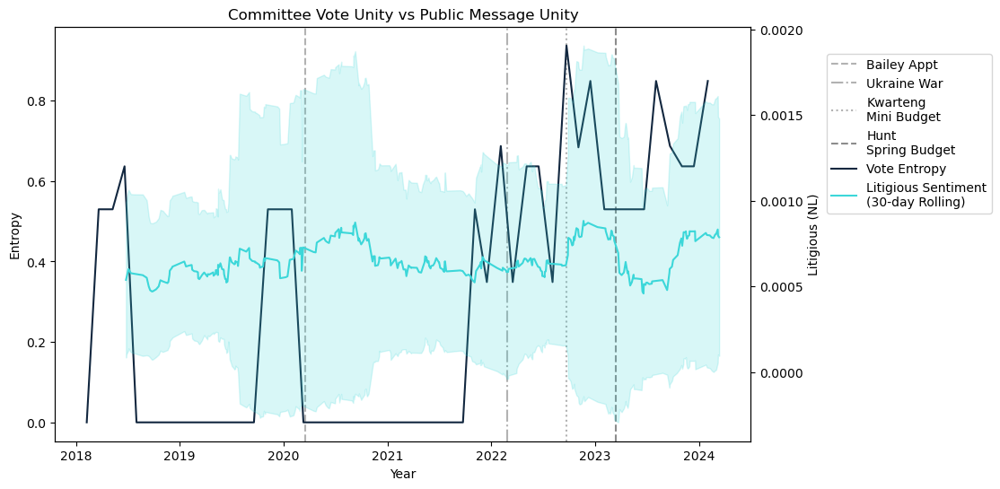

In [134]:
# Define the date range in question. We will look at 2019-2024.
start_date = '2018-01-01'
end_date = '2024-12-31'

# Filter vote_entropy and av_sent dataframes.
vote_entropy_filtered = vote_entropy[(vote_entropy['Date'] >= start_date) & (vote_entropy['Date'] <= end_date)]
av_sent_filtered = av_sent[(av_sent.index >= start_date) & (av_sent.index <= end_date)]

# Create a new plot.
plt.figure(figsize=(10, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2020-03-16'), color='grey', alpha=0.6, linestyle='--', label='Bailey Appt')
plt.axvline(pd.Timestamp('2022-02-24'), color='grey', alpha=0.6, linestyle='-.', label='Ukraine War')
plt.axvline(pd.Timestamp('2022-09-23'), color='grey', alpha=0.6, linestyle=':', label='Kwarteng\nMini Budget')
plt.axvline(pd.Timestamp('2023-03-15'), color='grey', alpha=0.9, linestyle='--', label='Hunt\nSpring Budget')

# Plot the filtered vote entropy on the primary y-axis.
ax1 = sns.lineplot(data=vote_entropy_filtered, x='Date', y='Entropy', color=BoE_blue, label='Vote Entropy')

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent_filtered['litigious_normalised'].rolling(window=30).mean()
rolling_std = av_sent_filtered['litigious_normalised'].rolling(window=window).std()         # Calculate standard deviation.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent_filtered.index, y=rolling_avg, 
             color=colour_map['litigious_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Litigious Sentiment\n(30-day Rolling)', ax=ax2)

# Add confidence interval shading.
plt.fill_between(av_sent_filtered.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['litigious_normalised'], alpha=0.2)

# Set y-axis labels.
ax1.set_ylabel('Entropy')
ax2.set_ylabel('Litigious (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Committee Vote Unity vs Public Message Unity')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Toggle either of the below two legends to place it inside or outside.
# Create a single legend in the top right corner.
#plt.legend(handles, labels, loc='upper right')

# Place the legend outside the graph.
plt.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.1, 0.95))

# Remove the individual legends.
ax1.get_legend().remove()

# Save the plot as a PNG file.
plt.savefig('Litigious_Sent_vs_Entropy_2020_2024')

# Show the plot.
plt.show()

<b> Thoughts: <b>

Again, unity of message appears most reactive to political events.

<b> Weak: Bexit vote.

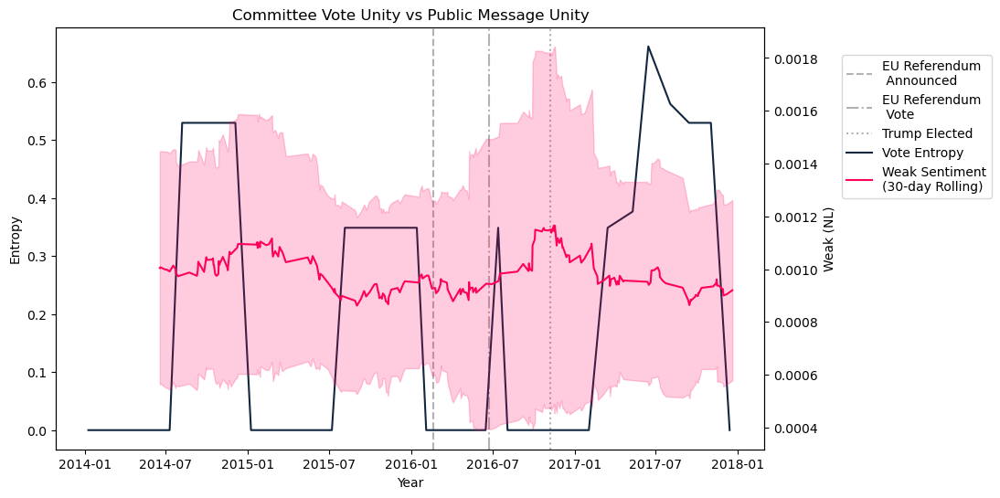

In [135]:
# Define the date range in question. We will look at 2014-2017.
start_date = '2014-01-01'
end_date = '2017-12-31'

# Filter vote_entropy and av_sent dataframes.
vote_entropy_filtered = vote_entropy[(vote_entropy['Date'] >= start_date) & (vote_entropy['Date'] <= end_date)]
av_sent_filtered = av_sent[(av_sent.index >= start_date) & (av_sent.index <= end_date)]

# Create a new plot.
plt.figure(figsize=(10, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2016-02-20'), color='grey', alpha=0.6, linestyle='--', label='EU Referendum\n Announced')
plt.axvline(pd.Timestamp('2016-06-23'), color='grey', alpha=0.6, linestyle='-.', label='EU Referendum\n Vote')
plt.axvline(pd.Timestamp('2016-11-08'), color='grey', alpha=0.6, linestyle=':', label='Trump Elected')

# Plot the filtered vote entropy on the primary y-axis.
ax1 = sns.lineplot(data=vote_entropy_filtered, x='Date', y='Entropy', color=BoE_blue, label='Vote Entropy')

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent_filtered['weak_normalised'].rolling(window=30).mean()
rolling_std = av_sent_filtered['weak_normalised'].rolling(window=window).std()         # Calculate standard deviation.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent_filtered.index, y=rolling_avg, 
             color=colour_map['weak_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Weak Sentiment\n(30-day Rolling)', ax=ax2)

# Add confidence interval shading.
plt.fill_between(av_sent_filtered.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['weak_normalised'], alpha=0.2)

# Set y-axis labels.
ax1.set_ylabel('Entropy')
ax2.set_ylabel('Weak (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Committee Vote Unity vs Public Message Unity')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Toggle either of the below two legends to place it inside or outside.
# Create a single legend in the top right corner.
#plt.legend(handles, labels, loc='upper right')

# Place the legend outside the graph.
plt.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.1, 0.95))

# Remove the individual legends.
ax1.get_legend().remove()

# Save the plot as a PNG file.
plt.savefig('Weak_Sent_vs_Entropy_2020_2024')

# Show the plot.
plt.show()

<b> Thoughts: <b>

Weak is the langauge of lacking conviction. We see this tracks with political events rather than committee unity.

<b> Constraining: 2012-2016 

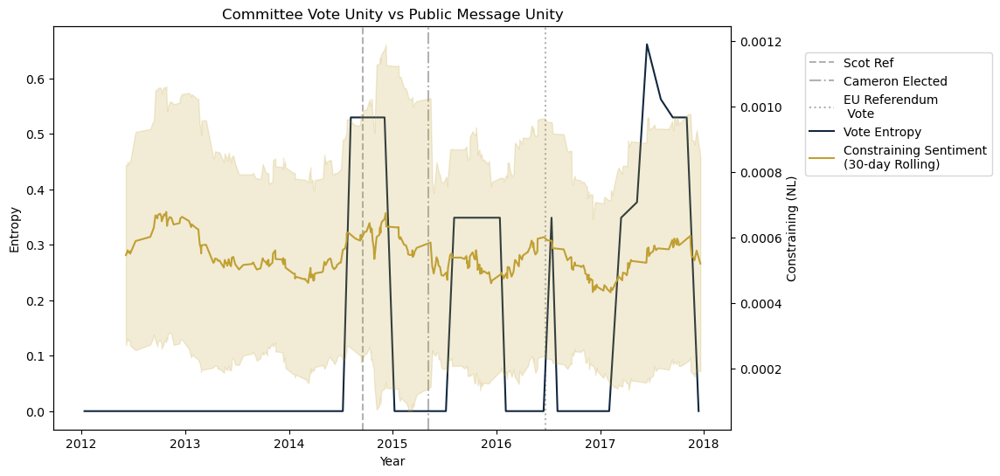

In [140]:
# Define the date range in question. We will look at 2012-2017.
start_date = '2012-01-01'
end_date = '2017-12-31'

# Filter vote_entropy and av_sent dataframes.
vote_entropy_filtered = vote_entropy[(vote_entropy['Date'] >= start_date) & (vote_entropy['Date'] <= end_date)]
av_sent_filtered = av_sent[(av_sent.index >= start_date) & (av_sent.index <= end_date)]

# Create a new plot.
plt.figure(figsize=(10, 6))

# Add vertical lines for significant events.
plt.axvline(pd.Timestamp('2014-09-18'), color='grey', alpha=0.6, linestyle='--', label='Scot Ref')
plt.axvline(pd.Timestamp('2015-05-07'), color='grey', alpha=0.6, linestyle='-.', label='Cameron Elected')
plt.axvline(pd.Timestamp('2016-06-23'), color='grey', alpha=0.6, linestyle=':', label='EU Referendum\n Vote')

# Plot the filtered vote entropy on the primary y-axis.
ax1 = sns.lineplot(data=vote_entropy_filtered, x='Date', y='Entropy', color=BoE_blue, label='Vote Entropy')

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent_filtered['constraining_normalised'].rolling(window=30).mean()
rolling_std = av_sent_filtered['constraining_normalised'].rolling(window=window).std()         # Calculate standard deviation.
ax2 = ax1.twinx()
sns.lineplot(x=av_sent_filtered.index, y=rolling_avg, 
             color=colour_map['constraining_normalised'],                             # Add the name of the sentiment again to apply correct colour.
             label='Constraining Sentiment\n(30-day Rolling)', ax=ax2)

# Add confidence interval shading.
plt.fill_between(av_sent_filtered.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['constraining_normalised'], alpha=0.2)

# Set y-axis labels.
ax1.set_ylabel('Entropy')
ax2.set_ylabel('Constraining (NL)')

# Set the x-axis label.
ax1.set_xlabel('Year')

# Set the title.
plt.title('Committee Vote Unity vs Public Message Unity')

# Combine handles and labels from both legends.
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
handles = handles1 + handles2
labels = labels1 + labels2

# Toggle either of the below two legends to place it inside or outside.
# Create a single legend in the top right corner.
#plt.legend(handles, labels, loc='upper right')

# Place the legend outside the graph.
plt.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.1, 0.95))

# Remove the individual legends.
ax1.get_legend().remove()

# Save the plot as a PNG file.
plt.savefig('Constraining_Sent_vs_Entropy_2012_2016')

# Show the plot.
plt.show()

<b> Thoughts: <b>

Having looked at all of the sentiments, we can definitively state that political events have a greater affect on sentiment than the unity in the bank rate voting committee.

# Avoiding Shock:

We have established that sentiment mean and deviation correlate with political events and bear no relation to committee unity. We have not yet established whether this soft influence has been used in a way to avoid shock. We will focus in on this next, looking specifically at the 2022 'Mini Budget' crisis. We will assess a crisis by measuring volatility in the FTSE 250, an index more attune to the high street level retailers and businesses of the UK. We will further compare this to litigious and constraining sentiment around this time.

## Importing FTSE 250 data.

In [231]:
# Install these libraries if required.
#!pip install pandas_datareader 
#!pip install yfinance

In [154]:
# Import the necessary libraries, packages, and modules.
# Data analysis:
import numpy as np
import pandas as pd
import statsmodels.api as sm 

# DataTime:
import datetime
import time

# Visualisation:
import matplotlib.pyplot as plt

# Import data from the web with 'pandas_datareader'. 
from pandas_datareader import data as web
import yfinance as yf  
yf.pdr_override()

In [191]:
# Set the start date. We will be comparing this to 2022-2023 so we can keep the start date to this period too.
start = datetime.datetime(2021, 1, 1)

# Set the end date.  
end = datetime.datetime(2024, 3, 31)  

# Use the Pandas DataReader to pull data from the web.
# Specify the 'ticket' and the website, as well as the start and end dates.
df_FTSE250 = web.get_data_yahoo('^FTMC', start='2021-01-01', end='2024-03-31')

# View the DataFrames.
df_FTSE250.head()

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2021-01-04,20488.300781,20827.300781,20488.300781,20537.900391,20537.900391,369053100
2021-01-05,20537.900391,20751.800781,20429.599609,20717.400391,20717.400391,374109200
2021-01-06,20717.400391,20973.199219,20644.300781,20973.199219,20973.199219,343964100
2021-01-07,20973.199219,21084.900391,20843.199219,21009.900391,21009.900391,306666100
2021-01-08,21009.900391,21208.300781,21009.000000,21064.199219,21064.199219,357507000


In [192]:
# We will want to look at daily changes. Add this column as a percentage.
df_FTSE250['daily_change']=(df_FTSE250['Close'].pct_change() * 100).round(2)

# View the tail.
df_FTSE250.tail()

,Open,High,Low,Close,Adj Close,Volume,daily_change
Date,,,,,,,
2024-03-22,19741.300781,19775.699219,19681.900391,19724.300781,19724.300781,386014600,-0.09
2024-03-25,19724.300781,19727.400391,19545.599609,19613.500000,19613.500000,351754700,-0.56
2024-03-26,19613.500000,19777.599609,19574.599609,19777.599609,19777.599609,332302100,0.84
2024-03-27,19777.599609,19812.800781,19713.300781,19810.699219,19810.699219,444904100,0.17
2024-03-28,19810.699219,19925.300781,19757.199219,19884.699219,19884.699219,412369900,0.37


<Axes: xlabel='Date'>

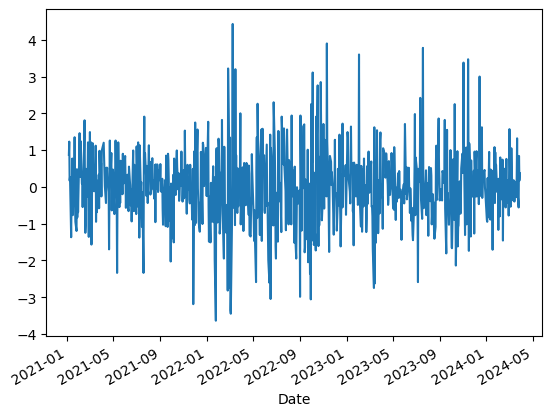

In [193]:
# Generating a basic plot for the data to validate the daily change values are coherent.  
df_FTSE250['daily_change'].plot(label='FTSE250')

<Axes: xlabel='Date'>

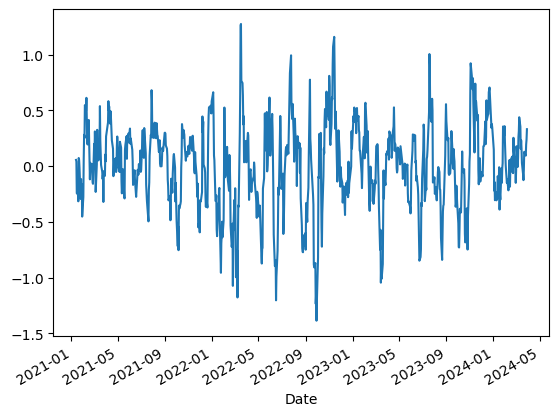

In [194]:
# The above looks coherent. We will need to roll this. Let's try 7 days.
df_FTSE250['daily_change'].rolling(window=7).mean().plot(label='FTSE250 close\n7-day Rolling')


## Overlaying the FTSE250 on sentiments.
Uncertain and Litigious.

We will be looking at the period of 2021-2024, so lets generate basic visualisations for both sentiments for this period.

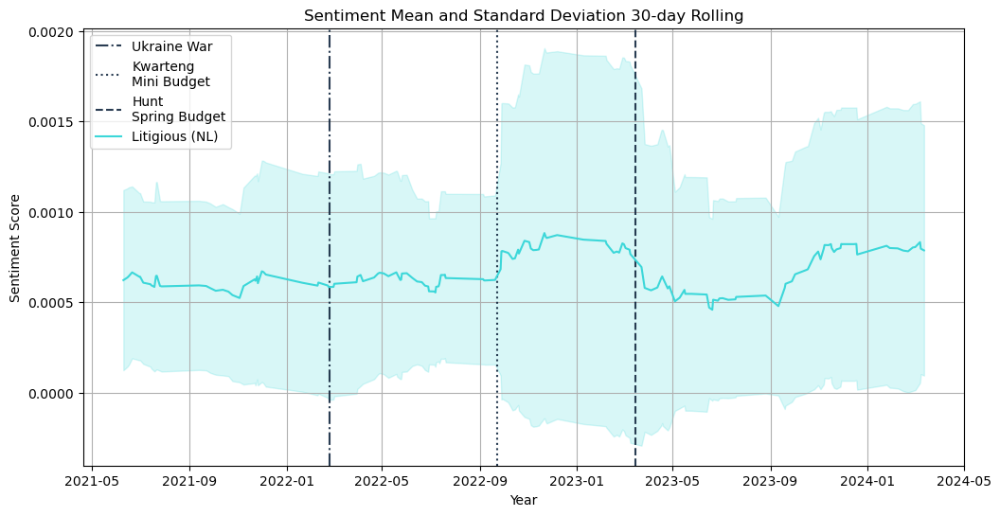

In [323]:
# Litigious sentiment plot. Rolling mean and standard deviation fill.
# Setting some 
start_date = '2021-01-01'
end_date = '2024-12-31'

# Filter vote_entropy and av_sent dataframes.
av_sent_filtered = av_sent[(av_sent.index >= start_date) & (av_sent.index <= end_date)]

# Plot the sentiment scores over time with a 30-day rolling average.
plt.figure(figsize=(12, 6))

# Add vertical lines for significant events or governor change.
plt.axvline(pd.Timestamp('2022-02-24'), color=BoE_blue, alpha=0.9, linestyle='-.', label='Ukraine War')
plt.axvline(pd.Timestamp('2022-09-23'), color=BoE_blue, alpha=0.9, linestyle=':', label='Kwarteng\nMini Budget')
plt.axvline(pd.Timestamp('2023-03-15'), color=BoE_blue, alpha=0.9, linestyle='--', label='Hunt\nSpring Budget')

# Calculate the rolling average and standard deviation for each sentiment category.
window = 30
rolling_avg = av_sent_filtered['litigious_normalised'].rolling(window=window).mean()
rolling_std = av_sent_filtered['litigious_normalised'].rolling(window=window).std()  # Calculate standard deviation
sentiment_label = 'Litigious (NL)'  # Remove '_normalised' from the sentiment label.
plt.plot(av_sent_filtered.index, rolling_avg, label=sentiment_label, color=colour_map['litigious_normalised'])

# Add confidence interval shading
plt.fill_between(av_sent_filtered.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['litigious_normalised'], alpha=0.2)

plt.title('Sentiment Mean and Standard Deviation 30-day Rolling')
plt.xlabel('Year')
plt.ylabel('Sentiment Score')
plt.legend()

# Place the legend outside the graph.
plt.legend(loc='upper left')

plt.grid(True)

# Save the plot as a PNG file.
plt.savefig('Litigious_TrussEra')

plt.show()


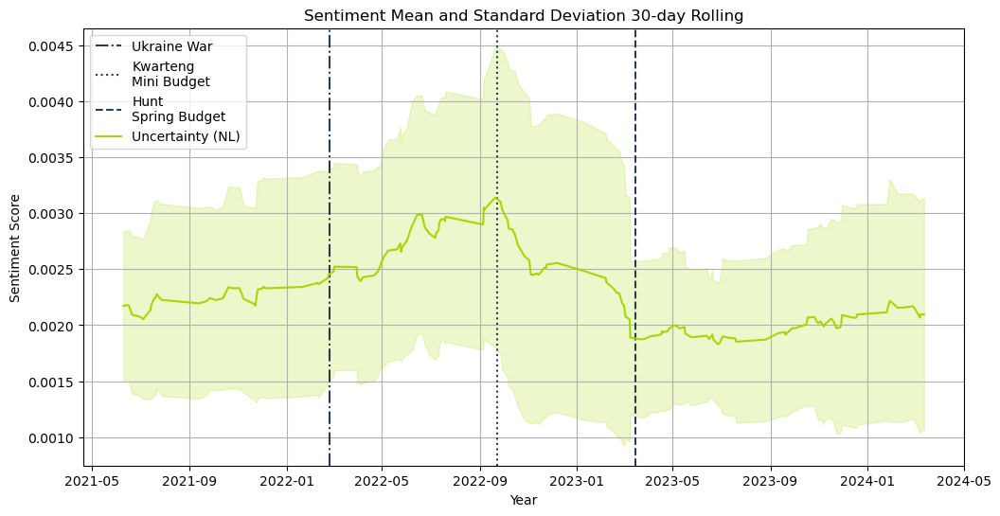

In [324]:
# Litigious sentiment plot. Rolling mean and standard deviation fill.
# Setting some 
start_date = '2021-01-01'
end_date = '2024-12-31'

# Filter vote_entropy and av_sent dataframes.
av_sent_filtered = av_sent[(av_sent.index >= start_date) & (av_sent.index <= end_date)]

# Plot the sentiment scores over time with a 30-day rolling average.
plt.figure(figsize=(12, 6))

# Add vertical lines for significant events or governor change.
plt.axvline(pd.Timestamp('2022-02-24'), color=BoE_blue, alpha=0.9, linestyle='-.', label='Ukraine War')
plt.axvline(pd.Timestamp('2022-09-23'), color=BoE_blue, alpha=0.9, linestyle=':', label='Kwarteng\nMini Budget')
plt.axvline(pd.Timestamp('2023-03-15'), color=BoE_blue, alpha=0.9, linestyle='--', label='Hunt\nSpring Budget')

# Calculate the rolling average and standard deviation for each sentiment category.
window = 30
rolling_avg = av_sent_filtered['uncertainty_normalised'].rolling(window=window).mean()
rolling_std = av_sent_filtered['uncertainty_normalised'].rolling(window=window).std()  # Calculate standard deviation
sentiment_label = 'Uncertainty (NL)'  # Remove '_normalised' from the sentiment label.
plt.plot(av_sent_filtered.index, rolling_avg, label=sentiment_label, color=colour_map['uncertainty_normalised'])

# Add confidence interval shading
plt.fill_between(av_sent_filtered.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['uncertainty_normalised'], alpha=0.2)

plt.title('Sentiment Mean and Standard Deviation 30-day Rolling')
plt.xlabel('Year')
plt.ylabel('Sentiment Score')
plt.legend()

# Place the legend outside the graph.
plt.legend(loc='upper left')

plt.grid(True)

# Save the plot as a PNG file.
plt.savefig('Uncertainty_TrussEra')

plt.show()


<b> Overlaying FTSE 250 rolling average onto these graphics.

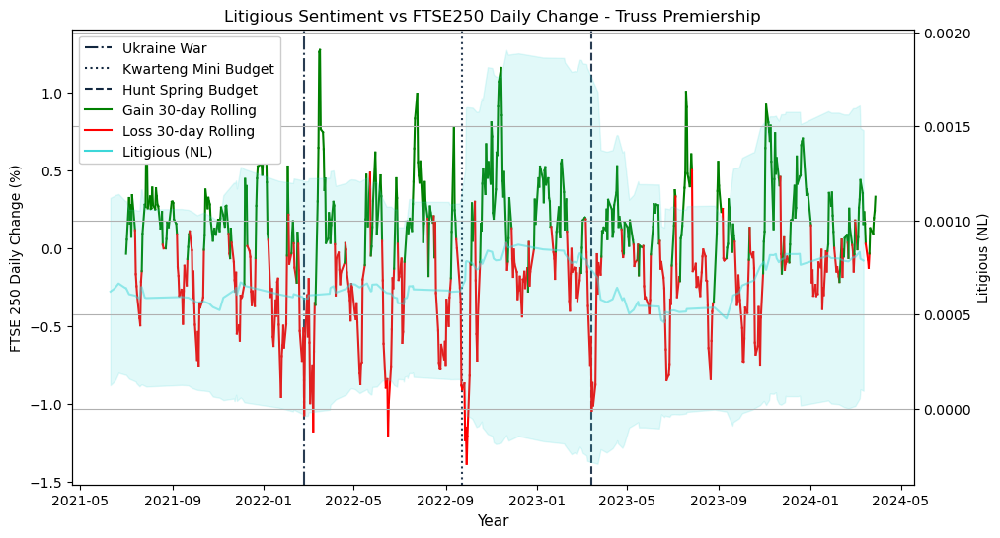

In [333]:
# Define the date range in question.
start_date = '2021-01-01'

# The rolling sentiment rolling average cuts off the first part of the date rage. We will set a different start data for FTSE to keep things aligned.
start_date2 = '2021-07-01'
end_date = '2024-12-31'

# Filter av_sent dataframe.
av_sent_filtered = av_sent[(av_sent.index >= start_date) & (av_sent.index <= end_date)]

# Define the rolling FTSE object. Se tthe window of the roll to 7 days.
av_FTSE = df_FTSE250['daily_change'].rolling(window=7).mean()

# Filter the FTSE 250 rolling mean to the defined start_date2.
av_FTSE_filtered = av_FTSE[av_FTSE.index >= start_date2]

# Create a new plot.
plt.figure(figsize=(11, 6))

# Set the x-axis label first so that it is not hidden by the below. 
plt.xlabel('Year', fontsize=11)


# Add vertical lines for significant events. Aply the BoE_blue colour.
plt.axvline(pd.Timestamp('2022-02-24'), color=BoE_blue, alpha=0.9, linestyle='-.', label='Ukraine War')
plt.axvline(pd.Timestamp('2022-09-23'), color=BoE_blue, alpha=0.9, linestyle=':', label='Kwarteng\nMini Budget')
plt.axvline(pd.Timestamp('2023-03-15'), color=BoE_blue, alpha=0.9, linestyle='--', label='Hunt\nSpring Budget')


# Plot the filtered, rolled FTSE data. We will depict periods of growth in green and loss in red.
# The below code sets up the variables that will dictate colour. i is a given day and i+1 is the subsequent day.
# Plot the filtered vote entropy on the primary y-axis.

plt.gca().set_ylabel('FTSE 250 Daily Change (%)')
for i in range(len(rolling_mean_filtered) - 1):
    x1 = av_FTSE_filtered.index[i]
    x2 = av_FTSE_filtered.index[i + 1]
    y1 = av_FTSE_filtered.iloc[i]
    y2 = av_FTSE_filtered.iloc[i + 1]
    
    if y1 >= 0 and y2 >= 0:                                # If day 1 and day 2 are greater than 0.
        plt.gca().plot([x1, x2], [y1, y2], color='green')
    elif y1 < 0 and y2 < 0:                                # If day 1 and day 2 are less than 0.
        plt.gca().plot([x1, x2], [y1, y2], color='red')

    # The above conditions must come first to ensuure changes above and below 0 behave as expected.
    # The below code ensure that the lines crossing the zero point are coloured properly (growth or contraction).

    elif y1 < y2:                                          # If day 2 is greater than day 1.
        plt.gca().plot([x1, x2], [y1, y2], color='green')
    elif y2 < y1:                                          # If day 2 is less than day 1.
        plt.gca().plot([x1, x2], [y1, y2], color='red')
    else:
        plt.gca().plot([x1, x2], [y1, y2], color='white')  # The above should cover all scenarios but apply white so that anything else appears clean.

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent_filtered['litigious_normalised'].rolling(window=30).mean()
rolling_std = av_sent_filtered['litigious_normalised'].rolling(window=30).std()         # Calculate standard deviation.
ax2 = plt.twinx()
sentiment_label = 'Litigious (NL)'
plt.plot(av_sent_filtered.index, rolling_avg, label=sentiment_label, 
         color=colour_map['litigious_normalised'], alpha=0.5)

# Add confidence interval shading.
plt.fill_between(av_sent_filtered.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['litigious_normalised'], alpha=0.15)


# We will create a custom legend for the sake of this visualisation.

# Import the below library to depict the legend with lines, as this is what we have used throughout the presentation.
import matplotlib.lines as mlines

# Define the events lines for the legend first.
event_lines = [plt.Line2D([0], [0], color=BoE_blue, linestyle='-.', label='Ukraine War'),
               plt.Line2D([0], [0], color=BoE_blue, linestyle=':', label='Kwarteng Mini Budget'),
               plt.Line2D([0], [0], color=BoE_blue, linestyle='--', label='Hunt Spring Budget')]
# Define the variable lines now.
ftse_gain_line = mlines.Line2D([], [], color='green', label='Gain 30-day Rolling')
ftse_loss_line = mlines.Line2D([], [], color='red', label='Loss 30-day Rolling')
litigious_line = mlines.Line2D([], [], color=colour_map['litigious_normalised'], label='Litigious (NL)')

# Place the legend outside the graph.
plt.legend(handles= event_lines+ [ftse_gain_line, ftse_loss_line, litigious_line],
           loc='upper left',
          framealpha=1)


# Set y-axis labels.
plt.ylabel('FTSE 250 Daily Change (%)')
plt.gca().set_ylabel('Litigious (NL)')

# Set the title.
plt.title('Litigious Sentiment vs FTSE250 Daily Change - Truss Premiership')

plt.grid(True)

# Save the plot as a PNG file.
plt.savefig('Litigious_vs_FTSE250_Truss')

plt.show()

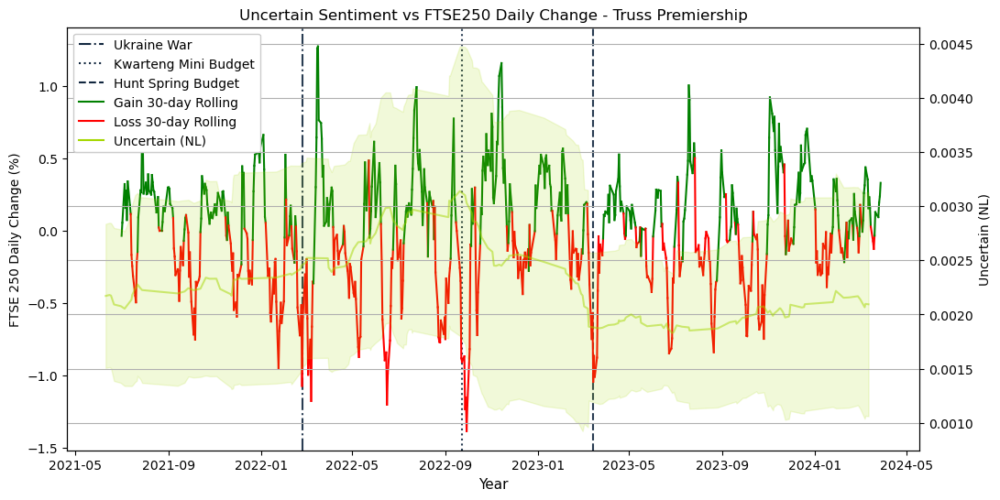

In [332]:
# Define the date range in question.
start_date = '2021-01-01'

# The rolling sentiment rolling average cuts off the first part of the date rage. We will set a different start data for FTSE to keep things aligned.
start_date2 = '2021-07-01'
end_date = '2024-12-31'

# Filter av_sent dataframe.
av_sent_filtered = av_sent[(av_sent.index >= start_date) & (av_sent.index <= end_date)]

# Define the rolling FTSE object. Se tthe window of the roll to 7 days.
av_FTSE = df_FTSE250['daily_change'].rolling(window=7).mean()

# Filter the FTSE 250 rolling mean to the defined start_date2.
av_FTSE_filtered = av_FTSE[av_FTSE.index >= start_date2]

# Create a new plot.
plt.figure(figsize=(12, 6))

# Set the x-axis label first so that it is not hidden by the below. 
plt.xlabel('Year', fontsize=11)


# Add vertical lines for significant events. Aply the BoE_blue colour.
plt.axvline(pd.Timestamp('2022-02-24'), color=BoE_blue, alpha=0.9, linestyle='-.', label='Ukraine War')
plt.axvline(pd.Timestamp('2022-09-23'), color=BoE_blue, alpha=0.9, linestyle=':', label='Kwarteng\nMini Budget')
plt.axvline(pd.Timestamp('2023-03-15'), color=BoE_blue, alpha=0.9, linestyle='--', label='Hunt\nSpring Budget')


# Plot the filtered, rolled FTSE data. We will depict periods of growth in green and loss in red.
# The below code sets up the variables that will dictate colour. i is a given day and i+1 is the subsequent day.
# Plot the filtered vote entropy on the primary y-axis.

plt.gca().set_ylabel('FTSE 250 Daily Change (%)')
for i in range(len(rolling_mean_filtered) - 1):
    x1 = av_FTSE_filtered.index[i]
    x2 = av_FTSE_filtered.index[i + 1]
    y1 = av_FTSE_filtered.iloc[i]
    y2 = av_FTSE_filtered.iloc[i + 1]
    
    if y1 >= 0 and y2 >= 0:                                # If day 1 and day 2 are greater than 0.
        plt.gca().plot([x1, x2], [y1, y2], color='green')
    elif y1 < 0 and y2 < 0:                                # If day 1 and day 2 are less than 0.
        plt.gca().plot([x1, x2], [y1, y2], color='red')

    # The above conditions must come first to ensuure changes above and below 0 behave as expected.
    # The below code ensure that the lines crossing the zero point are coloured properly (growth or contraction).

    elif y1 < y2:                                          # If day 2 is greater than day 1.
        plt.gca().plot([x1, x2], [y1, y2], color='green')
    elif y2 < y1:                                          # If day 2 is less than day 1.
        plt.gca().plot([x1, x2], [y1, y2], color='red')
    else:
        plt.gca().plot([x1, x2], [y1, y2], color='white')  # The above should cover all scenarios but apply white so that anything else appears clean.

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent_filtered['uncertainty_normalised'].rolling(window=30).mean()
rolling_std = av_sent_filtered['uncertainty_normalised'].rolling(window=30).std()         # Calculate standard deviation.
ax2 = plt.twinx()
sentiment_label = 'Uncertain (NL)'
plt.plot(av_sent_filtered.index, rolling_avg, label=sentiment_label, 
         color=colour_map['uncertainty_normalised'], alpha=0.5)

# Add confidence interval shading.
plt.fill_between(av_sent_filtered.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['uncertainty_normalised'], alpha=0.15)


# We will create a custom legend for the sake of this visualisation.

# Import the below library to depict the legend with lines, as this is what we have used throughout the presentation.
import matplotlib.lines as mlines

# Define the events lines for the legend first.
event_lines = [plt.Line2D([0], [0], color=BoE_blue, linestyle='-.', label='Ukraine War'),
               plt.Line2D([0], [0], color=BoE_blue, linestyle=':', label='Kwarteng Mini Budget'),
               plt.Line2D([0], [0], color=BoE_blue, linestyle='--', label='Hunt Spring Budget')]
# Define the variable lines now.
ftse_gain_line = mlines.Line2D([], [], color='green', label='Gain 30-day Rolling')
ftse_loss_line = mlines.Line2D([], [], color='red', label='Loss 30-day Rolling')
uncertainty_line = mlines.Line2D([], [], color=colour_map['uncertainty_normalised'], label='Uncertain (NL)')

# Place the legend outside the graph.
plt.legend(handles= event_lines+ [ftse_gain_line, ftse_loss_line, uncertainty_line],
           loc='upper left',
          framealpha=1)


# Set y-axis labels.
plt.ylabel('FTSE 250 Daily Change (%)')
plt.gca().set_ylabel('Uncertain (NL)')

# Set the title.
plt.title('Uncertain Sentiment vs FTSE250 Daily Change - Truss Premiership')

plt.grid(True)

# Save the plot as a PNG file.
plt.savefig('Uncertain_vs_FTSE250_Truss')

plt.show()

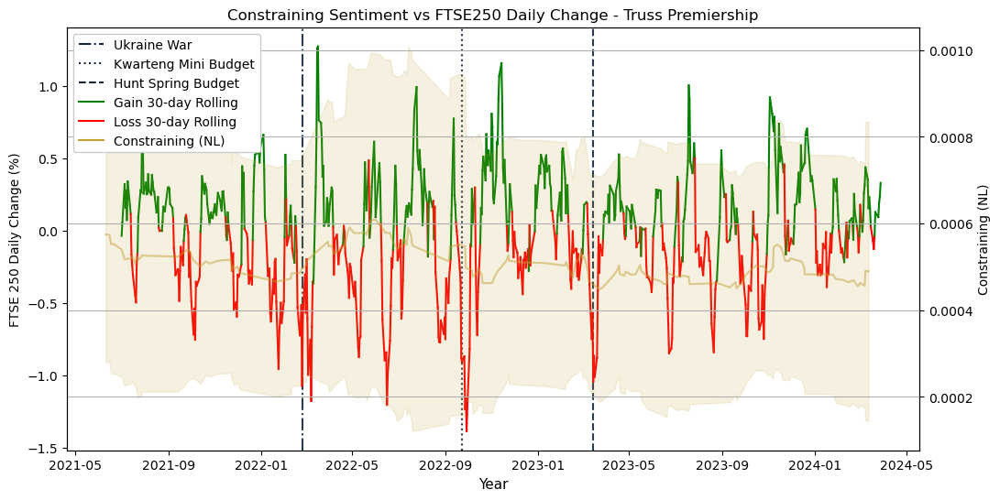

In [342]:
# Define the date range in question.
start_date = '2021-01-01'

# The rolling sentiment rolling average cuts off the first part of the date rage. We will set a different start data for FTSE to keep things aligned.
start_date2 = '2021-07-01'
end_date = '2024-12-31'

# Filter av_sent dataframe.
av_sent_filtered = av_sent[(av_sent.index >= start_date) & (av_sent.index <= end_date)]

# Define the rolling FTSE object. Se tthe window of the roll to 7 days.
av_FTSE = df_FTSE250['daily_change'].rolling(window=7).mean()

# Filter the FTSE 250 rolling mean to the defined start_date2.
av_FTSE_filtered = av_FTSE[av_FTSE.index >= start_date2]

# Create a new plot.
plt.figure(figsize=(12, 6))

# Set the x-axis label first so that it is not hidden by the below. 
plt.xlabel('Year', fontsize=11)


# Add vertical lines for significant events. Aply the BoE_blue colour.
plt.axvline(pd.Timestamp('2022-02-24'), color=BoE_blue, alpha=0.9, linestyle='-.', label='Ukraine War')
plt.axvline(pd.Timestamp('2022-09-23'), color=BoE_blue, alpha=0.9, linestyle=':', label='Kwarteng\nMini Budget')
plt.axvline(pd.Timestamp('2023-03-15'), color=BoE_blue, alpha=0.9, linestyle='--', label='Hunt\nSpring Budget')


# Plot the filtered, rolled FTSE data. We will depict periods of growth in green and loss in red.
# The below code sets up the variables that will dictate colour. i is a given day and i+1 is the subsequent day.
# Plot the filtered vote entropy on the primary y-axis.

plt.gca().set_ylabel('FTSE 250 Daily Change (%)')
for i in range(len(rolling_mean_filtered) - 1):
    x1 = av_FTSE_filtered.index[i]
    x2 = av_FTSE_filtered.index[i + 1]
    y1 = av_FTSE_filtered.iloc[i]
    y2 = av_FTSE_filtered.iloc[i + 1]
    
    if y1 >= 0 and y2 >= 0:                                # If day 1 and day 2 are greater than 0.
        plt.gca().plot([x1, x2], [y1, y2], color='green')
    elif y1 < 0 and y2 < 0:                                # If day 1 and day 2 are less than 0.
        plt.gca().plot([x1, x2], [y1, y2], color='red')

    # The above conditions must come first to ensuure changes above and below 0 behave as expected.
    # The below code ensure that the lines crossing the zero point are coloured properly (growth or contraction).

    elif y1 < y2:                                          # If day 2 is greater than day 1.
        plt.gca().plot([x1, x2], [y1, y2], color='green')
    elif y2 < y1:                                          # If day 2 is less than day 1.
        plt.gca().plot([x1, x2], [y1, y2], color='red')
    else:
        plt.gca().plot([x1, x2], [y1, y2], color='white')  # The above should cover all scenarios but apply white so that anything else appears clean.

# Plot the selected sentiment on the secondary y-axis.
rolling_avg = av_sent_filtered['constraining_normalised'].rolling(window=30).mean()
rolling_std = av_sent_filtered['constraining_normalised'].rolling(window=30).std()         # Calculate standard deviation.
ax2 = plt.twinx()
sentiment_label = 'Constraining (NL)'
plt.plot(av_sent_filtered.index, rolling_avg, label=sentiment_label, 
         color=colour_map['constraining_normalised'], alpha=0.5)

# Add confidence interval shading.
plt.fill_between(av_sent_filtered.index, rolling_avg - rolling_std, rolling_avg + rolling_std, color=colour_map['constraining_normalised'], alpha=0.15)


# We will create a custom legend for the sake of this visualisation.

# Import the below library to depict the legend with lines, as this is what we have used throughout the presentation.
import matplotlib.lines as mlines

# Define the events lines for the legend first.
event_lines = [plt.Line2D([0], [0], color=BoE_blue, linestyle='-.', label='Ukraine War'),
               plt.Line2D([0], [0], color=BoE_blue, linestyle=':', label='Kwarteng Mini Budget'),
               plt.Line2D([0], [0], color=BoE_blue, linestyle='--', label='Hunt Spring Budget')]
# Define the variable lines now.
ftse_gain_line = mlines.Line2D([], [], color='green', label='Gain 30-day Rolling')
ftse_loss_line = mlines.Line2D([], [], color='red', label='Loss 30-day Rolling')
uncertainty_line = mlines.Line2D([], [], color=colour_map['constraining_normalised'], label='Constraining (NL)')

# Place the legend outside the graph.
plt.legend(handles= event_lines+ [ftse_gain_line, ftse_loss_line, uncertainty_line],
           loc='upper left',
          framealpha=1)


# Set y-axis labels.
plt.ylabel('FTSE 250 Daily Change (%)')
plt.gca().set_ylabel('Constraining (NL)')

# Set the title.
plt.title('Constraining Sentiment vs FTSE250 Daily Change - Truss Premiership')

plt.grid(True)

# Save the plot as a PNG file.
plt.savefig('Constraining_vs_FTSE250_Truss')

plt.show()

<b> Thoughts: <b>

We can see here that the litigious and constraining sentiment were employed in opposing ways in this period, with the variance of the former widening across the Truss premiership and contracting in the latter.

The exact causes and reasons for this would warrent their own analysis. For now, we can simply see sentiment shapes or 'profiles', and observe how they appear to be dampening the effects of the crisis, as evidenced by the behaviour of the FTSE 250. We must finally point out that this is not to suggest a direct causal effect of dampening between sentiment and the FTSE 250 but instead that these two things are occuring at the same time, as part of a wider eco-system of economic behaviour.